purpose: query the EFO for parent and children terms to use for defining parallel traits in gwas catalog
based on code from obonet's tutorial:
    https://github.com/dhimmel/obonet/blob/main/examples/go-obonet.ipynb

# set-up

In [1]:
import os
import pandas as pd
import obonet as obo
import networkx as nx
import ndex2
import numpy as np
import matplotlib.pyplot as plt
from upsetplot import plot as upplot
from upsetplot import from_contents
from upsetplot import UpSet
import scipy.stats as stats
from adjustText import adjust_text

In [2]:
os.chdir('/tscc/projects/ps-palmer/brittany/SUD_cross_species/')

In [3]:
save_fig=True

# functions

In [4]:
UUIDs={
    'PCNet2.0':'d73d6357-e87b-11ee-9621-005056ae23aa',
    'PCNet2.1':'e9c574f4-e87a-11ee-9621-005056ae23aa',
    'PCNet2.2':'8b4b54fa-e87d-11ee-9621-005056ae23aa'
}

In [5]:
def import_seedgenes(path,pcol='P',gene_col='GENE NAME',delim='comma', cutoff=None):
    if delim=='comma':
        df=pd.read_csv(path,sep=',')
    else:
        df=pd.read_csv(path,sep='\t')
    if pcol==None:
        print('pvalue column not specified- all genes will be used')
        cutoff=None
    if cutoff=='bonferroni':
        df=df[df[pcol]<0.05/len(df)]
    elif cutoff=='FDR_05':
        df=df[df[pcol]<0.05]
    else:
        print('cutoff not defined/custom- using all genes ')
        df=df
    print(df.head())
    return(df)

In [6]:
def import_interactome(interactome_name=None, UUIDs=UUIDs,ndex_user=None, ndex_password=None,UUID=None):
    """
    Imports a gene interactome from the NDEx database and returns it as a NetworkX graph object. Optionally,
    the function allows for importing using a unique identifier (UUID) or by an interactome name.

    The function checks if the interactome name provided corresponds to a predefined dictionary of UUIDs. If it does, it
    retrieves the network using the specified credentials. If an interactome name is not provided but a UUID is,
    it retrieves the network using the provided UUID. The nodes of pcnet_v14 are relabelled by their gene name rather than ID number.

    Parameters:
    - interactome_name (str, optional): The name of the interactome as defined in the UUIDs dictionary. If not provided
      but a UUID is, the interactome associated with the UUID is imported instead.
    - ndex_user (str, optional): The NDEx account username for accessing private networks.
    - ndex_password (str, optional): The NDEx account password for accessing private networks.
    - UUID (str, optional): A specific UUID to directly download an interactome from NDEx if the interactome name is not used.

    Returns:
    networkx.Graph: A graph object representing the interactome. Nodes and edges represent genes and their interactions, respectively.

    Notes:
    - The function uses the NDEx2 Python client and requires Internet access to NDEx's servers.
    - Depending on the access rights of the NDEx account, private or public interactomes can be retrieved.
    - The function prints the number of nodes and edges of the imported graph for diagnostic purposes.

    Raises:
    - ValueError: If neither an interactome name nor a UUID is provided.
    """    
    interactome_uuid=UUIDs[interactome_name]
    print(interactome_name)
    ndex_server='public.ndexbio.org'
    #import network based on provided interactome key
    if (interactome_name in UUIDs.keys()):
        graph = ndex2.create_nice_cx_from_server(
                    ndex_server, 
                    username=ndex_user, 
                    password=ndex_password, 
                    uuid=interactome_uuid
                ).to_networkx()
        if (interactome_name=='pcnet_v14'):
            graph=nx.relabel_nodes(graph, nx.get_node_attributes(graph, 'HGNC Symbol'))
        # print out interactome num nodes and edges for diagnostic purposes
        print('number of nodes:')
        print(len(graph.nodes))
        print('\nnumber of edges:')
        print(len(graph.edges))
        return(graph)
    elif(interactome_name==None & UUID!=None):
        print('using novel UUID. For UUIDs used in this study, see UUID_dict')
        graph = ndex2.create_nice_cx_from_server(
            ndex_server, 
            username=ndex_user, 
            password=ndex_password, 
            uuid=UUID
        ).to_networkx()
        # print out interactome num nodes and edges for diagnostic purposes
        print('number of nodes:')
        print(len(graph.nodes))
        print('\nnumber of edges:')
        print(len(graph.edges))
        return(graph)
    else:
        print('UUID/interactome name not provided- please provide either to import interactome.')

In [7]:
def format_catalog(catalog=None):
	try:
		#make all annotations lowercase for consistency for querying
		catalog['MAPPED_TRAIT']=catalog['MAPPED_TRAIT'].str.lower()
		catalog['DISEASE/TRAIT']=catalog['DISEASE/TRAIT'].str.lower()
		#filter for genes that were mapped
		mapped=catalog[~catalog['MAPPED_GENE'].isna()]
		mapped=mapped[~mapped['MAPPED_TRAIT'].isna()]
		mapped=mapped[['MAPPED_GENE','MAPPED_TRAIT','DISEASE/TRAIT','PUBMEDID']]
		mapped.columns=['GENE','MAPPED_TRAIT','DISEASE/TRAIT','PUBMEDID']
		#filter for genes that were reported
		rep=catalog[~catalog['REPORTED GENE(S)'].isna()]
		rep=rep[~rep['MAPPED_TRAIT'].isna()]
		rep=rep[~rep['REPORTED GENE(S)'].str.contains('Intergenic')]
		rep=rep[['REPORTED GENE(S)','MAPPED_TRAIT','DISEASE/TRAIT','PUBMEDID']]
		rep.columns=['GENE','MAPPED_TRAIT','DISEASE/TRAIT','PUBMEDID']
		cat=pd.concat([rep, mapped])
		cat['GENE']=cat['GENE'].str.split('; ')
		cat=cat.explode('GENE')
		cat=cat[~(cat['GENE'].str.contains('mapped'))]
		cat['GENE']=cat['GENE'].str.split(', ')
		cat=cat.explode('GENE')
		cat['GENE']=cat['GENE'].str.split(' - ')
		cat=cat.explode('GENE')
		cat['GENE']=cat['GENE'].astype('str')
		cat=cat[~(cat['GENE'].str.contains('intergenic'))]
		cat['TRAIT']=cat['MAPPED_TRAIT'] + ": " +cat['DISEASE/TRAIT']+ " (PMID: "+(cat['PUBMEDID'].astype(str))+")"
		cat=cat.dropna()
		return(cat)
	except:
		print('please add gwas catalog file.')

In [8]:
def calculate_enrichment(t, coloc_dict_cat, k):
    
    # Extract the genes associated with the parent term

    # Calculate values for the contingency table
    M = len(coloc_dict_cat['graph'])  # Population size: genes in PCNet annotated in the GWAS catalog
    n = len(coloc_dict_cat['graph'].intersection(t))  # Genes in PCNet annotated for the trait of interest
    N = len(coloc_dict_cat['net'])  # Genes in the network annotated in the GWAS catalog
    x = len(coloc_dict_cat['net'].intersection(t))  # Genes in network annotated for the trait of interest

    # Build contingency table
    contingency_table = [
        [x, N - x],
        [n - x, M - N - (n - x)]
    ]

    # Perform Fisher's exact test
    odds_ratio, p_intersect = stats.fisher_exact(contingency_table, alternative='greater')
    gene_list=t.intersection(coloc_dict_cat['net'])
    # Create the results dictionary
    print(f"Enrichment of network nodes in genes in the GWAS catalog annotated for {k}: p={p_intersect}")
    print(f"Odds ratio: OD={odds_ratio}")
    print(f"Number of annotated genes in PCNet: {len(t.intersection(coloc_dict_cat['graph']))}")
    print(f"Number of annotated genes in network: {len(t.intersection(coloc_dict_cat['net']))}\n")

    return  odds_ratio, p_intersect, gene_list

## FUNCTION TO GET DESCENDENTS FROM EFO NETWORK

In [9]:
#return list set of traits in EFO ontology including parent- reported by name
def return_efo_descendents_name(graph,id_to_name, term):
    l=list(sorted(id_to_name[subterm] for subterm in nx.ancestors(graph, term))) #descendents get subterms- not sure why but I tested it and OBONET says so as well
    l.append(id_to_name[term])
    return list(set(l))

In [10]:
#return list set of traits in EFO ontology including parent- reported by name
def return_efo_ancestors_name(graph,id_to_name, term):
    print('getting ancestors for '+term+' : '+id_to_name[term])
    l=list((id_to_name[supterm] for supterm in nx.descendants(graph, term))) #descendents get superterms- not sure why
    #l.append(id_to_name[term])
    return list(set(l))

# import network genelists

## Interactome Set-up

pcnet2- versions 
from wright et al. 2024 preprint:
PCNet 2.0= best-performing ranked composite (top 15 interactomes, 3.85M interactions)
PCNet 2.1= top 8 interactomes, 1.75M interactions
PCNet 2.2= top 10 co-citation-free interactomes, 3.32M interactions 

In [11]:
interactome_name='PCNet2.0'

In [ ]:
graph=import_interactome(interactome_name)

PCNet2.0


In [ ]:
all_nodes=list(graph.nodes())

## import NPS scores and seed genes

In [ ]:
mag_dir='magma/seed_genes/'
file_dict={
    'loco':mag_dir+'loco_win10_annot.tsv',
    'loco_gsem':mag_dir+'loco_gsem_annot.tsv',
    'ext_munged':mag_dir+'ext_munged_annot.tsv',
    'ext':mag_dir+'ext_orig_annot.tsv'
}

In [ ]:
seed_dict={}

In [ ]:
loco=pd.read_csv(file_dict['loco'],sep='\t')
loco_bonf_cut=2.6389402016150313e-06 #calculated in define_seed_genes_orthologs- from raw magma results before adding in ortholog info
seed_dict['loco_FDR']=(set(loco[loco['Q']<0.05]['HM_ORTHO']))
seed_dict['loco_bonf']=(set(loco[loco['P']<loco_bonf_cut]['HM_ORTHO']))

In [ ]:
#locomotor- gsem common factor
loco_gsem=pd.read_csv(file_dict['loco_gsem'],sep='\t')
loco_gsem_bonf_cut=2.650129856362962e-06 #calculated in define_seed_genes_orthologs- from raw magma results before adding in ortholog info
seed_dict['loco_gsem_FDR']=(set(loco_gsem[loco_gsem['Q']<0.05]['HM_ORTHO']))
seed_dict['loco_gsem_bonf']=(set(loco_gsem[loco_gsem['P']<loco_gsem_bonf_cut]['HM_ORTHO']))

In [ ]:
ext=pd.read_csv(file_dict['ext'],sep='\t')
ext_bonf_cut=0.05/len(ext) # no ortholog adding, so can calculate from this table
seed_dict['ext_FDR']=(set(ext[ext['Q']<0.05]['GENE']))
seed_dict['ext_bonf']=(set(ext[ext['P']<ext_bonf_cut]['GENE']))

In [ ]:
'''ext=pd.read_csv(file_dict['ext'],sep='\t')
ext_bonf_cut=0.05/len(ext) # no ortholog adding, so can calculate from this table
seed_dict['ext_munged_FDR']=(set(ext[ext['Q']<0.05]['GENE']))
seed_dict['ext_munged_bonf']=(set(ext[ext['P']<ext_bonf_cut]['GENE']))'''

In [ ]:
seed_dict['ext_top500']=set(ext[(ext['GENE'].isin(all_nodes))].nsmallest(500,'P')['GENE'])

In [ ]:
seed_dict.keys()

In [ ]:
NPS_dict={}
for k in seed_dict.keys():
    for u in UUIDs.keys():
        p=('network_scores/'+k+'_'+u+'_zscore.tsv')
        if os.path.isfile(p):
            t=pd.read_csv('network_scores/'+k+'_'+u+'_zscore.tsv',header=None, sep='\t')
            t.index=t[0]
            t=t.drop(columns=[0])
            t=t[1].squeeze()
            t = pd.DataFrame({'z':t})
            NPS_dict[k+'_'+u]=t

In [ ]:
NPS_dict_series={}
for k in seed_dict.keys():
    for u in UUIDs.keys():
        p=('network_scores/'+k+'_'+u+'_zscore.tsv')
        if os.path.isfile(p):
            t=pd.read_csv('network_scores/'+k+'_'+u+'_zscore.tsv',header=None, sep='\t')
            t.index=t[0]
            t=t.drop(columns=[0])
            #t=t[1].squeeze()
            #t = pd.DataFrame({'z':t})
            NPS_dict_series[k+'_'+u]=t

In [ ]:
NPS_dict.keys()

## choose datasets for analysis- put gene lists into dictionary

In [ ]:
cut_single=1.5
cut_comb=3

In [ ]:
cut_r= 'FDR'
#cut_h='bonf'
cut_h=None
trait_r='loco_gsem'
trait_h='ext_top500'

#labels
if cut_h==None:
    label_h=trait_h
else:
    label_h=trait_h+'_'+cut_h
if cut_r==None:
    label_r=trait_r
else:
    label_r=trait_r+'_'+cut_r
#seed genes
seed_r=seed_dict[label_r]
seed_h=seed_dict[label_h]
#NPS scores
NPS_r=NPS_dict[label_r+'_'+interactome_name]
NPS_h=NPS_dict[label_h+'_'+interactome_name]

In [ ]:
NPS_r.merge(NPS_h)
NPS = NPS_h.join(NPS_r, lsuffix="h", rsuffix="r")
NPS = NPS.assign(zhr=NPS.zh * NPS.zr)

In [ ]:
coloc_dict={
    'seed_r':seed_r,
    'seed_h':seed_h,
    'seed_hm':list(set(seed_r).intersection(seed_h)),
    'net':list(NPS[(NPS.zh>cut_single)&(NPS.zr>cut_single)&(NPS.zhr>cut_comb)].index),
    'graph':all_nodes
}

# import the network of EFO terms

In [ ]:
#graphical representation of the EFO ontology database
graph = obo.read_obo('https://www.ebi.ac.uk/efo/efo.obo')

In [ ]:
#get id from name or name from ID
id_to_name = {id_: data.get('name') for id_, data in graph.nodes(data=True)}
name_to_id = {data['name']: id_ for id_, data in graph.nodes(data=True) if 'name' in data}

In [ ]:
nodes=list(graph.nodes())

In [ ]:
# check for non-specific network names
[x for x in nodes if ('_' in x)]
#some nodes contain "_" and some contain ":"- WHY- only the 2 BAO entries, an inexplicable URL, and NCBITaxon_Union- just replace BAO
#BAO_x are Cycline-6-phospah
# ['BAO_0000875']:'Cyclic adenosine monophosphate'
# ['BAO_0000925']:'Glucose-6-phosphate'
# NCBITaxon_Union_0000023 has no definition online.

#not going to replace substring- but here's the code for that

#nodesf=set([(lambda x: x.replace('_',':'))(x) for x in nodes])
#len(set(nodes))-len(nodesf)
#length is equal so not redundant

In [ ]:
[x for x in nodes if ('BAO' in x)]

In [ ]:
[id_to_name[x] for x in nodes if ('NCIT' in x)]

In [ ]:
nx.is_directed_acyclic_graph(graph) #undirected network??? HOW???

# import EFO table from GWAS catalog

In [ ]:
#ontology mapping table for GWAS catalog
onto=pd.read_csv('validation_datasets/trait_mappings.txt',sep='\t')

In [ ]:
onto['EFO_term']=onto['EFO URI'].apply(lambda x: x.split('/')[len(x.split('/'))-1])
onto['EFO_term']=onto['EFO_term'].str.replace('_',':')

In [ ]:
onto['EFO_parent']=onto['Parent URI'].apply(lambda x: x.split('/')[len(x.split('/'))-1])
onto['EFO_parent']=onto['EFO_parent'].str.replace('_',':')

In [ ]:
onto['Disease trait']=onto['Disease trait'].str.lower()
o=set(onto['Disease trait'])
e=(set(onto['EFO_term']))

In [ ]:
onto['EFO_parent_idtoname']=onto['EFO_parent'].map(id_to_name)

In [ ]:
onto[['Parent term','EFO_parent_idtoname','EFO_parent']].drop_duplicates()

## import gwas catalog associations

In [ ]:
gwas_catalog=pd.read_csv('validation_datasets/gwas-catalog_v1.0.2_20240807.tsv',sep='\t',low_memory=False)
cat=format_catalog(gwas_catalog)

In [ ]:
cat=cat.merge(onto, left_on='DISEASE/TRAIT',right_on='Disease trait')

# redefine parent terms in GWAS catalog ontology table

parent terms in the GWAS catalog are at random depths within the catalog, which is confusing for the enrichment analysis. To fix this, I'm going to redefine them in the following terms:

disease
measurement
biological function
experimental factor (if not present in the above 3)
NR- not in EFO

this way, most of the parents will be in one of the above terms, THEN, we can look at children in a more informative way

In [ ]:
sorted(set(onto['EFO_parent_idtoname'].dropna()))

## identify shared parent terms

In [ ]:
parents=set(cat['EFO_parent'])
parents.discard('NR')
for k in sorted(parents):
    print(id_to_name[k])
    if k in nodes:
        #return_efo_ancestors_name(graph,id_to_name,k)
        #print(': \n')
        print((list((id_to_name[supterm] for supterm in nx.descendants(graph, k))))) #descendents get superterms- not sure why)
        print('\n')
    else:
        print(' not in EFO. \n')

## define new parent catagories

In [ ]:
par=['disease','measurement','biological_process','experimental factor']

In [ ]:
par_children={}
for x in par:
    par_children[x]=nx.ancestors(graph,name_to_id[x])

In [ ]:
par_children['experimental factor']=par_children['experimental factor']-par_children['biological_process']-par_children['measurement']-par_children['disease']

In [ ]:
par_children_terms={}
for j in par_children.keys():
    print(j)
    par_children_terms[j]=[id_to_name[k] for k in list(par_children[j])]

In [ ]:
import json 

In [ ]:
os.getcwd()

## make upset plot showing overlap of new parent traits

In [ ]:
par_children_cat={}
for x in par:
    par_children_cat[x]=par_children[x].intersection(set(onto.EFO_term))

In [ ]:
#check overlap for only traits in the GWAS catalog
table=from_contents(par_children_cat)  
UpSet(table, subset_size='count',show_counts=True).plot()
if save_fig:
    plt.savefig('figures/' + 'gwas_catalog_parent_upset.pdf')

In [ ]:
#check for all traits
table=from_contents(par_children)  
UpSet(table, subset_size='count',show_counts=True).plot()
if save_fig:
    plt.savefig('figures/' + 'gwas_catalog_parent_upset.pdf')

# check gwas catalog for NEW parent term enrichment

In [52]:
coloc_dict_cat={}
for k in coloc_dict.keys():
    coloc_dict_cat[k]=set(coloc_dict[k]).intersection(list(cat['GENE'].dropna()))

In [53]:
#catalog of genes present in the gwas catalog with annotations for the given traits
enr_tbl=pd.DataFrame(columns=['trait','parent_trait','network_genes','odds_ratio','p_intersect'])

for p in par:
    #select parent term
    print('analyzing '+p)
    t=set(cat[cat.EFO_term.isin(par_children[p])]['GENE'].dropna())
    odds_ratio, p_intersect, gene_list= calculate_enrichment(t,coloc_dict_cat,p)
    if (len(gene_list)>0):
        enr_tbl = pd.concat([pd.DataFrame([[p, p, gene_list, odds_ratio, p_intersect]], columns=enr_tbl.columns), enr_tbl], ignore_index=True)


analyzing disease
Enrichment of network nodes in genes in the GWAS catalog annotated for disease: p=0.10710049851650598
Odds ratio: OD=1.342777283699657
Number of annotated genes in PCNet: 16013
Number of annotated genes in network: 271

analyzing measurement
Enrichment of network nodes in genes in the GWAS catalog annotated for measurement: p=0.44804803285814887
Odds ratio: OD=1.123106734685807
Number of annotated genes in PCNet: 17142
Number of annotated genes in network: 284

analyzing biological_process
Enrichment of network nodes in genes in the GWAS catalog annotated for biological_process: p=0.00036620289429474366
Odds ratio: OD=1.8095084209341212
Number of annotated genes in PCNet: 14366
Number of annotated genes in network: 259

analyzing experimental factor
Enrichment of network nodes in genes in the GWAS catalog annotated for experimental factor: p=7.995718606775585e-08
Odds ratio: OD=1.8778772378516624
Number of annotated genes in PCNet: 8066
Number of annotated genes in ne

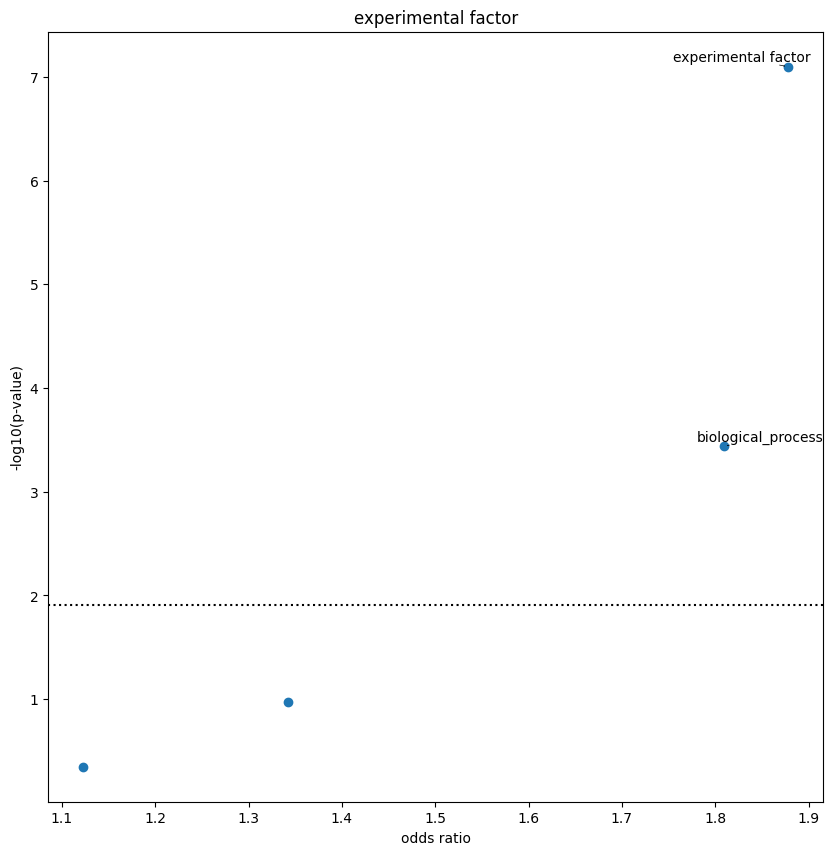

<Figure size 640x480 with 0 Axes>

In [55]:
t=enr_tbl
fig=plt.figure(figsize=(10,10))
fig=plt.scatter(x=t.odds_ratio,y=-np.log10(t.p_intersect))
fig=plt.xlabel('odds ratio')
fig=plt.ylabel('-log10(p-value)')
fig=plt.title(p)
fig=plt.axhline(-np.log10(0.05/len(enr_tbl)),color='black',ls=':')
#fig=plt.axhline(-np.log10(0.05/len(t)),color='black',ls=':')
texts=[]
for i in t.index:
    if (t.p_intersect[i]<(0.05/len(enr_tbl))):
        texts.append(plt.annotate(t.trait[i], (t.odds_ratio[i], -np.log10(t.p_intersect[i]))))

# Adjust text to avoid overlap
adjust_text(texts, only_move={'points': 'y', 'texts': 'y'}, 
            arrowprops=dict(arrowstyle="->", color='black', lw=0.5))


plt.show()
plt.clf()

In [57]:
depth=0
enr_tbl['depth']=depth
enr_concat=enr_tbl

# check for enrichment of OLD parent traits of GWAS catalog

In [135]:
#catalog of genes present in the gwas catalog with annotations for the given traits
parent_dict={}
parent_dict_genes={}
parent_dict_or={}
for k in sorted(set(cat['Parent term'])):
    t = set(cat[cat['Parent term'] == k]['GENE'].dropna())
    odds_ratio, p_intersect, gene_list= calculate_enrichment(t,coloc_dict_cat,k)
    parent_dict[k]=-np.log10(p_intersect)
    parent_dict_or[k]=odds_ratio
    parent_dict_genes[k]=gene_list


Enrichment of network nodes in genes in the GWAS catalog annotated for Biological process: p=1.1698729929598903e-18
Odds ratio: OD=2.904543289451015
Number of annotated genes in PCNet: 7627
Number of annotated genes in network: 200

Enrichment of network nodes in genes in the GWAS catalog annotated for Body measurement: p=5.476160225738402e-05
Odds ratio: OD=1.6210997963340121
Number of annotated genes in PCNet: 10018
Number of annotated genes in network: 198

Enrichment of network nodes in genes in the GWAS catalog annotated for Cancer: p=8.38565224992333e-05
Odds ratio: OD=1.600754286225883
Number of annotated genes in PCNet: 5135
Number of annotated genes in network: 115

Enrichment of network nodes in genes in the GWAS catalog annotated for Cardiovascular disease: p=1.5357355028592735e-05
Odds ratio: OD=1.758044243338361
Number of annotated genes in PCNet: 3560
Number of annotated genes in network: 89

Enrichment of network nodes in genes in the GWAS catalog annotated for Cardiovas

In [136]:
cat.columns

Index(['GENE', 'MAPPED_TRAIT', 'DISEASE/TRAIT', 'PUBMEDID', 'TRAIT',
       'Disease trait', 'EFO term', 'EFO URI', 'Parent term', 'Parent URI',
       'EFO_term', 'EFO_parent', 'EFO_parent_idtoname'],
      dtype='object')

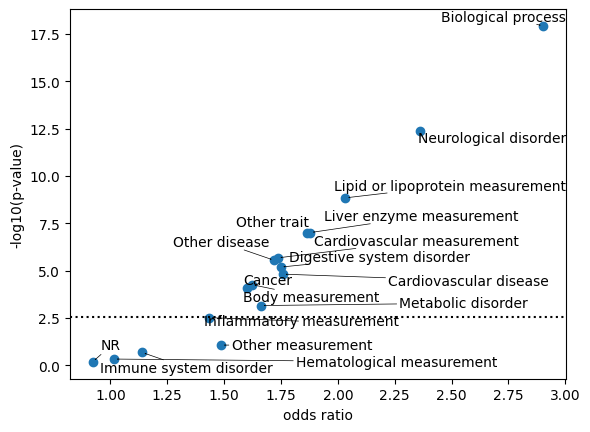

In [137]:
plt.scatter(x=parent_dict_or.values(),y=parent_dict.values())
plt.xlabel('odds ratio')
plt.ylabel('-log10(p-value)')
plt.axhline(-np.log10(0.05/len(set(cat['Parent term']))),color='black',ls=':',label='bonferroni')

texts = []
for i in parent_dict_or.keys():
    texts.append(plt.annotate(i, (parent_dict_or[i], parent_dict[i])))

# Adjust text to avoid overlap
adjust_text(texts, only_move={'points': 'y', 'texts': 'y'}, 
            arrowprops=dict(arrowstyle="->", color='black', lw=0.5))



Text(0.5, 0, 'GWAS Catalog Parent Term')

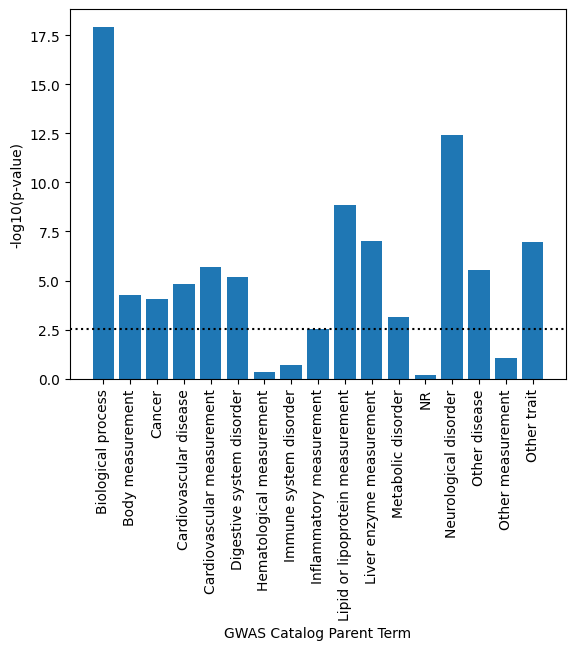

In [138]:
plt.bar(x=parent_dict.keys(),height=parent_dict.values())
plt.xticks(rotation=90)
plt.ylabel('-log10(p-value)')
plt.axhline(-np.log10(0.05/len(set(cat['Parent term']))),color='black',ls=':')
plt.xlabel('GWAS Catalog Parent Term')

# check for enrichment of CHILDREN of new parent traits of GWAS catalog

### write looping enrichment function

In [58]:
#catalog of genes present in the gwas catalog with annotations for the given traits
enr_tbl=pd.DataFrame(columns=['trait','parent_trait','network_genes','odds_ratio','p_intersect'])

for p in par:
    #select parent term
    print('analyzing '+p)
    #get all children terms (not all descendents, just first level children)- loop over
    for c in list(map(lambda x: id_to_name[x],list(graph.predecessors(name_to_id[p])))):
        children=return_efo_descendents_name(graph,id_to_name, name_to_id[c])
        # get all children- use all terms as subterm
        t=set(cat[cat['EFO term'].isin(children)]['GENE'].dropna())
        odds_ratio, p_intersect, gene_list= calculate_enrichment(t,coloc_dict_cat,c)
        if (len(gene_list)>0):
            enr_tbl = pd.concat([pd.DataFrame([[c, p, gene_list, odds_ratio, p_intersect]], columns=enr_tbl.columns), enr_tbl], ignore_index=True)
    

analyzing disease
Enrichment of network nodes in genes in the GWAS catalog annotated for Kaposi's sarcoma cell: p=1.0
Odds ratio: OD=nan
Number of annotated genes in PCNet: 0
Number of annotated genes in network: 0

Enrichment of network nodes in genes in the GWAS catalog annotated for cardiovascular disease: p=1.7691908030542714e-06
Odds ratio: OD=1.7455084572155075
Number of annotated genes in PCNet: 8132
Number of annotated genes in network: 174

Enrichment of network nodes in genes in the GWAS catalog annotated for digestive system disease: p=4.825764839486236e-07
Odds ratio: OD=1.8088365723229425
Number of annotated genes in PCNet: 8547
Number of annotated genes in network: 183

Enrichment of network nodes in genes in the GWAS catalog annotated for genetic disorder: p=1.1460857581488657e-05
Odds ratio: OD=1.6606832484267307
Number of annotated genes in PCNet: 6966
Number of annotated genes in network: 151

Enrichment of network nodes in genes in the GWAS catalog annotated for repr

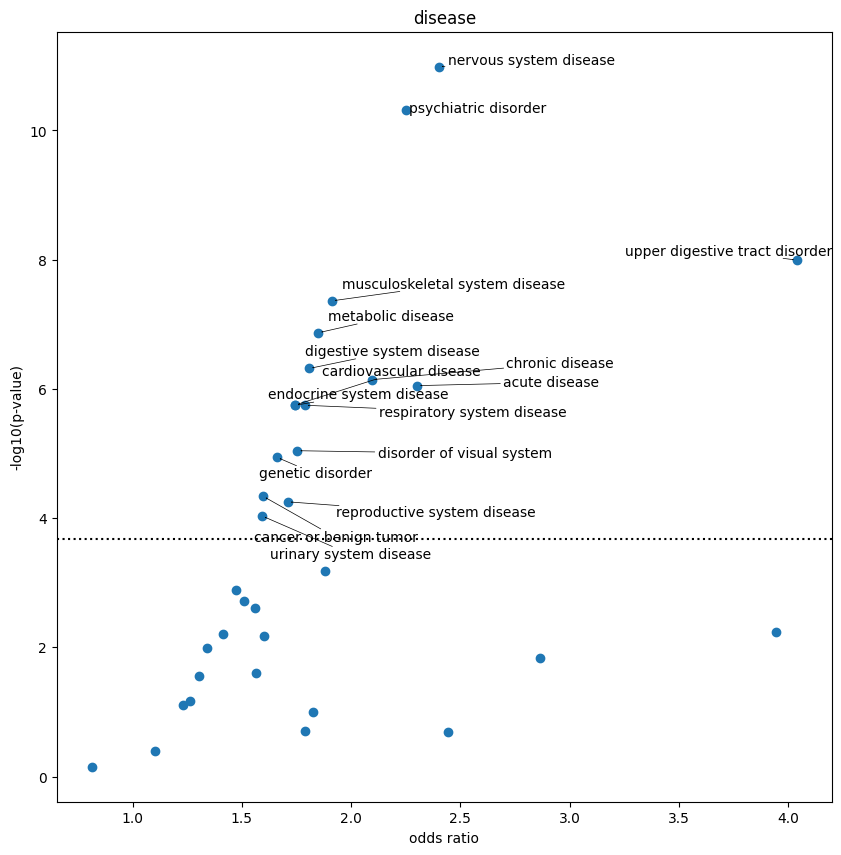

<Figure size 640x480 with 0 Axes>

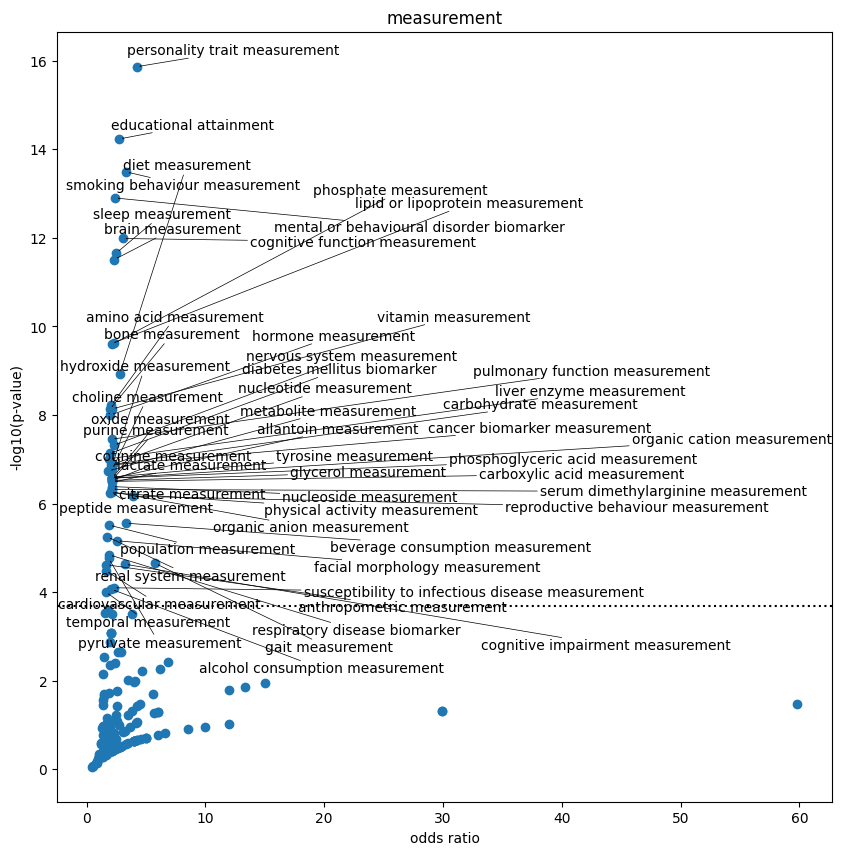

<Figure size 640x480 with 0 Axes>

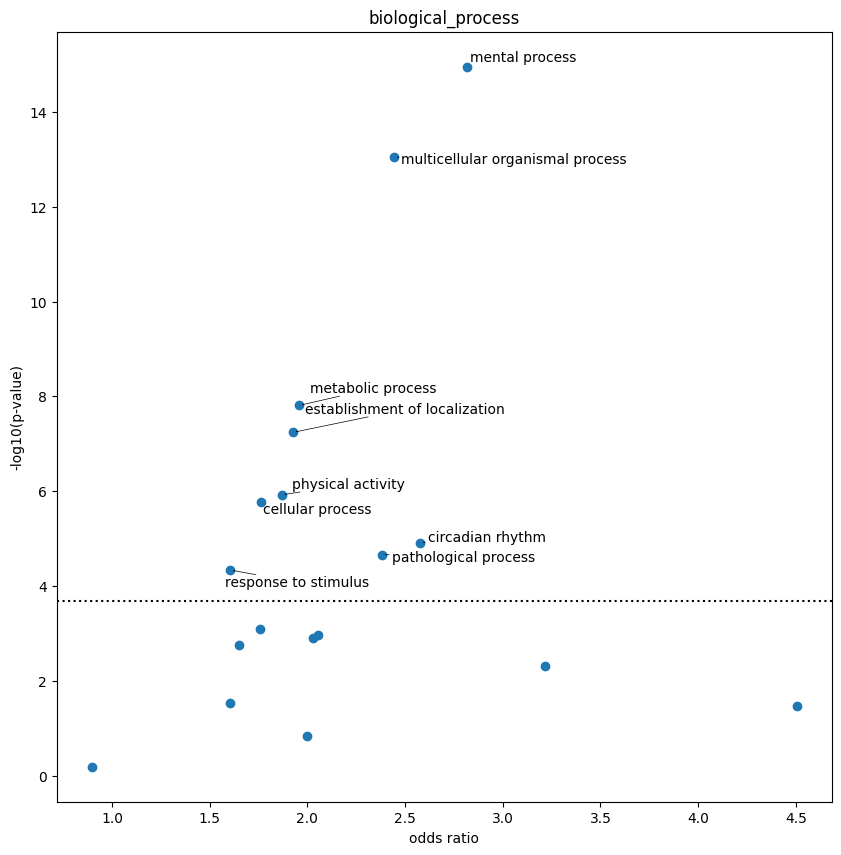

<Figure size 640x480 with 0 Axes>

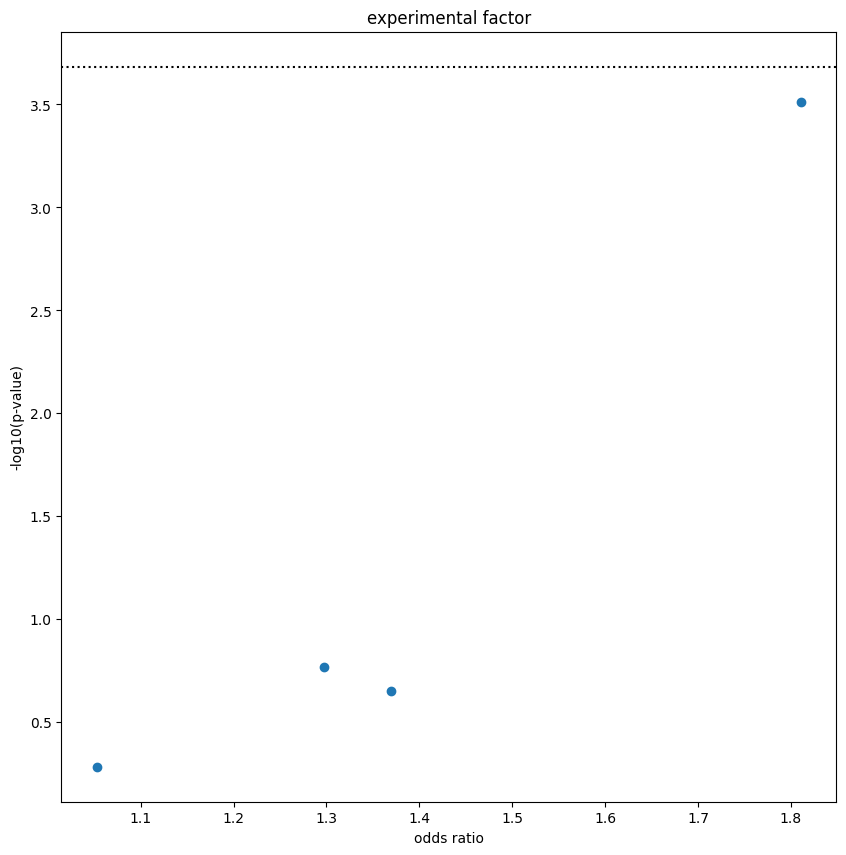

<Figure size 640x480 with 0 Axes>

In [140]:
for p in par:
    t=enr_tbl[enr_tbl['parent_trait']==p]
    fig=plt.figure(figsize=(10,10))
    fig=plt.scatter(x=t.odds_ratio,y=-np.log10(t.p_intersect))
    fig=plt.xlabel('odds ratio')
    fig=plt.ylabel('-log10(p-value)')
    fig=plt.title(p)
    fig=plt.axhline(-np.log10(0.05/len(enr_tbl)),color='black',ls=':')
    #fig=plt.axhline(-np.log10(0.05/len(t)),color='black',ls=':')
    texts=[]
    for i in t.index:
        if (t.p_intersect[i]<(0.05/len(enr_tbl))):
            texts.append(plt.annotate(t.trait[i], (t.odds_ratio[i], -np.log10(t.p_intersect[i]))))

    # Adjust text to avoid overlap
    adjust_text(texts, only_move={'points': 'y', 'texts': 'y'}, 
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5))


    plt.show()
    plt.clf()

In [141]:
enr_tbl[enr_tbl['p_intersect']<0.05/len(enr_tbl)]

,trait,parent_trait,network_genes,odds_ratio,p_intersect
4,pathological process,biological_process,"{CACNA1D, SOX11, NRXN3, A3GALT2, SDK2, ZNF322,...",2.382503,2.174429e-05
5,establishment of localization,biological_process,"{SOX11, NBEAL1, PIK3R1, KBTBD4, DLG4, ZDHHC17,...",1.924931,5.772674e-08
6,response to stimulus,biological_process,"{CACNA1D, SOX11, NBEAL1, PIK3R1, KIF1A, GRIN2B...",1.604892,4.608559e-05
11,multicellular organismal process,biological_process,"{CACNA1D, SOX11, NBEAL1, PIK3R1, KIF1A, GRIN2B...",2.443564,8.915291e-14
13,cellular process,biological_process,"{CACNA1D, SOX11, NBEAL1, PIK3R1, GRIN2B, MAPK1...",1.762796,1.664422e-06
...,...,...,...,...,...
234,metabolic disease,disease,"{CACNA1D, SOX11, NBEAL1, PIK3R1, GRIN2B, A3GAL...",1.850596,1.351872e-07
237,reproductive system disease,disease,"{PIK3R1, MAPK10, DLG4, THUMPD2, KIAA1549L, GAB...",1.711228,5.600515e-05
238,genetic disorder,disease,"{CACNA1D, SOX11, PIK3R1, KIF1A, GRIN2B, MAPK10...",1.660683,1.146086e-05
239,digestive system disease,disease,"{CACNA1D, SOX11, NBEAL1, PIK3R1, GRIN2B, MAPK1...",1.808837,4.825765e-07


In [60]:
depth=depth+1
enr_tbl['depth']=depth

In [61]:
enr_concat=pd.concat([enr_concat,enr_tbl])

# check for enrichment of GRAND-CHILDREN of new parent traits of GWAS catalog

In [154]:
#parent_tbl=enr_tbl[enr_tbl['p_intersect']<0.05/len(enr_tbl)]

In [62]:
parent_tbl=enr_tbl

In [63]:
parent_tbl.trait

0               information entity
1                  material entity
2                material property
3                          process
4             pathological process
                  ...             
236         head and neck disorder
237    reproductive system disease
238               genetic disorder
239       digestive system disease
240         cardiovascular disease
Name: trait, Length: 241, dtype: object

In [64]:
#catalog of genes present in the gwas catalog with annotations for the given traits
parent_tbl=enr_tbl
enr_tbl=pd.DataFrame(columns=['trait','parent_trait','network_genes','odds_ratio','p_intersect'])

for p in parent_tbl.trait:
    #select parent term
    print('analyzing '+p)
    #get all children terms (not all descendents, just first level children)- loop over
    for c in list(map(lambda x: id_to_name[x],list(graph.predecessors(name_to_id[p])))):
        grand_children=return_efo_descendents_name(graph,id_to_name, name_to_id[c])
        # get all grand children- use all terms as subterm
        t=set(cat[cat['EFO term'].isin(grand_children)]['GENE'].dropna())
        odds_ratio, p_intersect, gene_list= calculate_enrichment(t,coloc_dict_cat,c)
        if (len(gene_list)>0):
            enr_tbl = pd.concat([pd.DataFrame([[c, p, gene_list, odds_ratio, p_intersect]], columns=enr_tbl.columns), enr_tbl], ignore_index=True)
    

analyzing information entity
Enrichment of network nodes in genes in the GWAS catalog annotated for clinical history: p=0.061237229255938386
Odds ratio: OD=2.0701014671602906
Number of annotated genes in PCNet: 211
Number of annotated genes in network: 7

Enrichment of network nodes in genes in the GWAS catalog annotated for epigenetic factor: p=0.8177839601510756
Odds ratio: OD=0.5885324833853248
Number of annotated genes in PCNet: 102
Number of annotated genes in network: 1

Enrichment of network nodes in genes in the GWAS catalog annotated for test result: p=0.6056464477910705
Odds ratio: OD=0.9509784345047924
Number of annotated genes in PCNet: 318
Number of annotated genes in network: 5

Enrichment of network nodes in genes in the GWAS catalog annotated for measurement: p=0.508937782099803
Odds ratio: OD=1.0612289772389611
Number of annotated genes in PCNet: 17110
Number of annotated genes in network: 283

Enrichment of network nodes in genes in the GWAS catalog annotated for inst

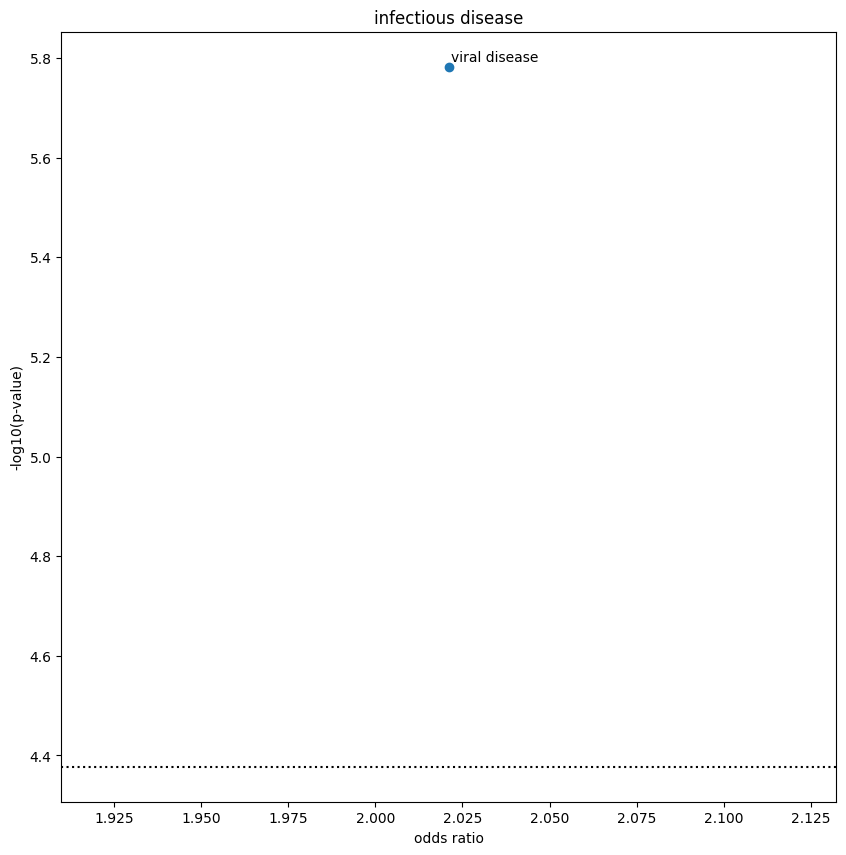

<Figure size 640x480 with 0 Axes>

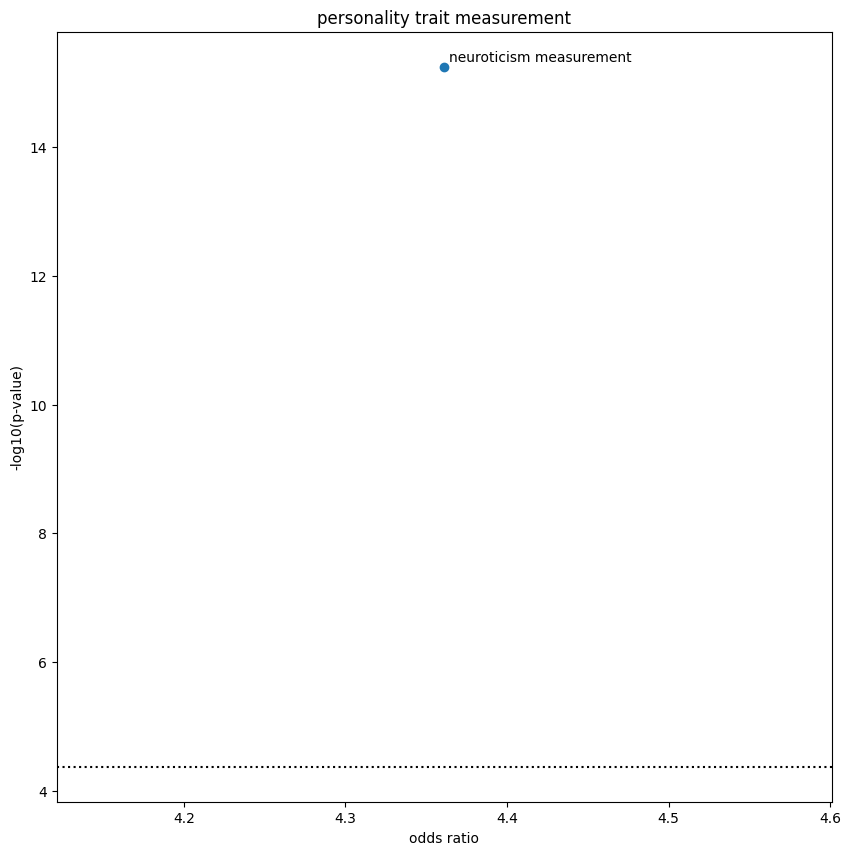

<Figure size 640x480 with 0 Axes>

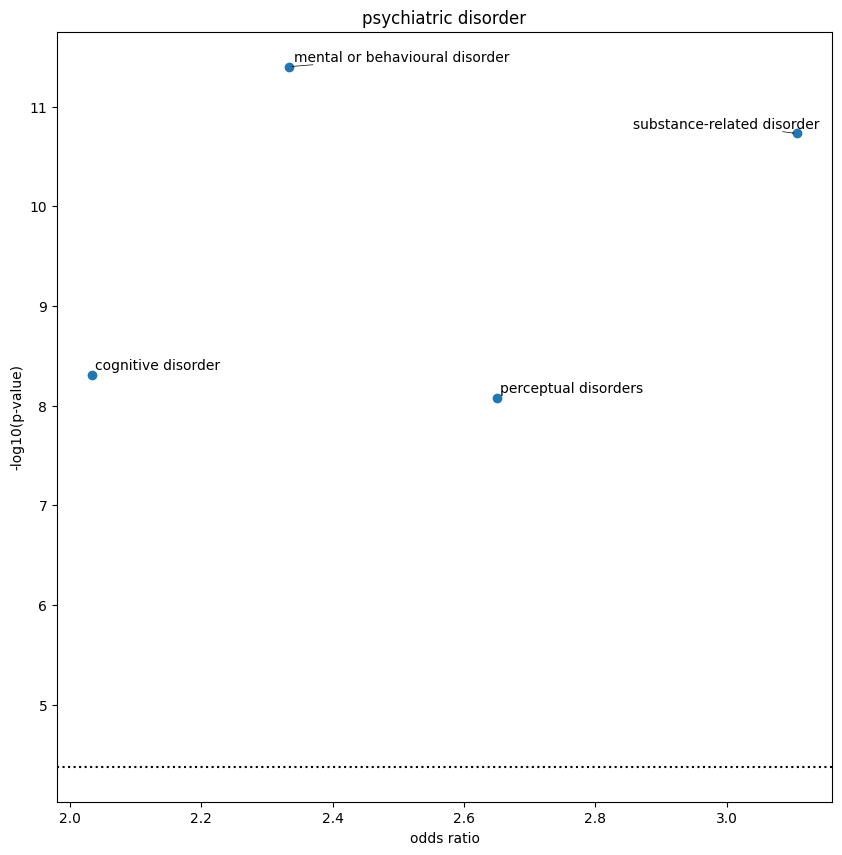

<Figure size 640x480 with 0 Axes>

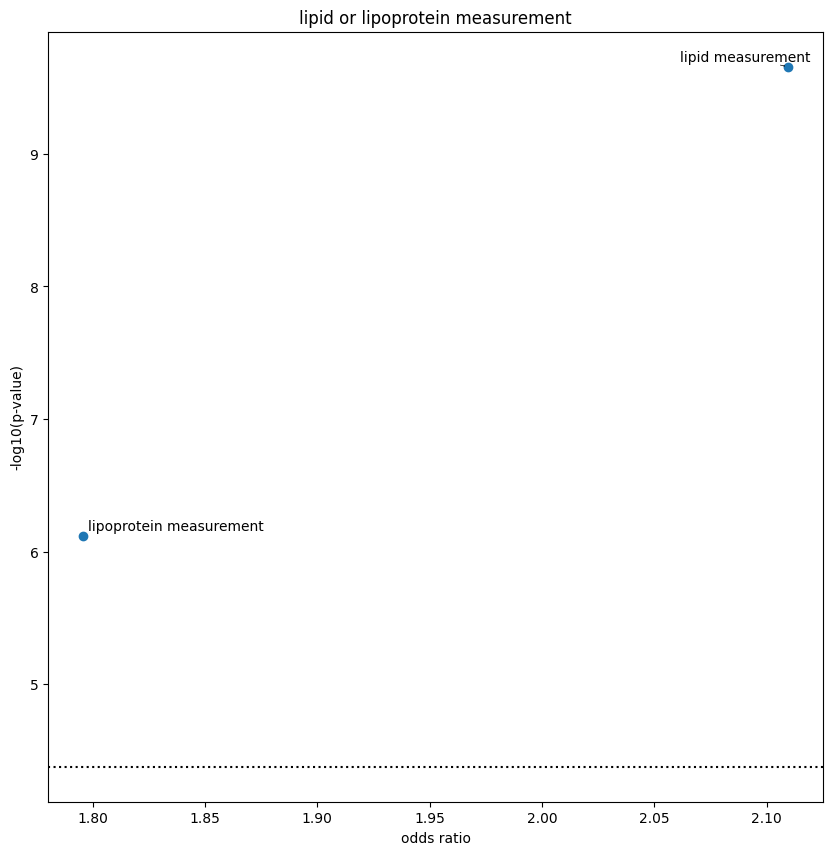

<Figure size 640x480 with 0 Axes>

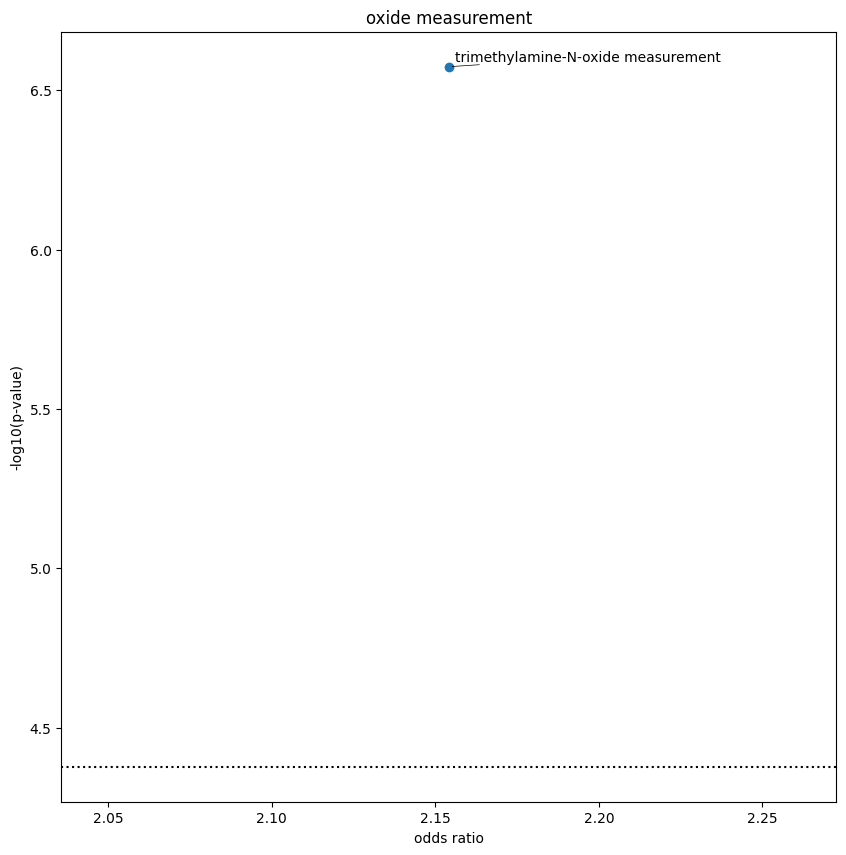

<Figure size 640x480 with 0 Axes>

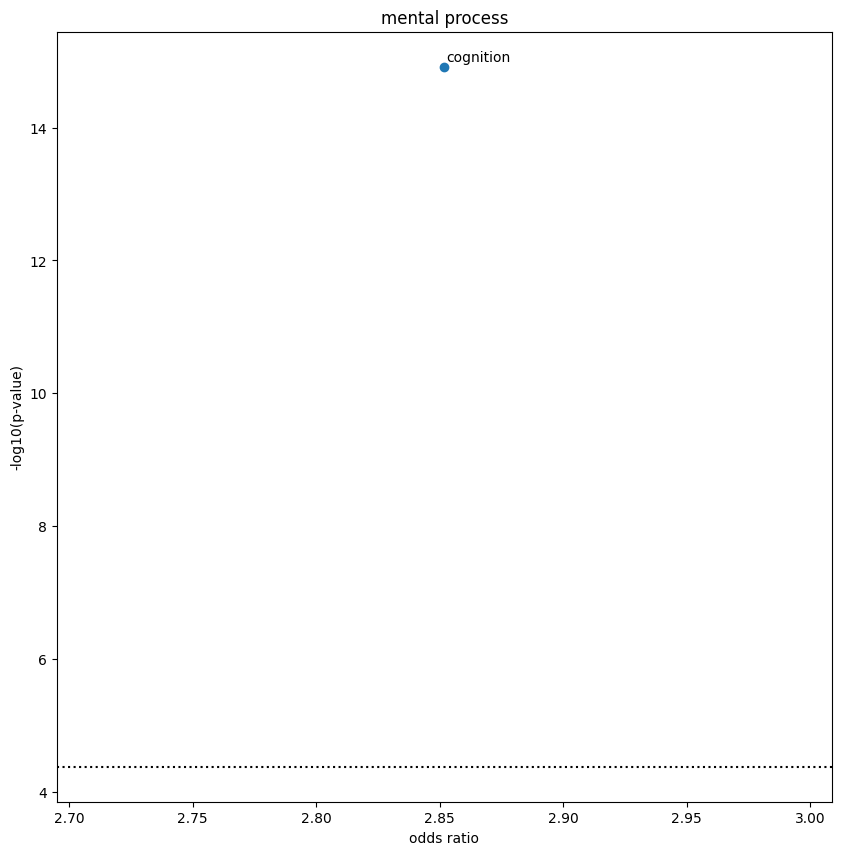

<Figure size 640x480 with 0 Axes>

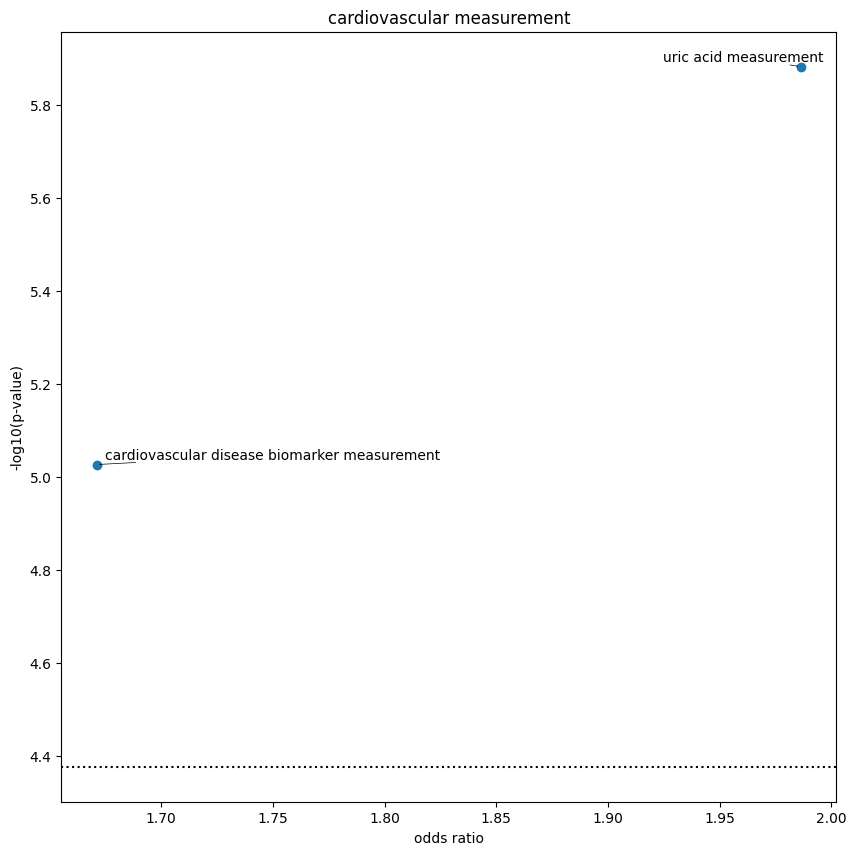

<Figure size 640x480 with 0 Axes>

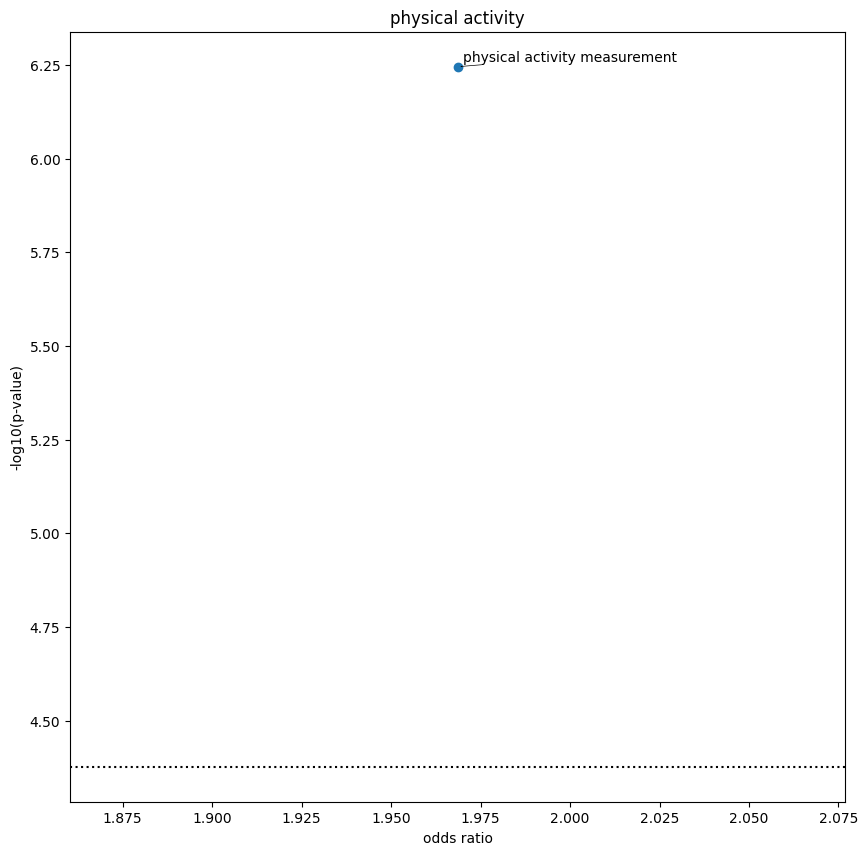

<Figure size 640x480 with 0 Axes>

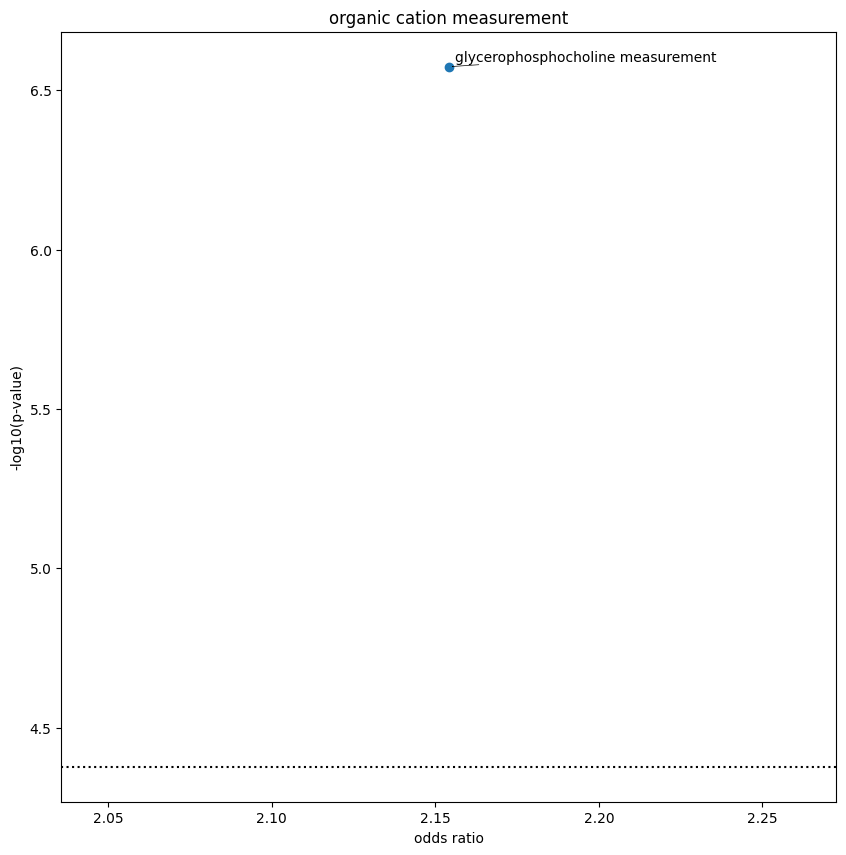

<Figure size 640x480 with 0 Axes>

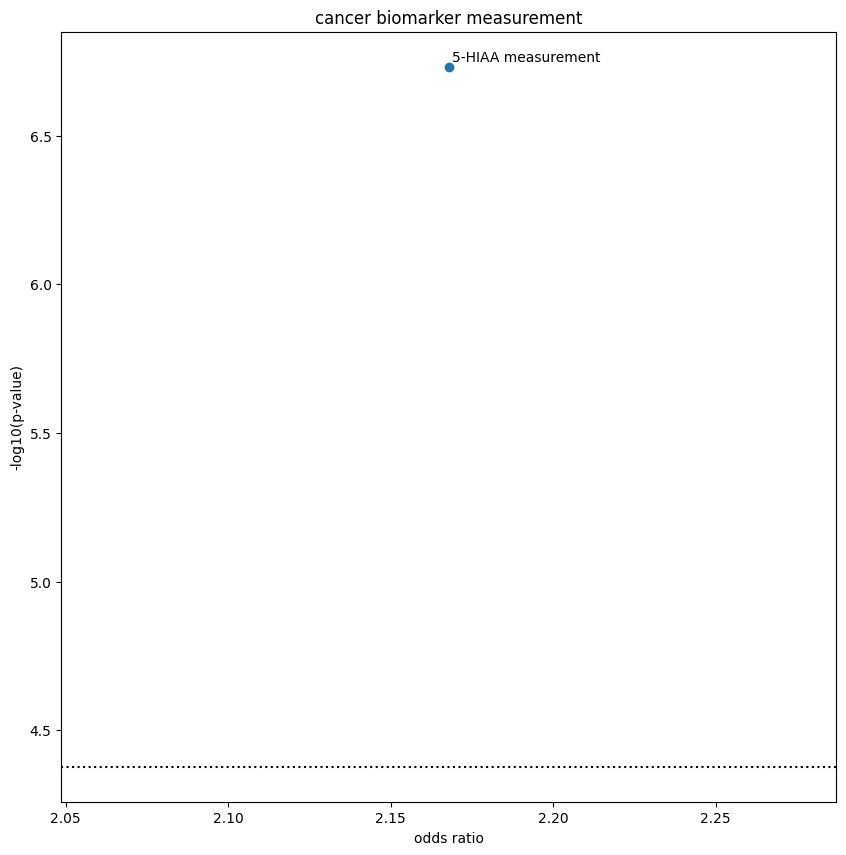

<Figure size 640x480 with 0 Axes>

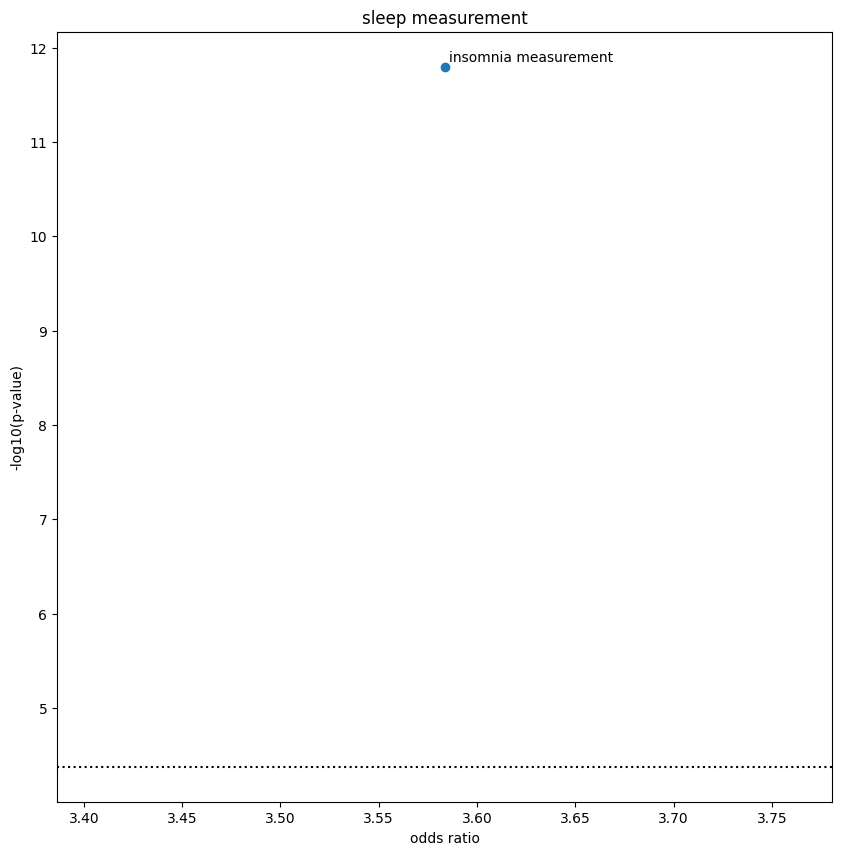

<Figure size 640x480 with 0 Axes>

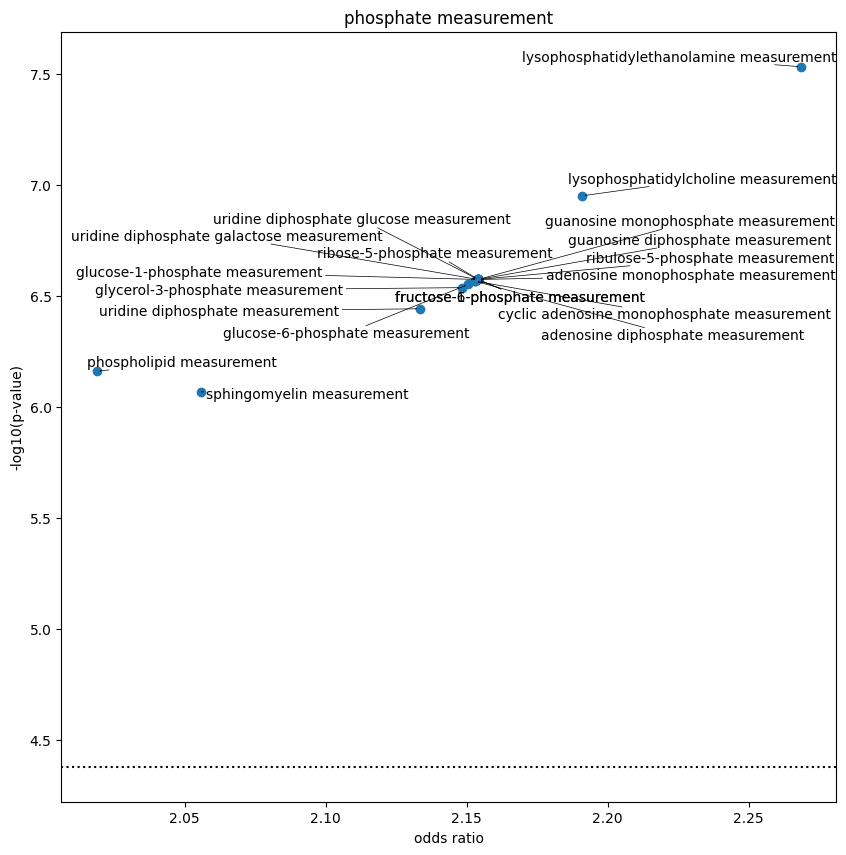

<Figure size 640x480 with 0 Axes>

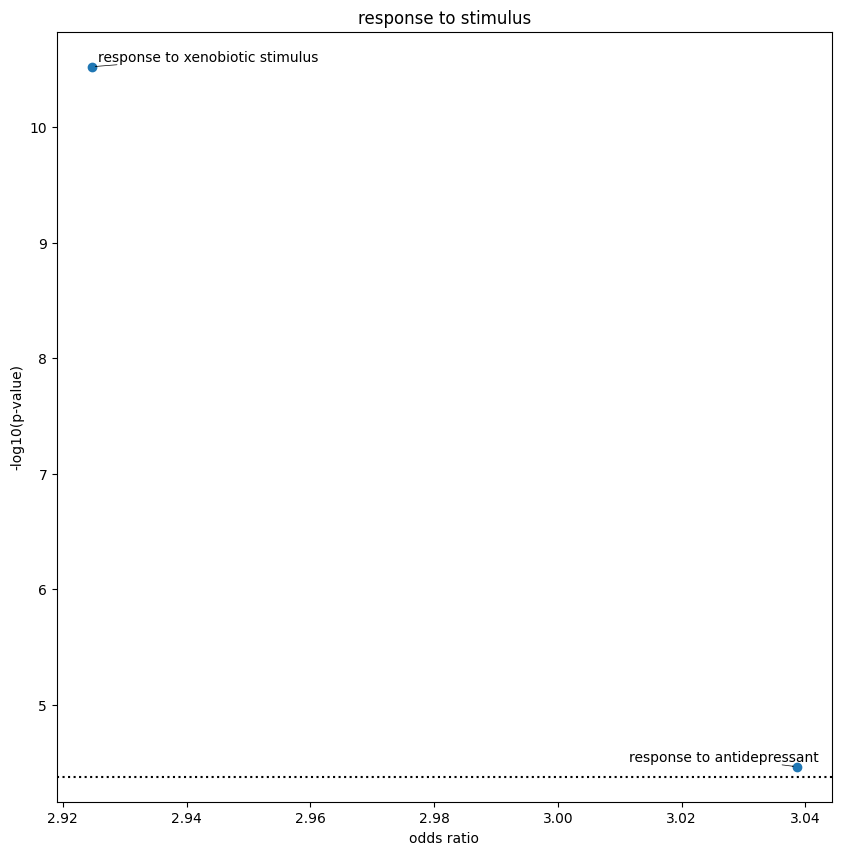

<Figure size 640x480 with 0 Axes>

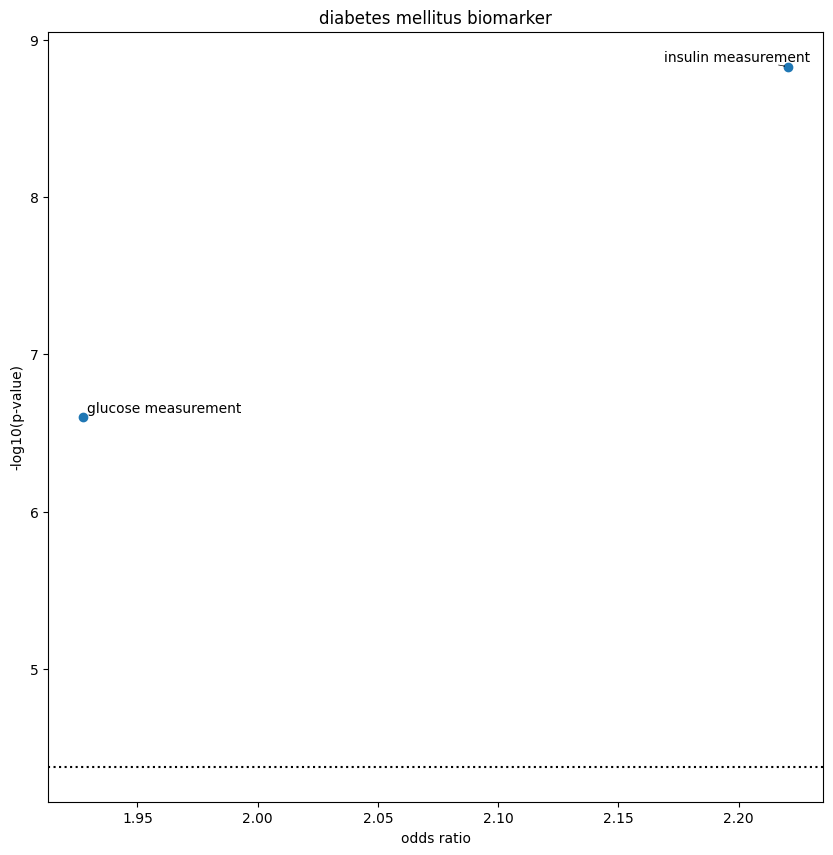

<Figure size 640x480 with 0 Axes>

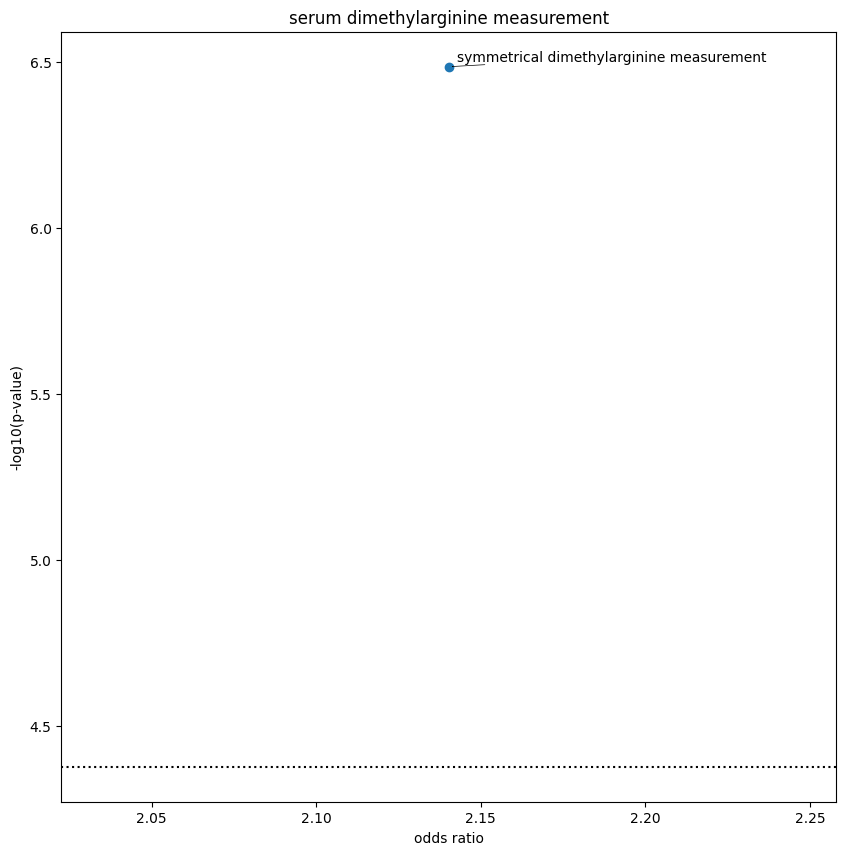

<Figure size 640x480 with 0 Axes>

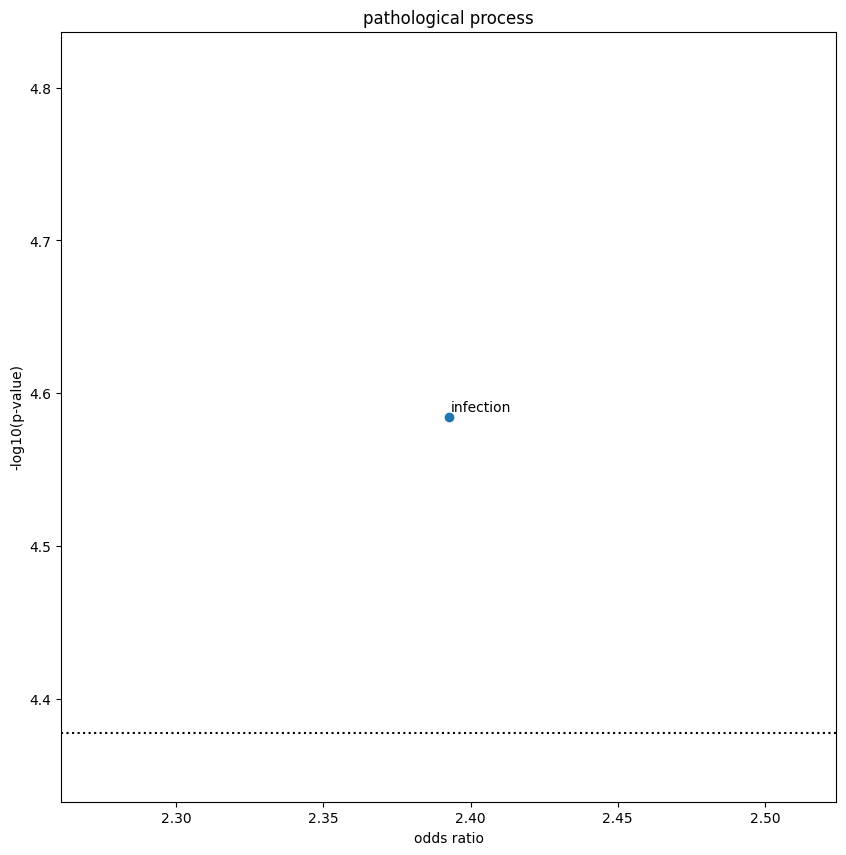

<Figure size 640x480 with 0 Axes>

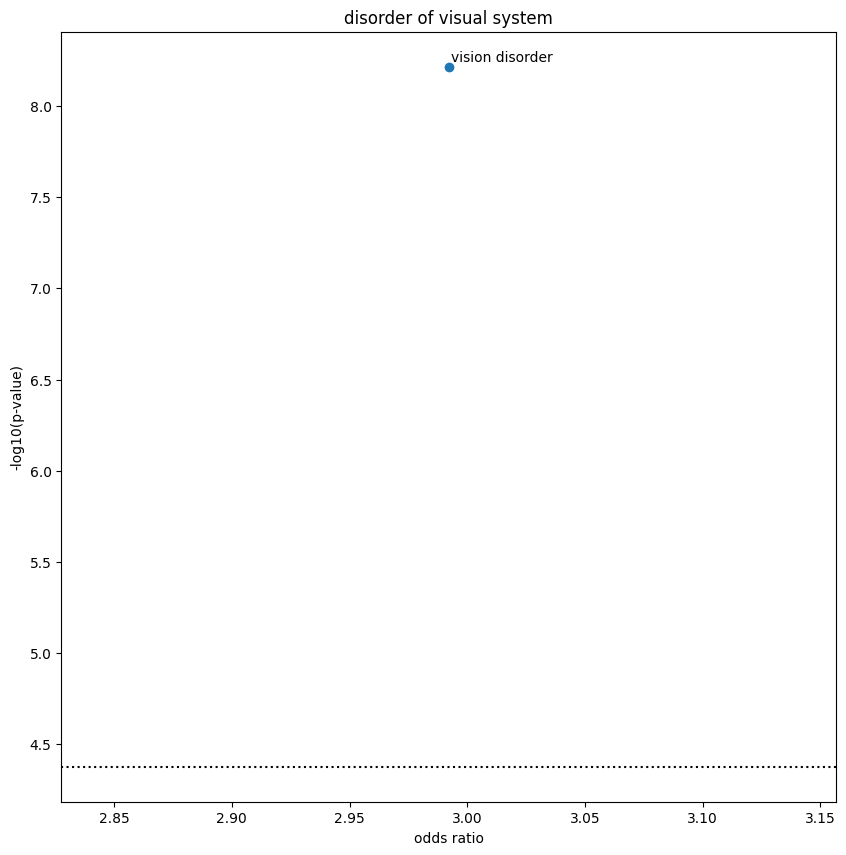

<Figure size 640x480 with 0 Axes>

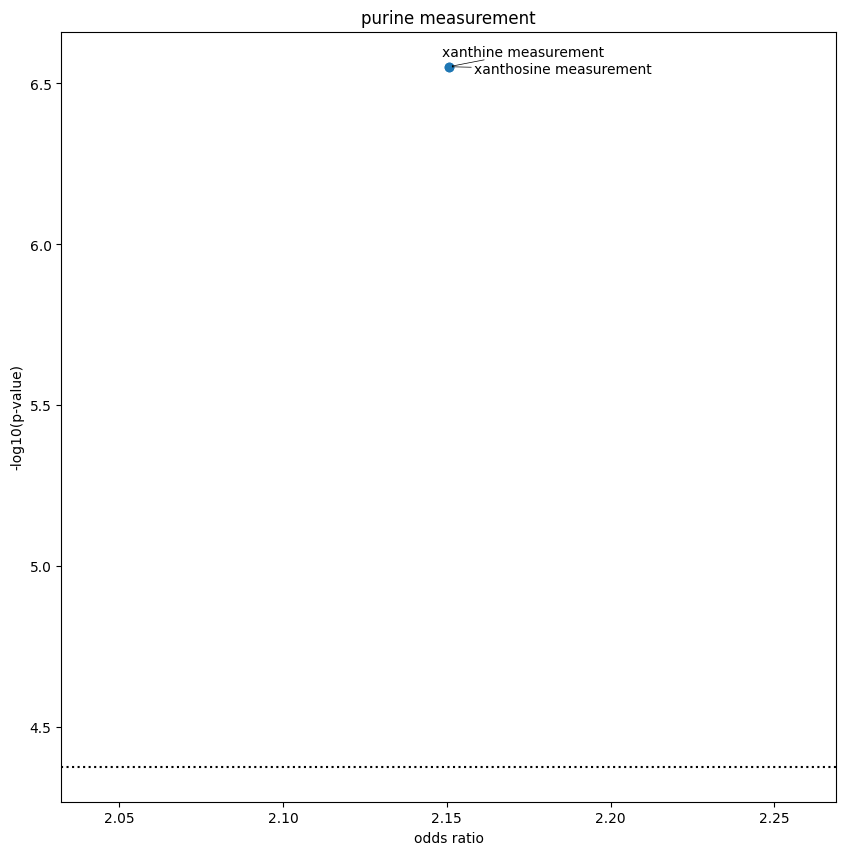

<Figure size 640x480 with 0 Axes>

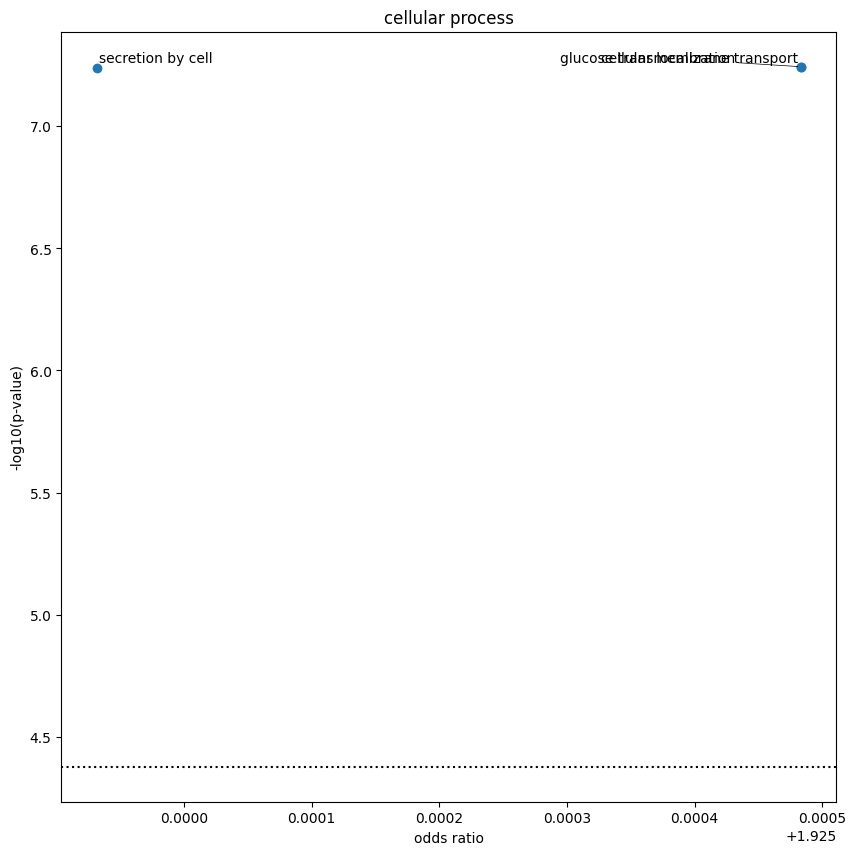

<Figure size 640x480 with 0 Axes>

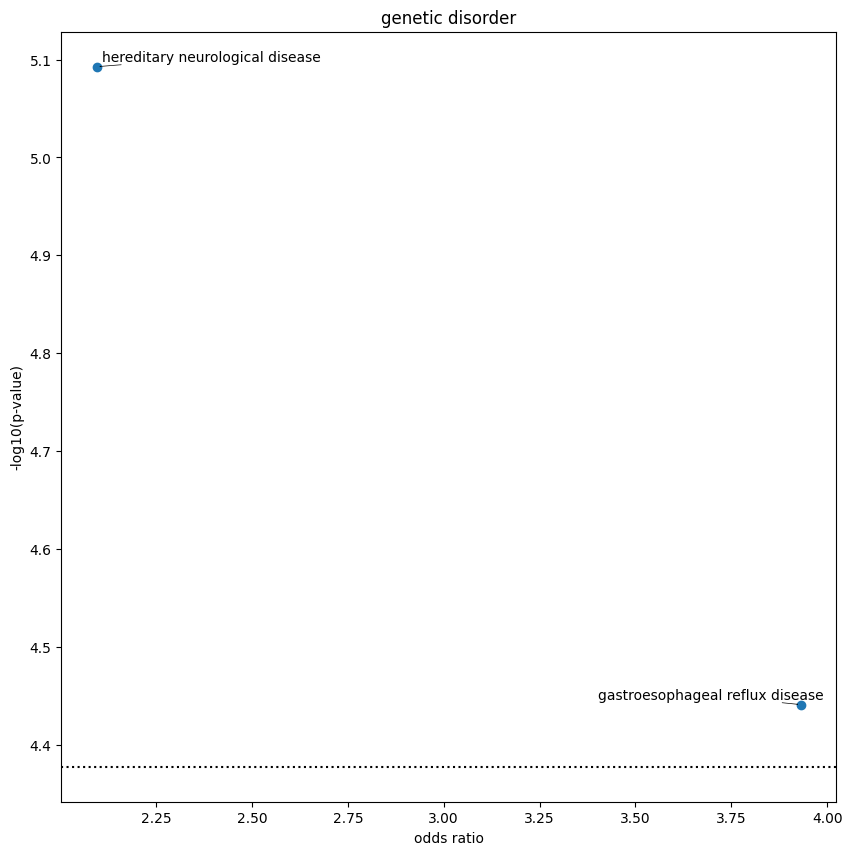

<Figure size 640x480 with 0 Axes>

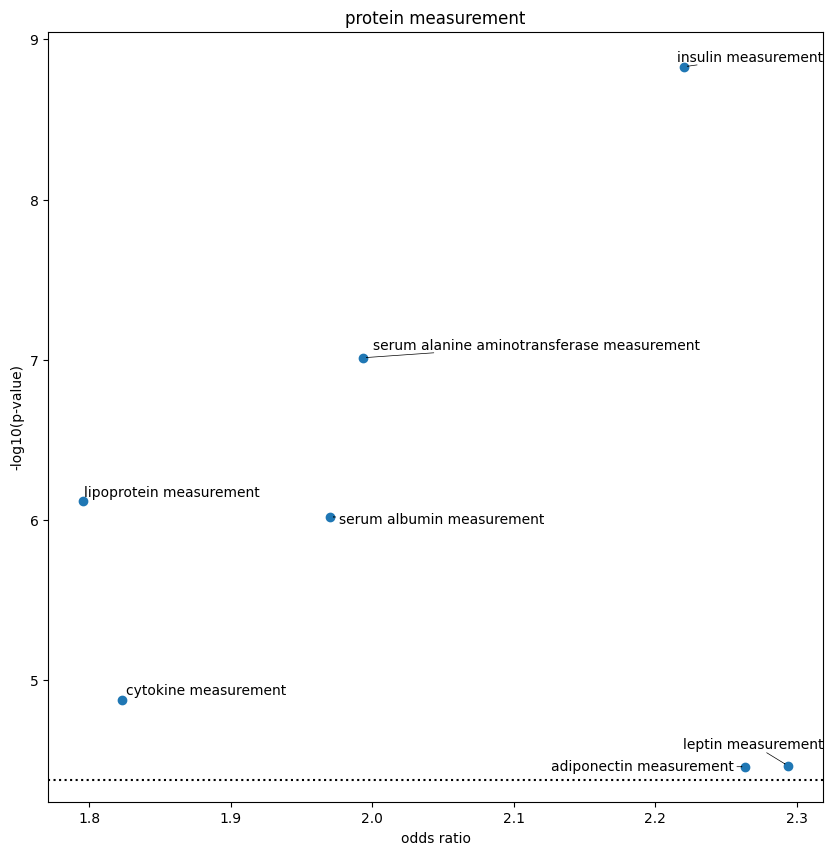

<Figure size 640x480 with 0 Axes>

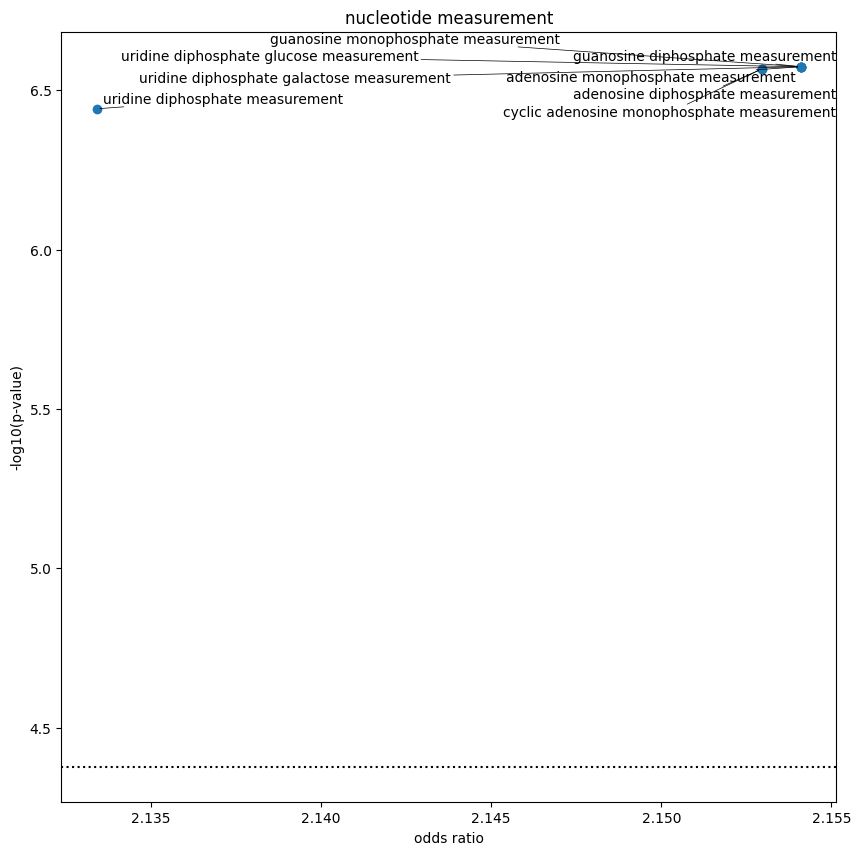

<Figure size 640x480 with 0 Axes>

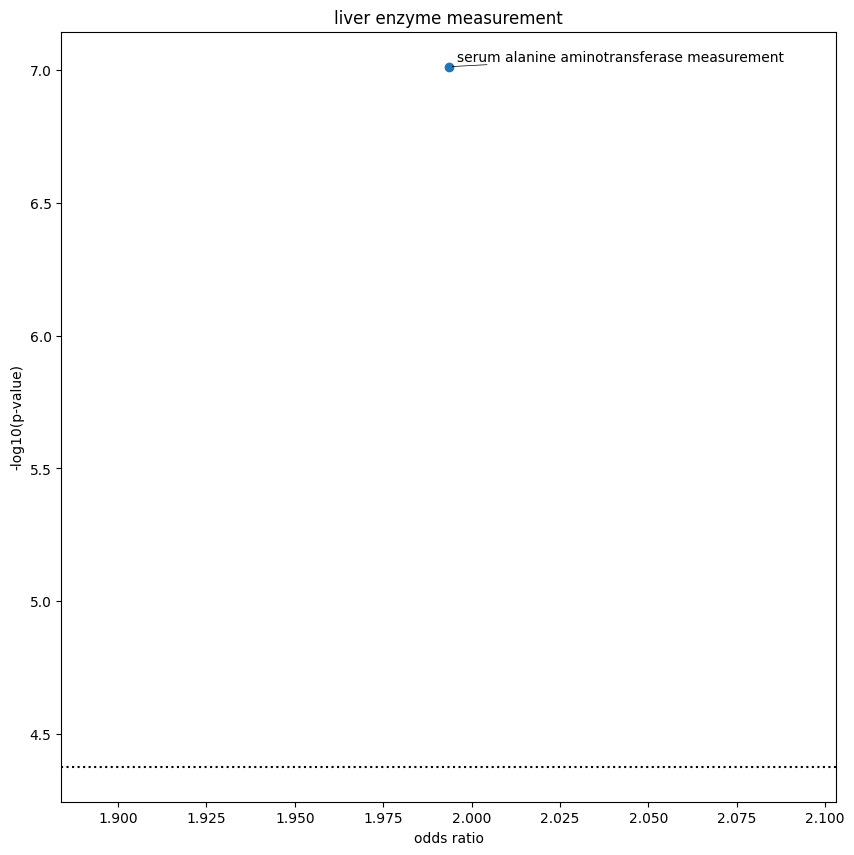

<Figure size 640x480 with 0 Axes>

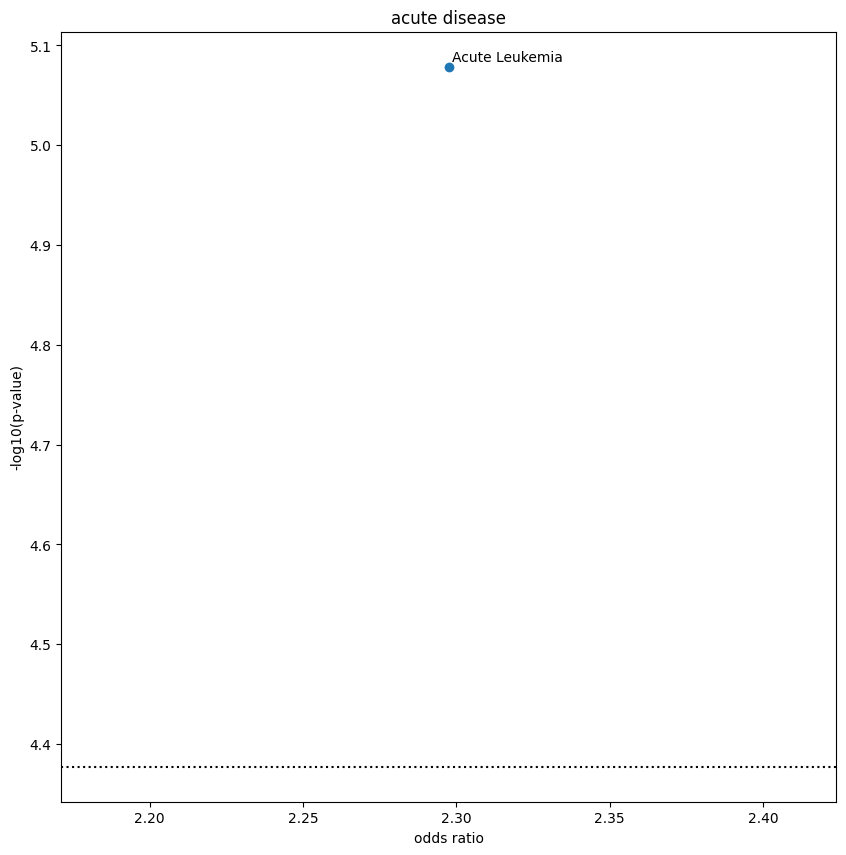

<Figure size 640x480 with 0 Axes>

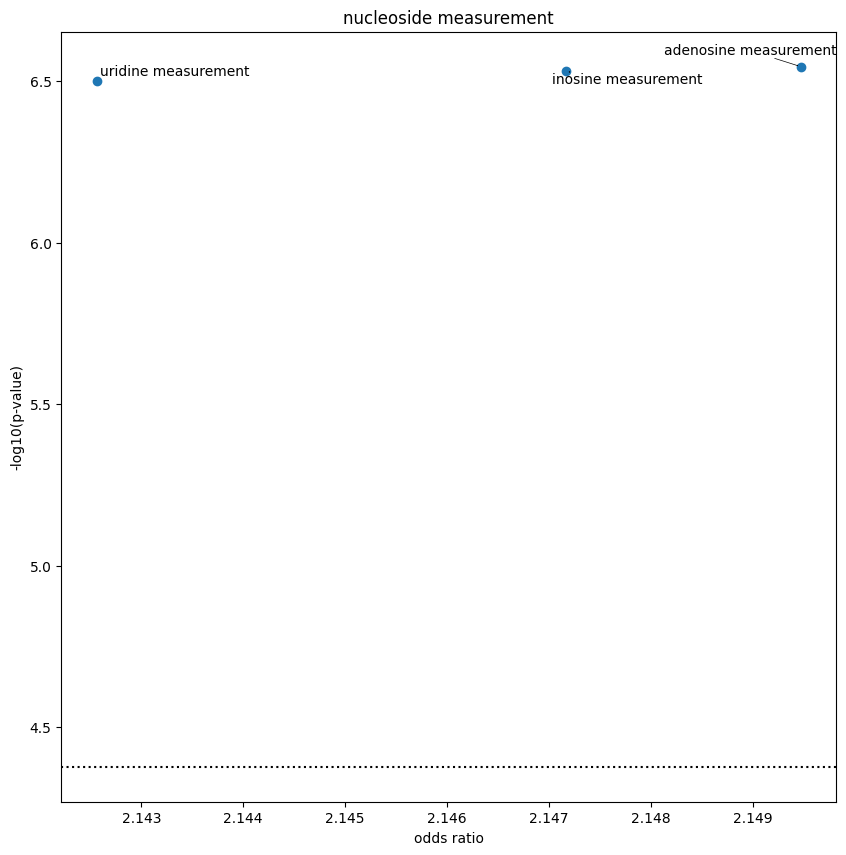

<Figure size 640x480 with 0 Axes>

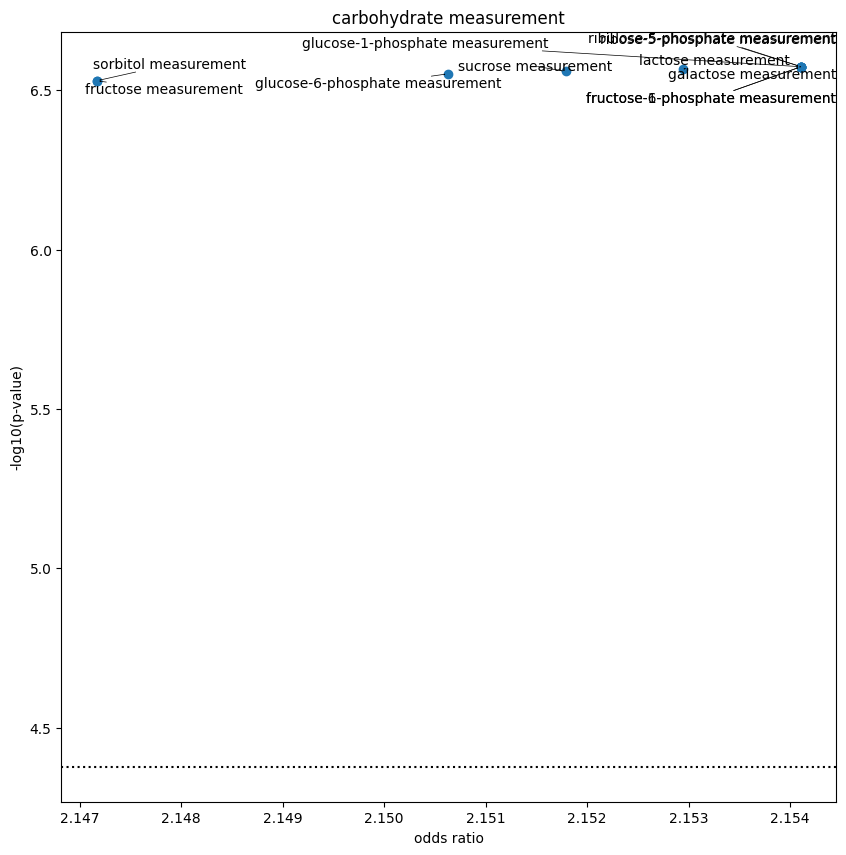

<Figure size 640x480 with 0 Axes>

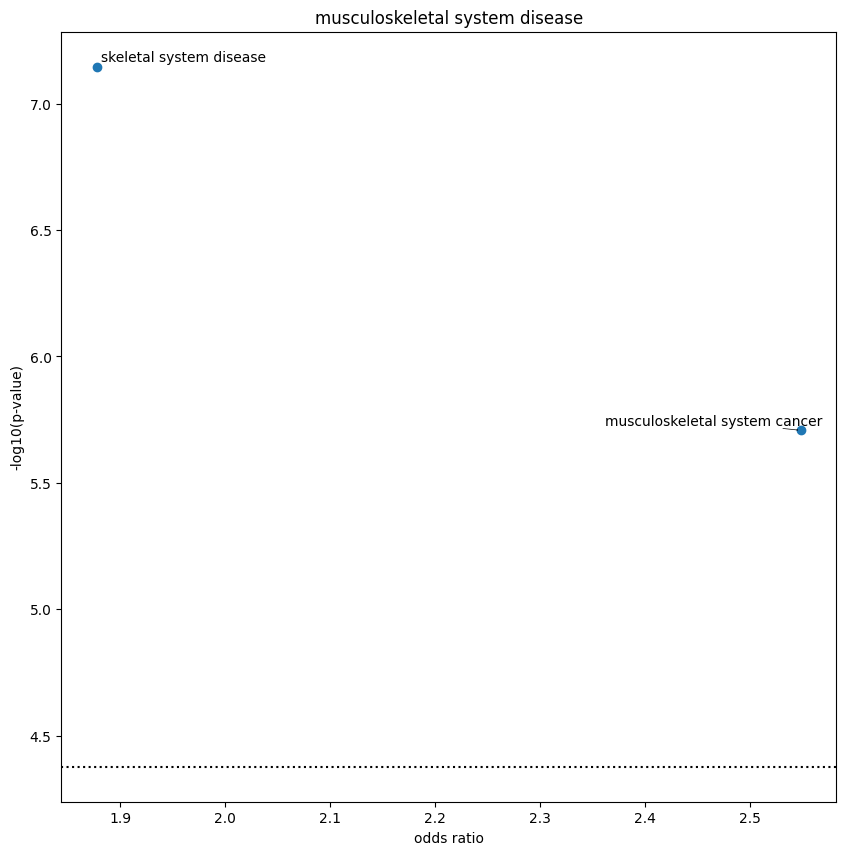

<Figure size 640x480 with 0 Axes>

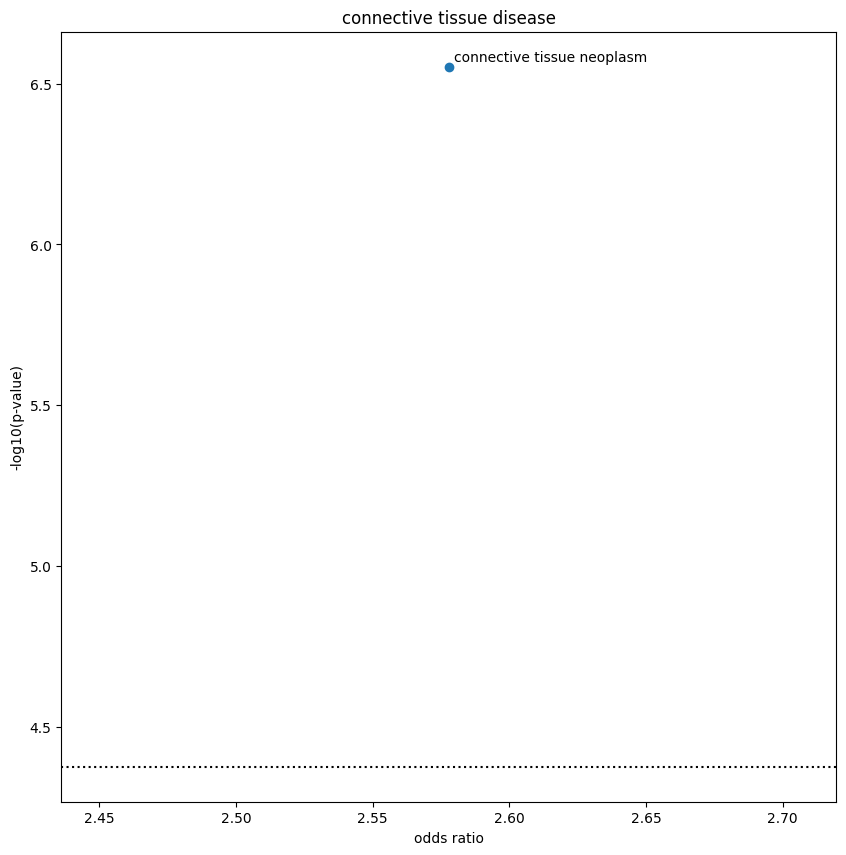

<Figure size 640x480 with 0 Axes>

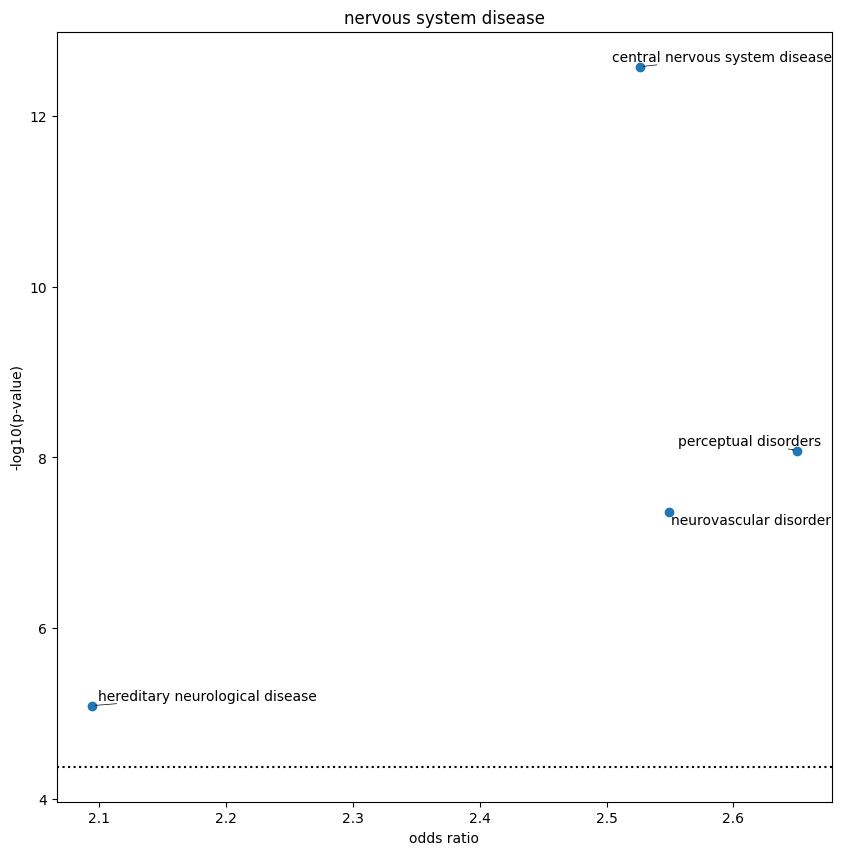

<Figure size 640x480 with 0 Axes>

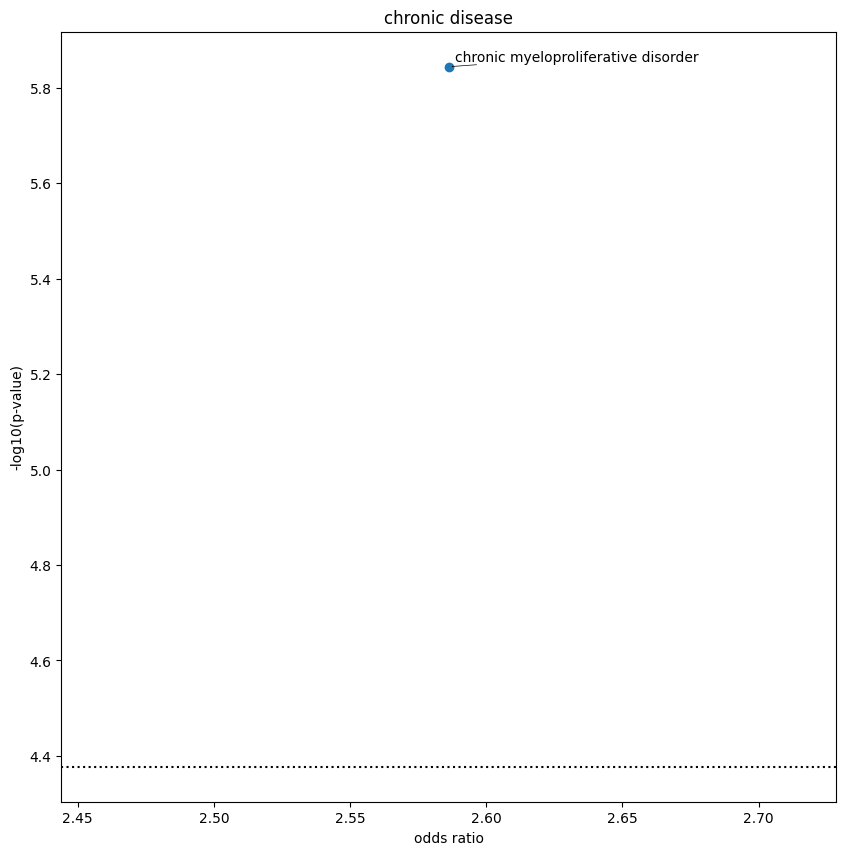

<Figure size 640x480 with 0 Axes>

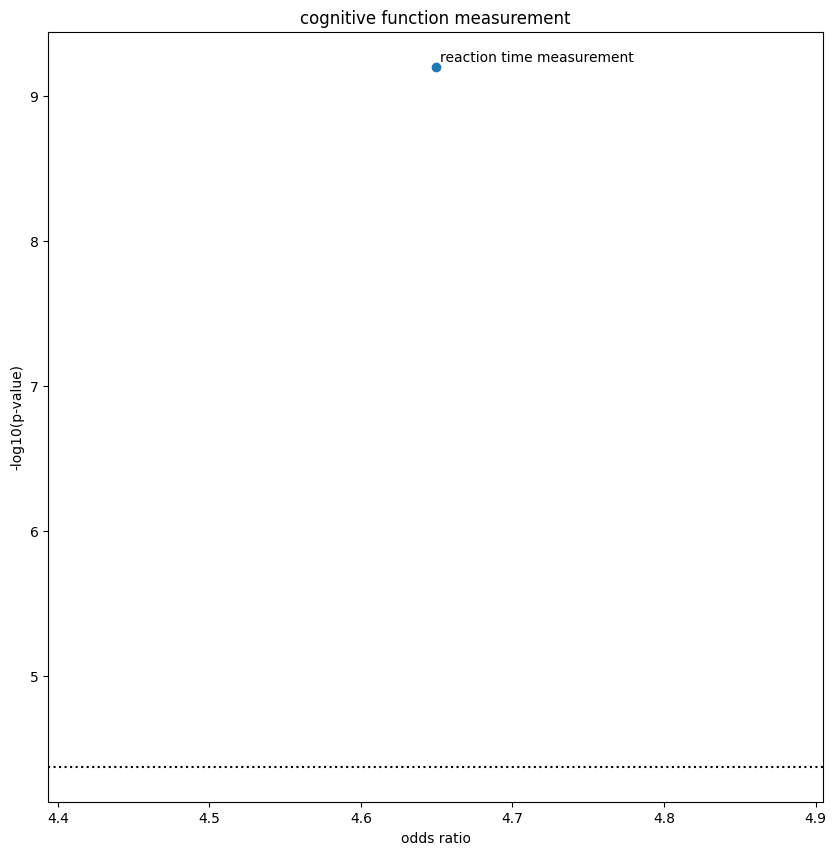

<Figure size 640x480 with 0 Axes>

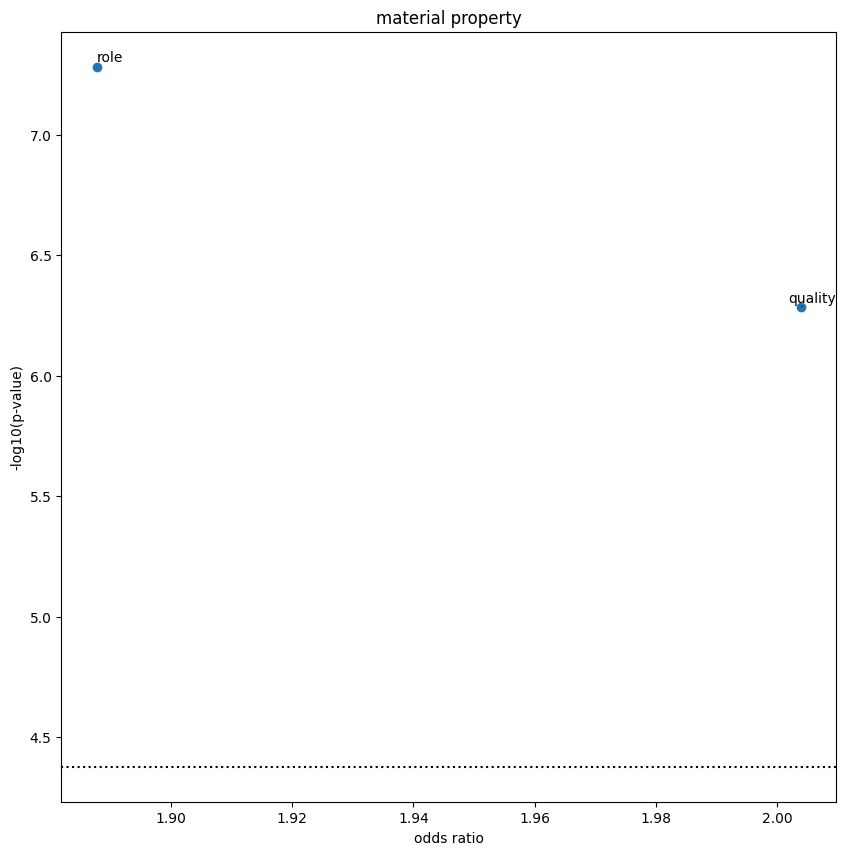

<Figure size 640x480 with 0 Axes>

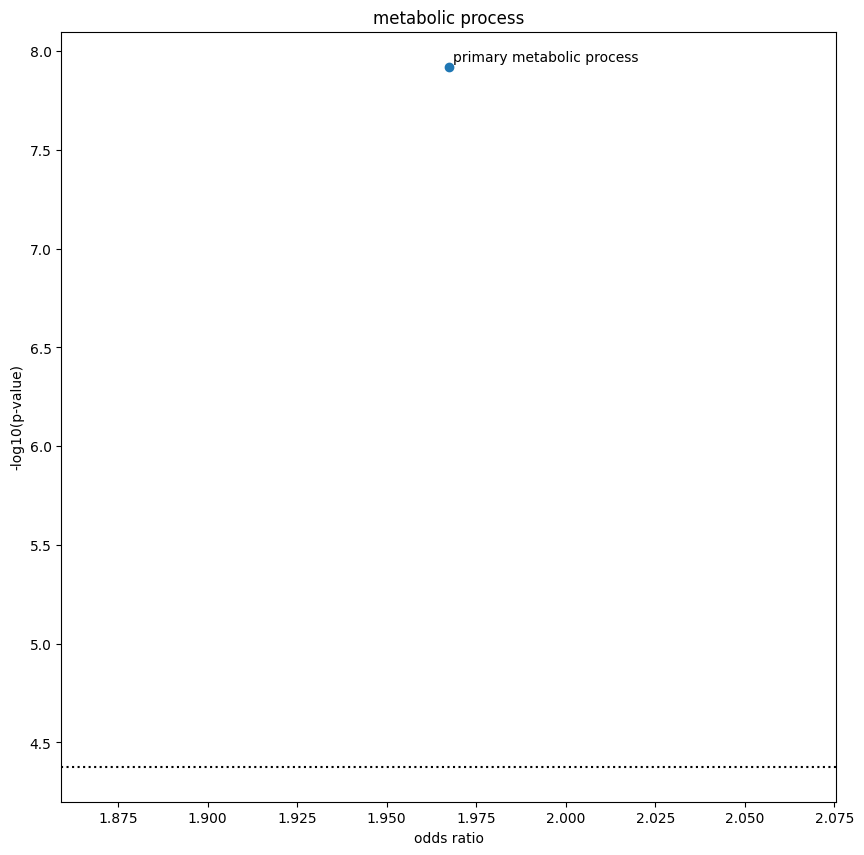

<Figure size 640x480 with 0 Axes>

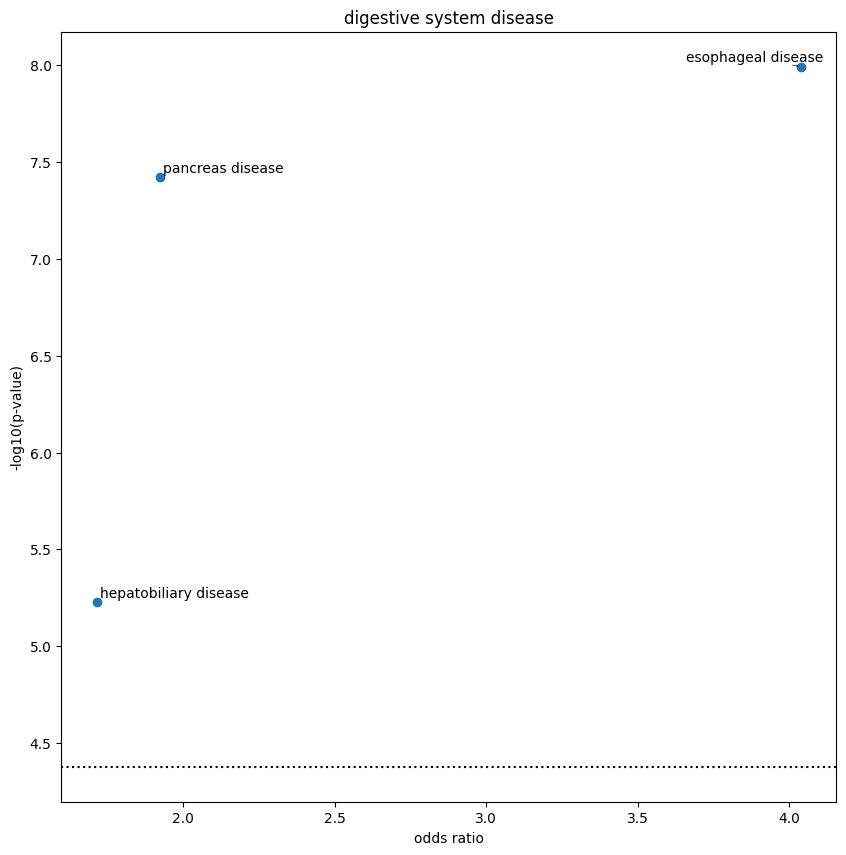

<Figure size 640x480 with 0 Axes>

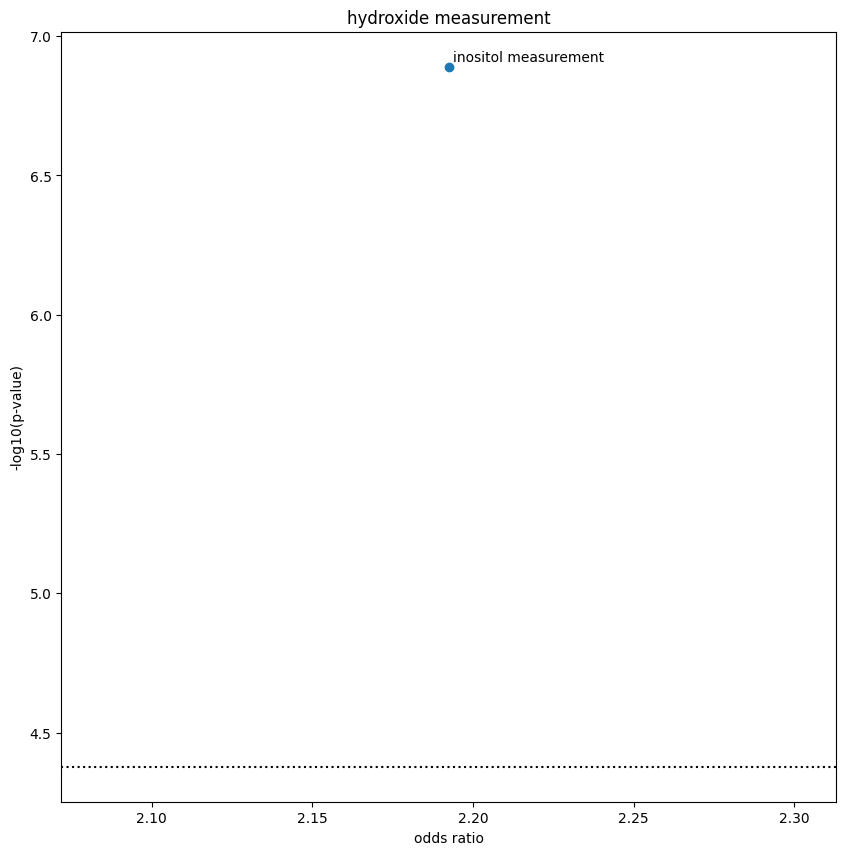

<Figure size 640x480 with 0 Axes>

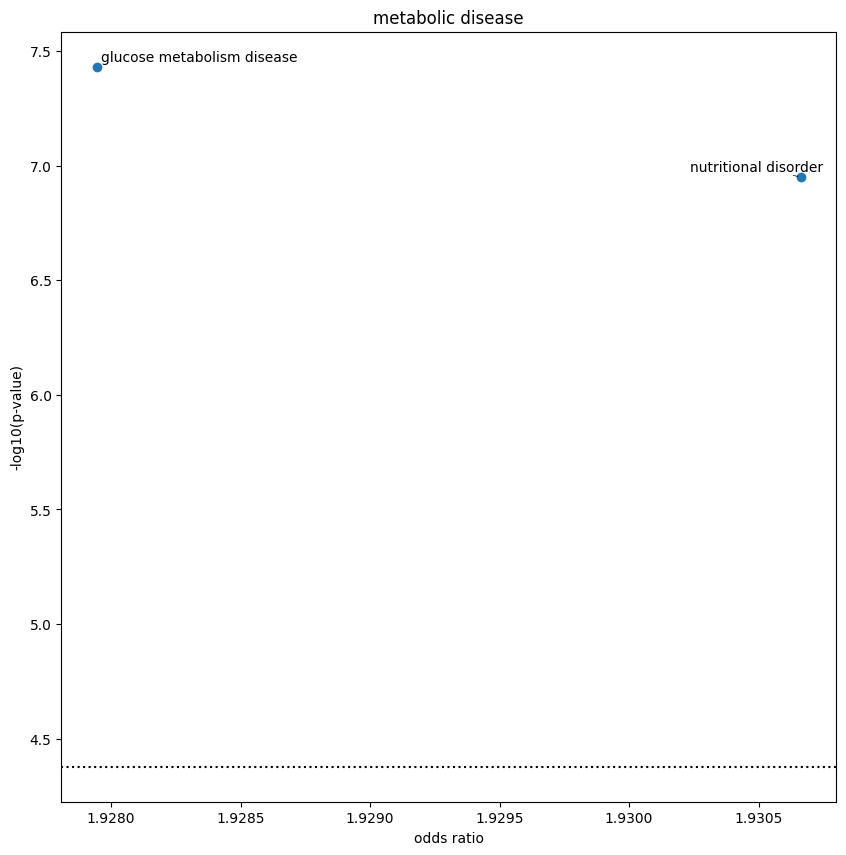

<Figure size 640x480 with 0 Axes>

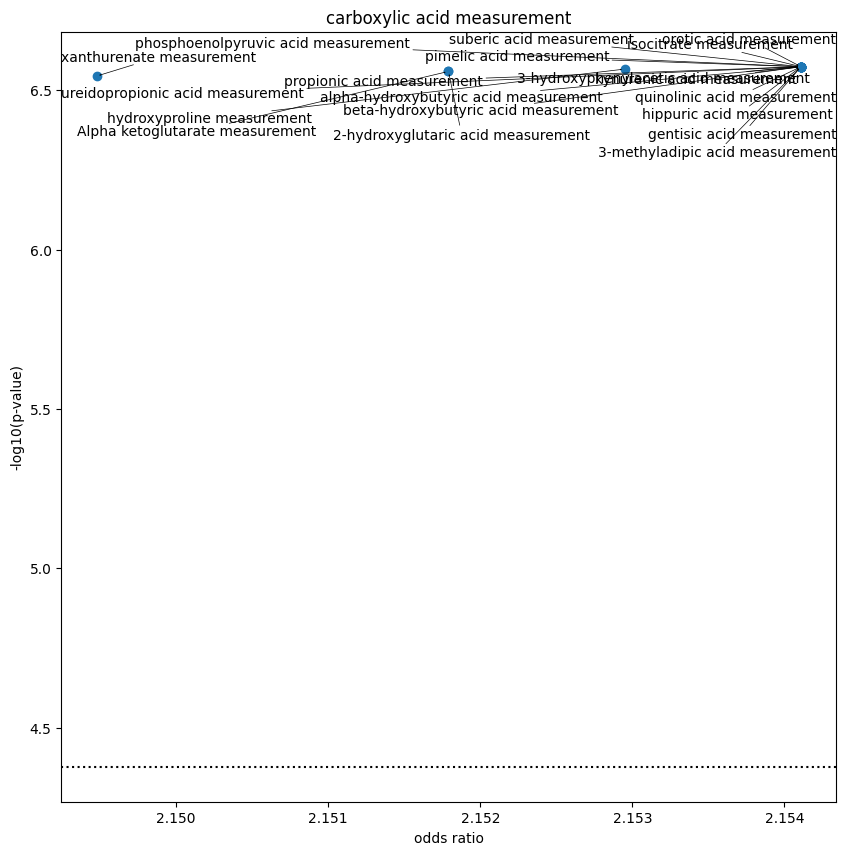

<Figure size 640x480 with 0 Axes>

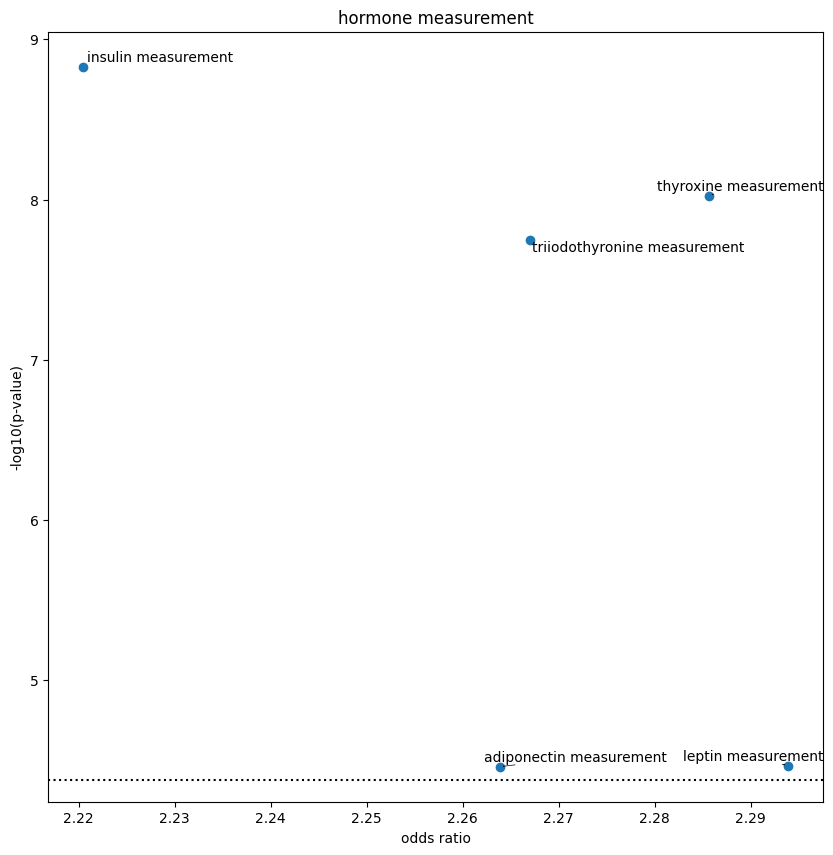

<Figure size 640x480 with 0 Axes>

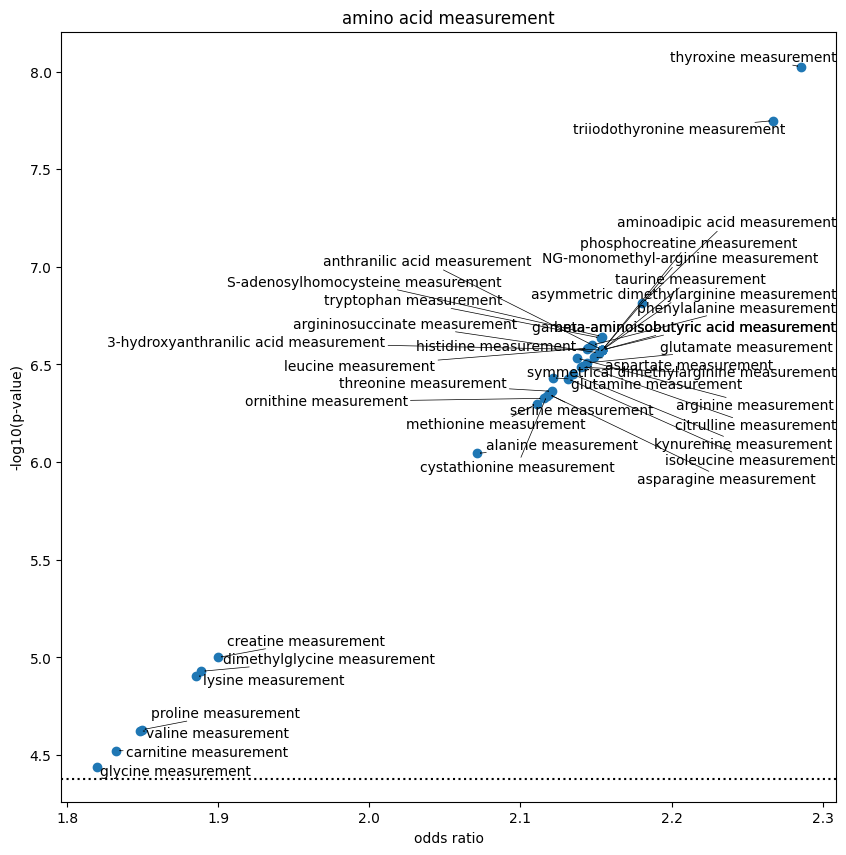

<Figure size 640x480 with 0 Axes>

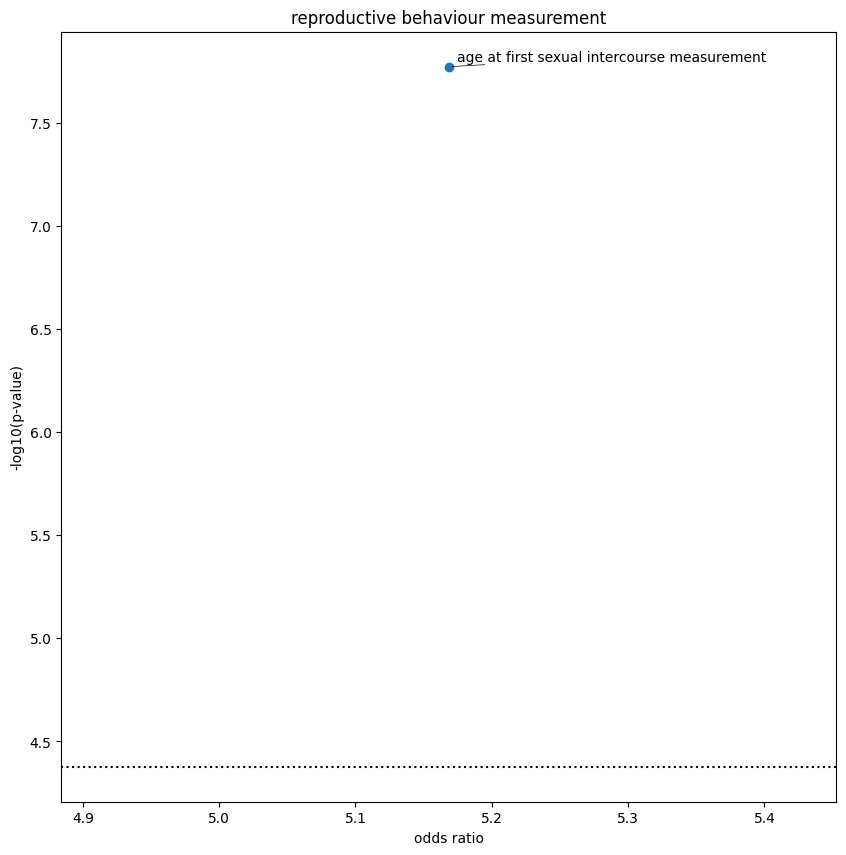

<Figure size 640x480 with 0 Axes>

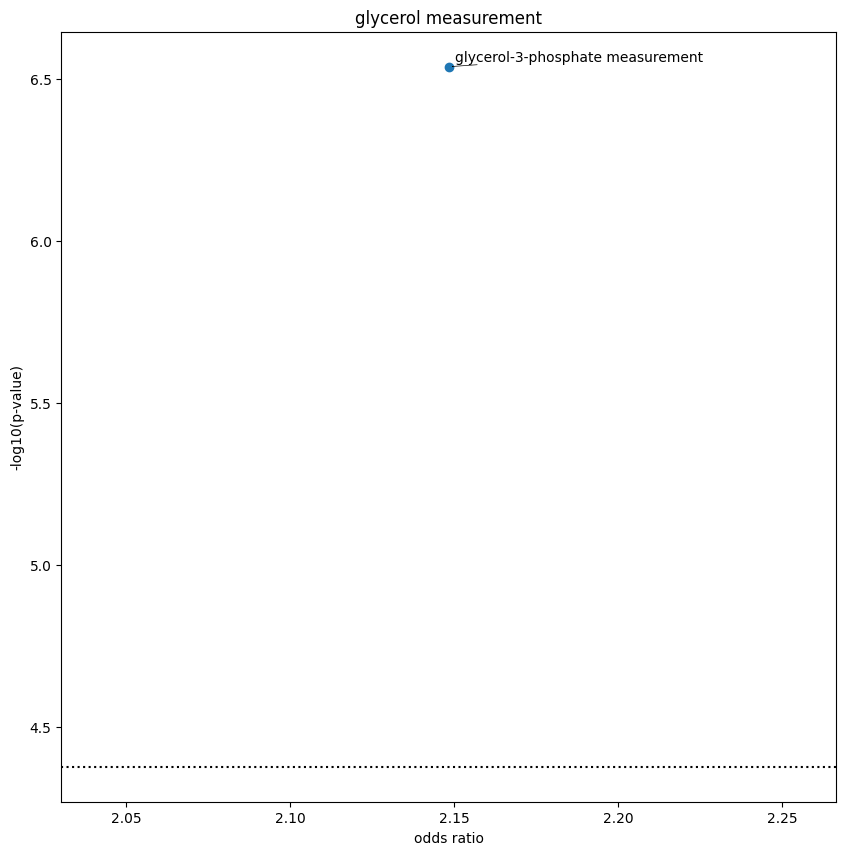

<Figure size 640x480 with 0 Axes>

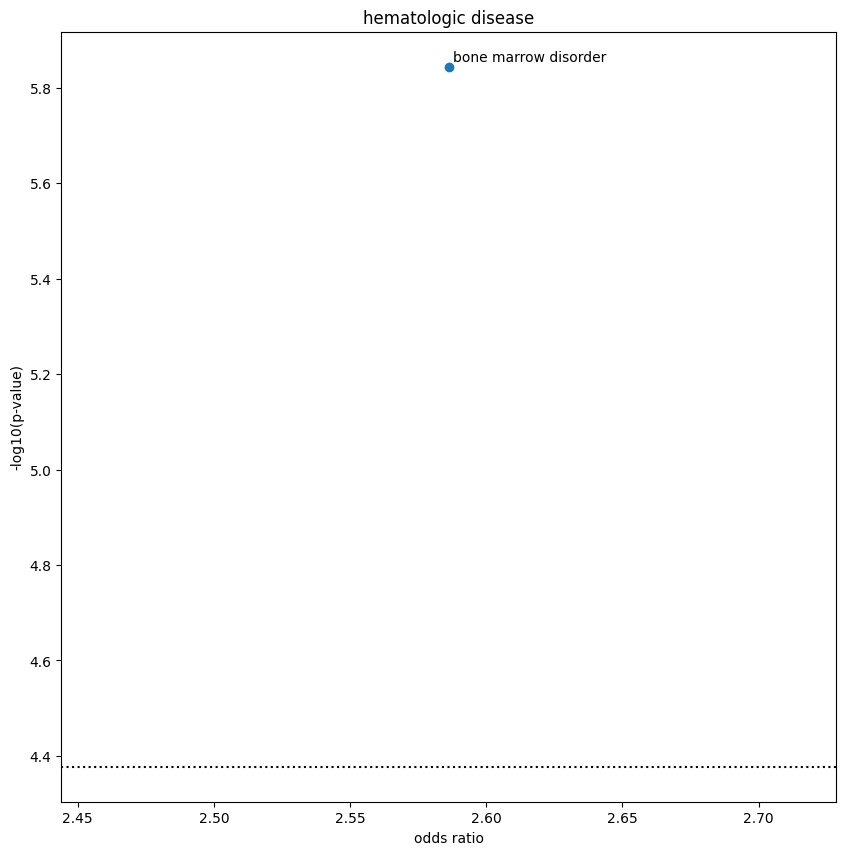

<Figure size 640x480 with 0 Axes>

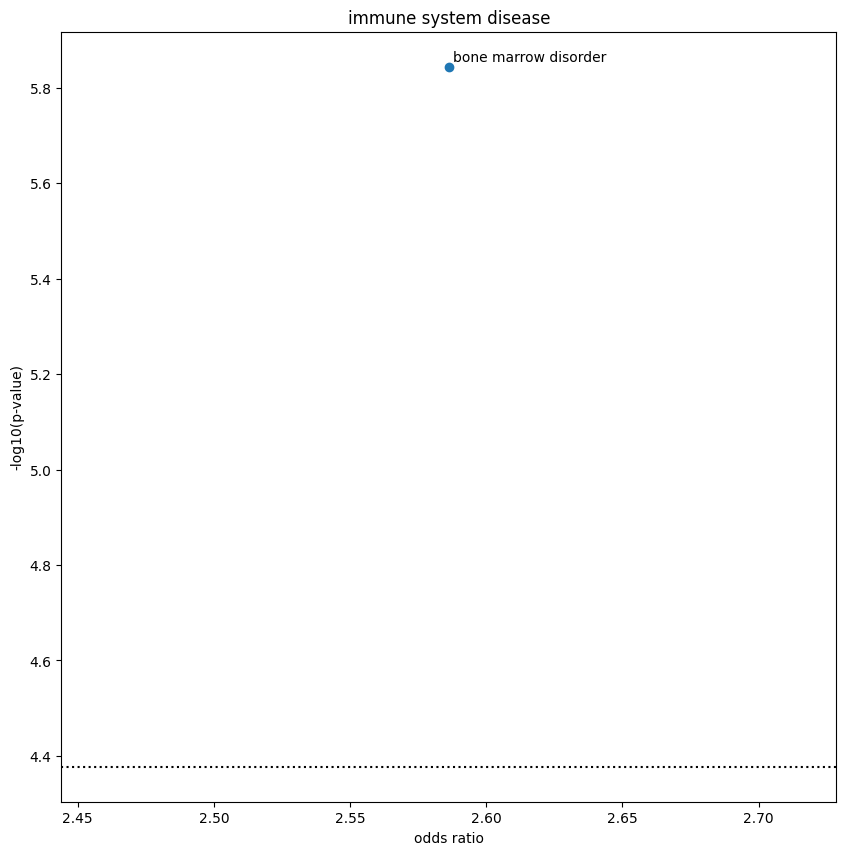

<Figure size 640x480 with 0 Axes>

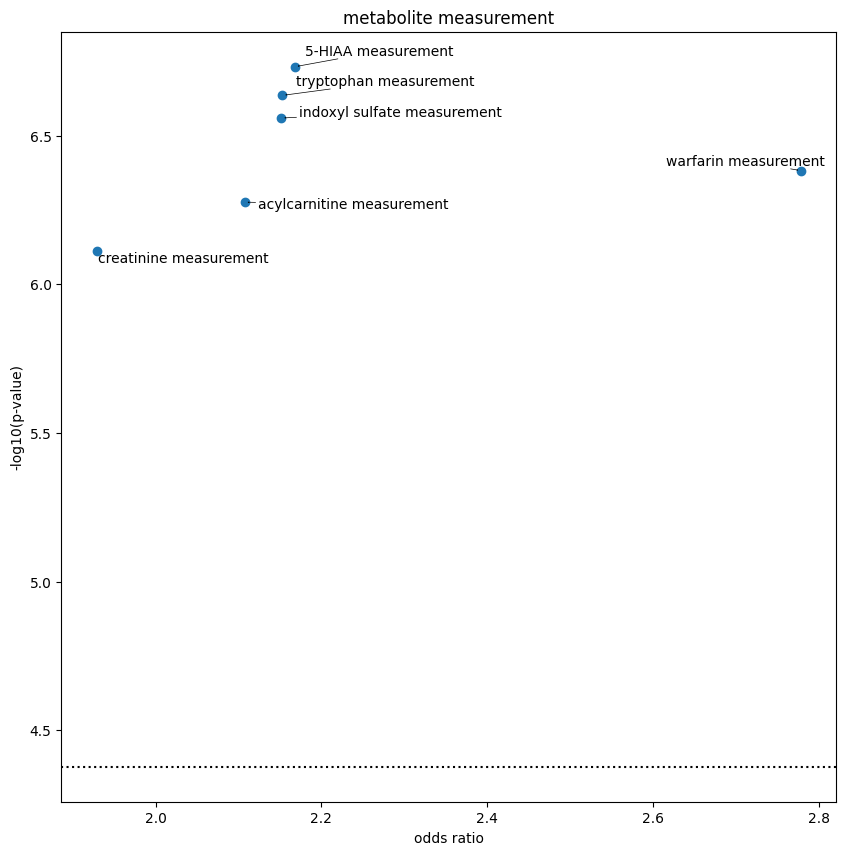

<Figure size 640x480 with 0 Axes>

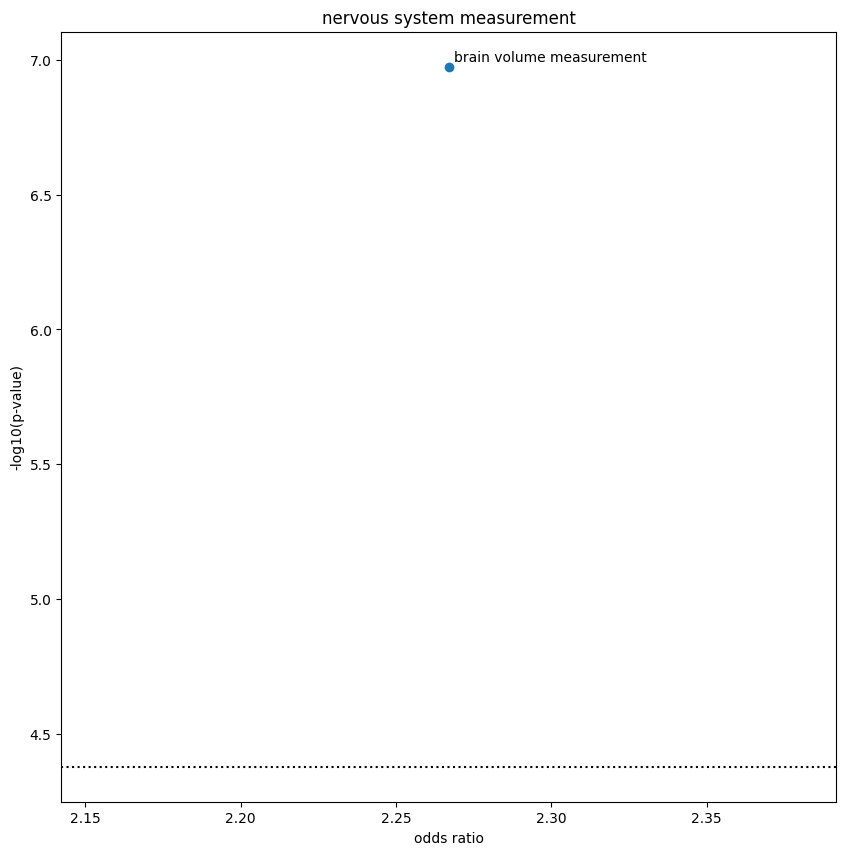

<Figure size 640x480 with 0 Axes>

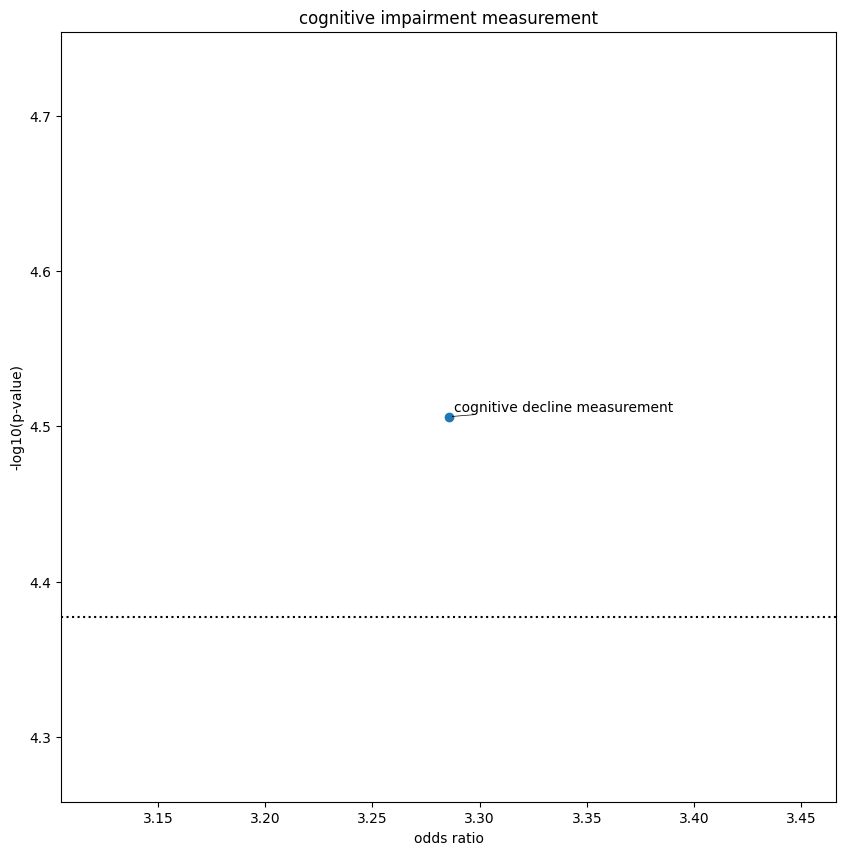

<Figure size 640x480 with 0 Axes>

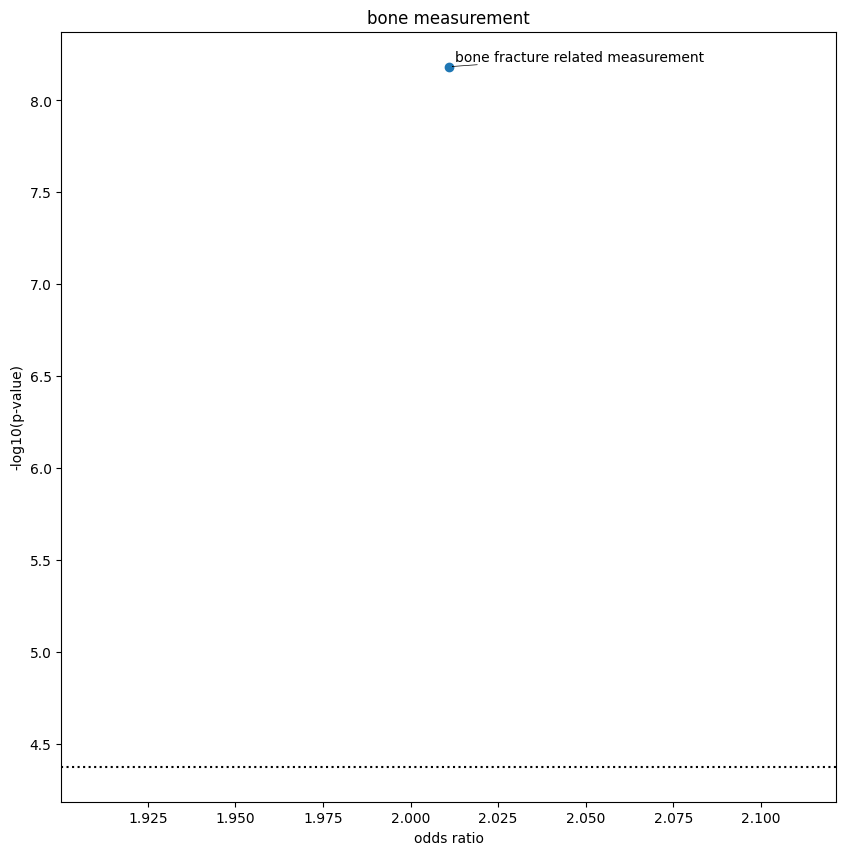

<Figure size 640x480 with 0 Axes>

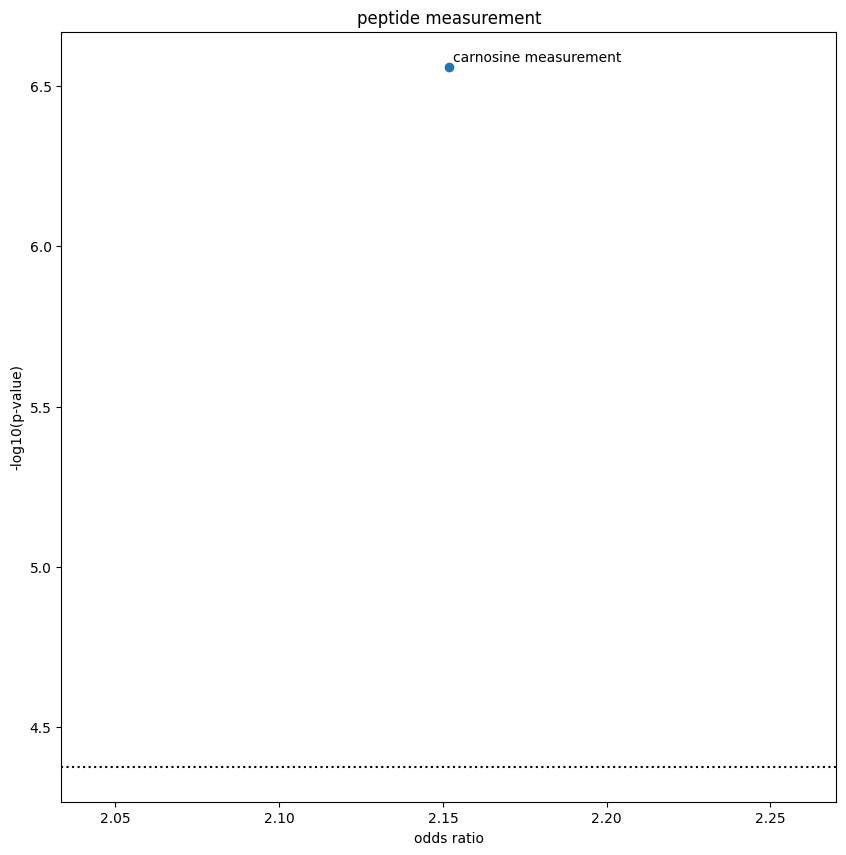

<Figure size 640x480 with 0 Axes>

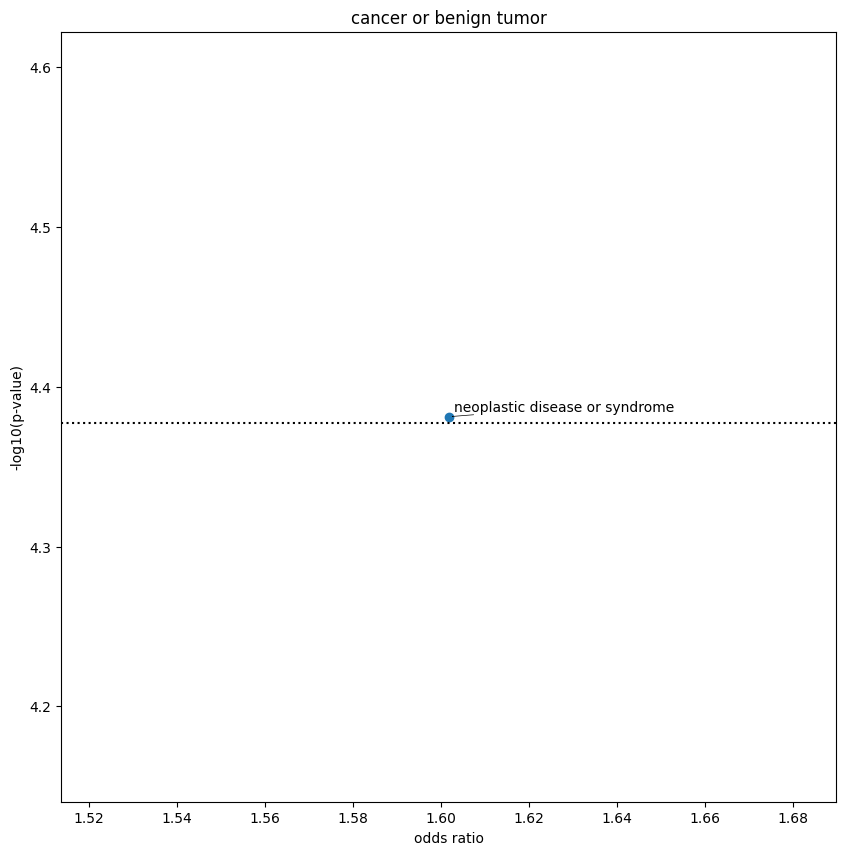

<Figure size 640x480 with 0 Axes>

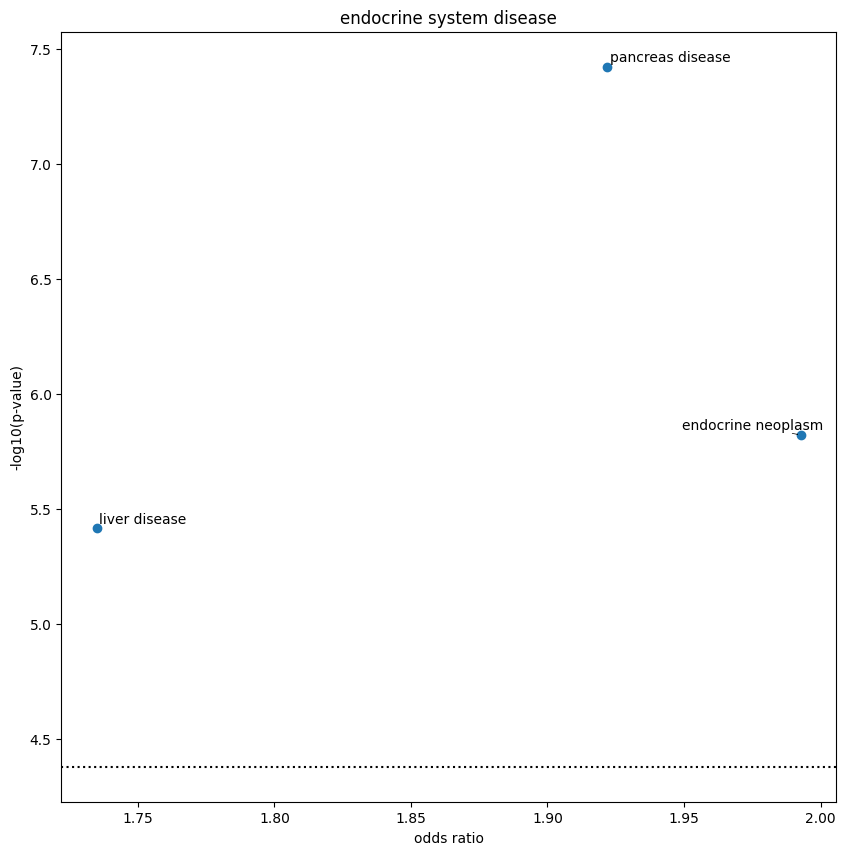

<Figure size 640x480 with 0 Axes>

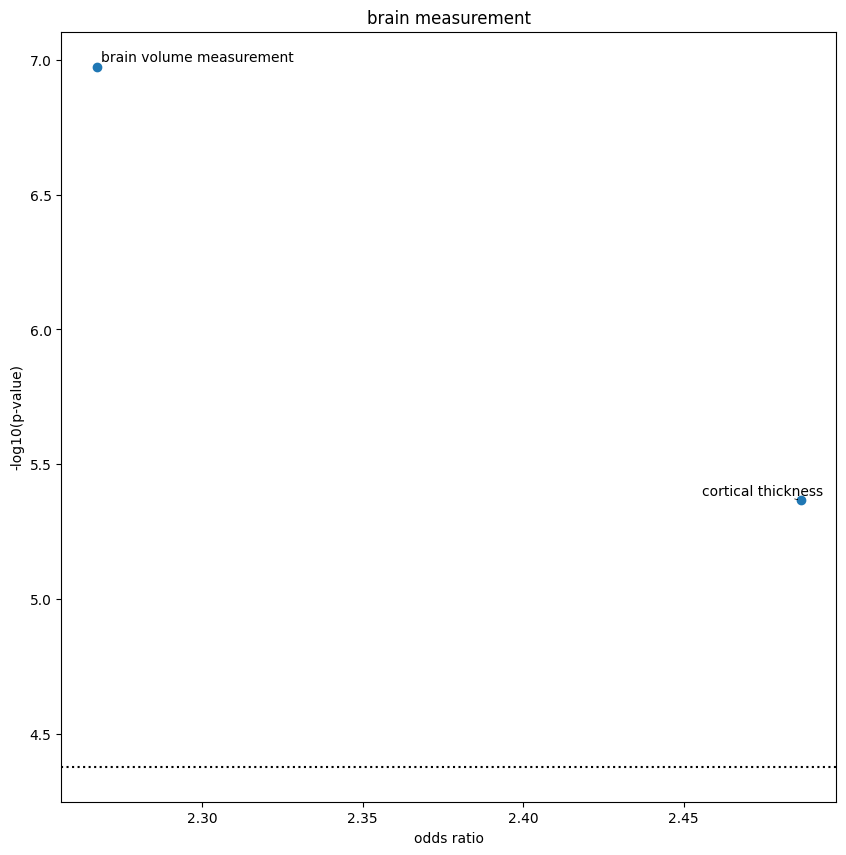

<Figure size 640x480 with 0 Axes>

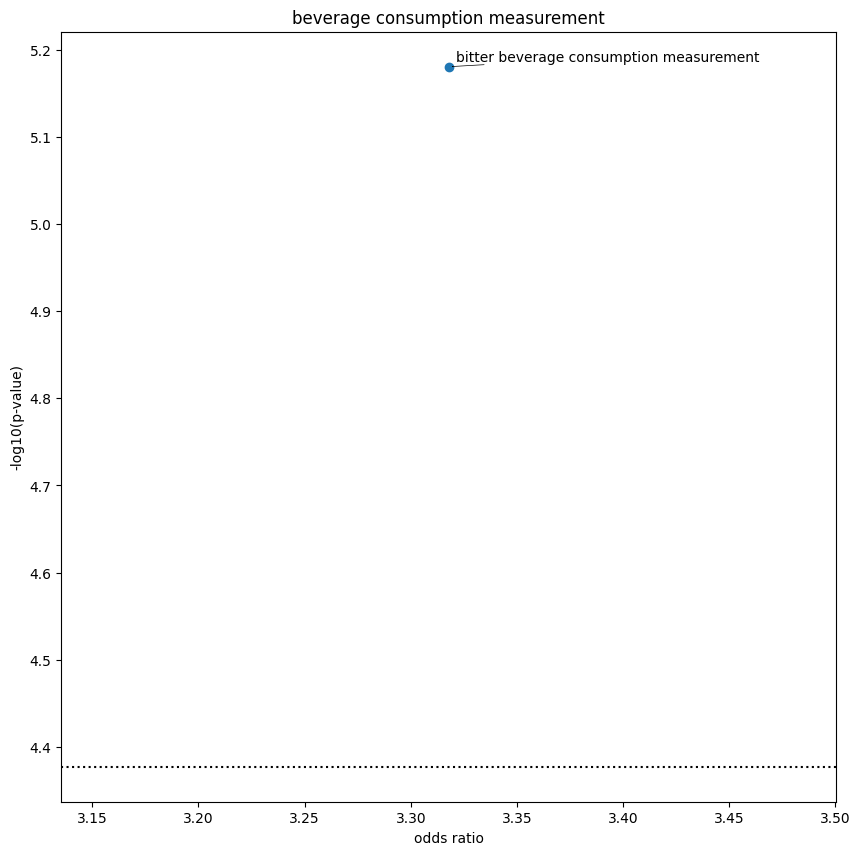

<Figure size 640x480 with 0 Axes>

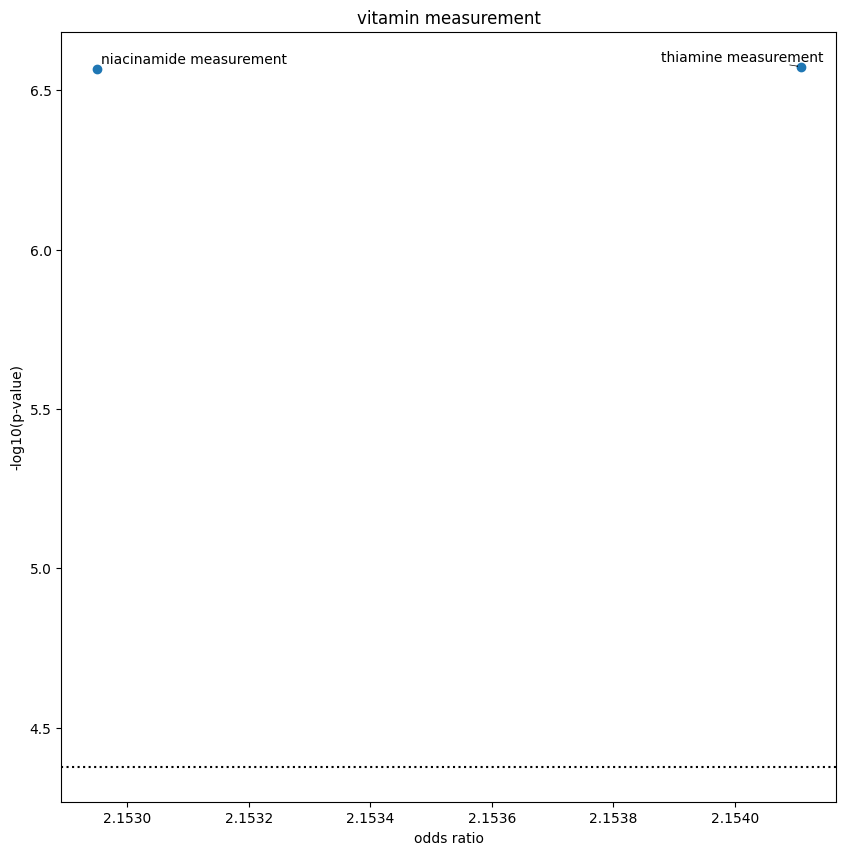

<Figure size 640x480 with 0 Axes>

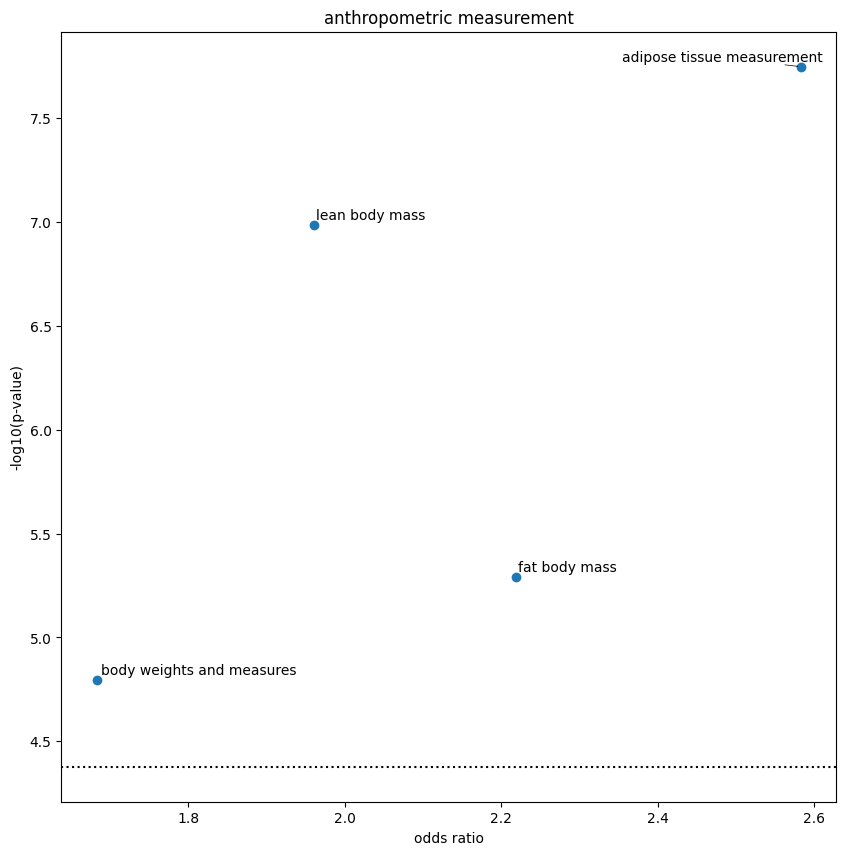

<Figure size 640x480 with 0 Axes>

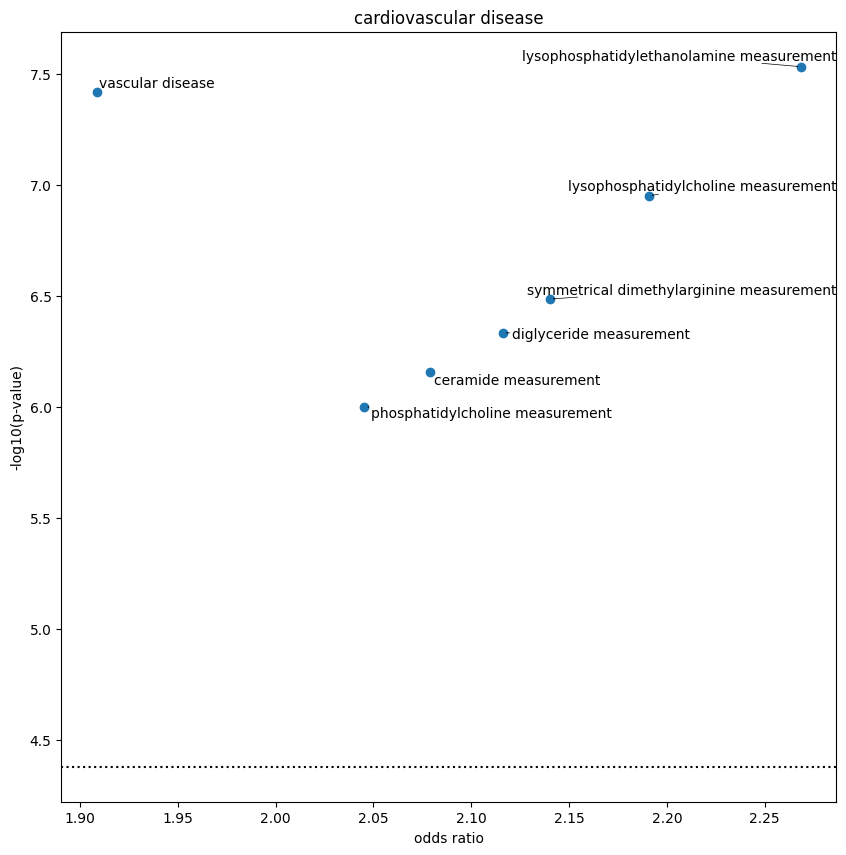

<Figure size 640x480 with 0 Axes>

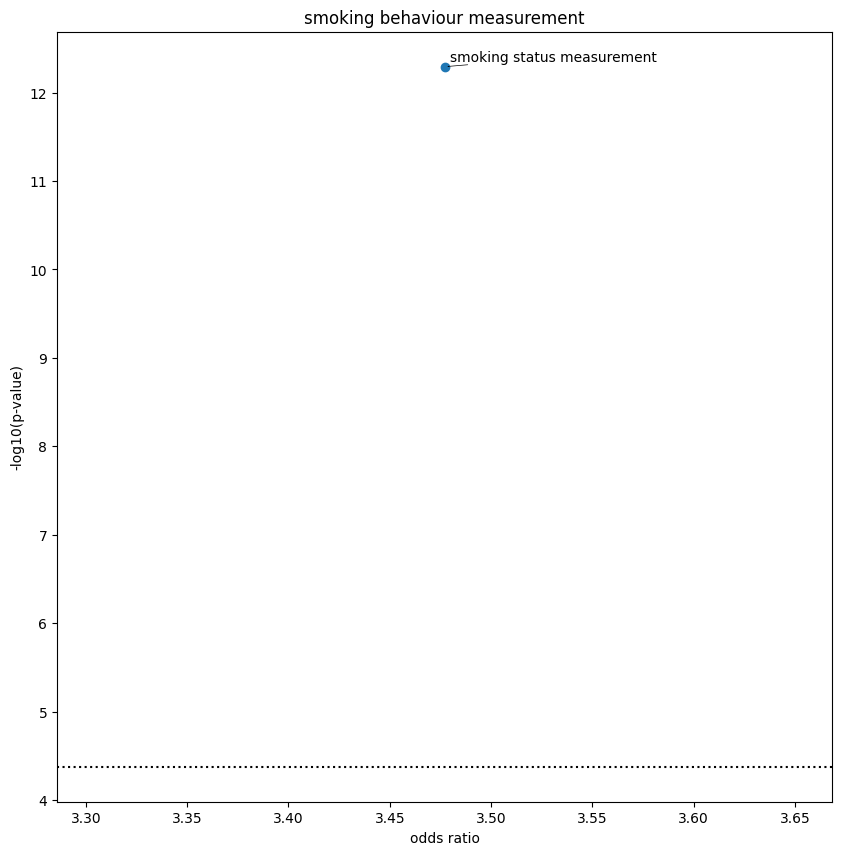

<Figure size 640x480 with 0 Axes>

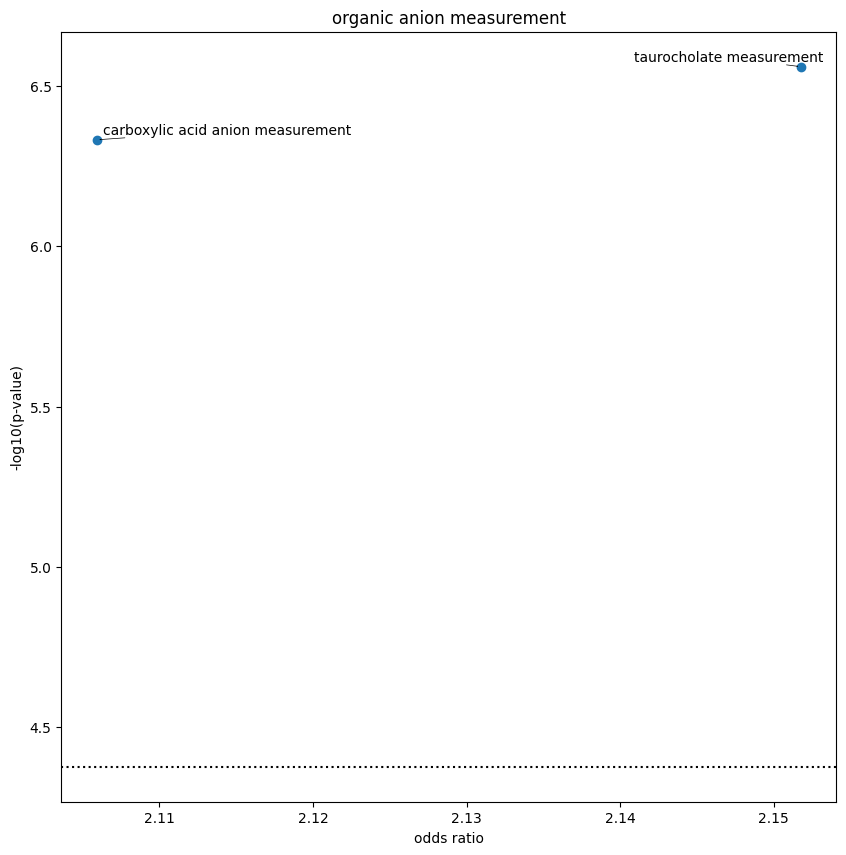

<Figure size 640x480 with 0 Axes>

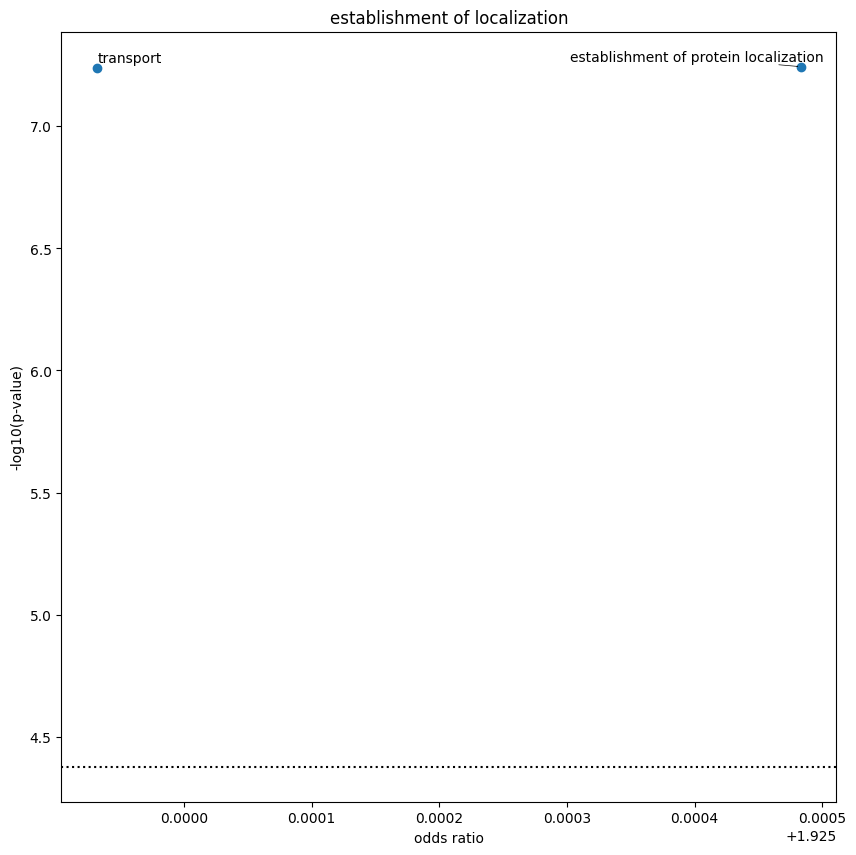

<Figure size 640x480 with 0 Axes>

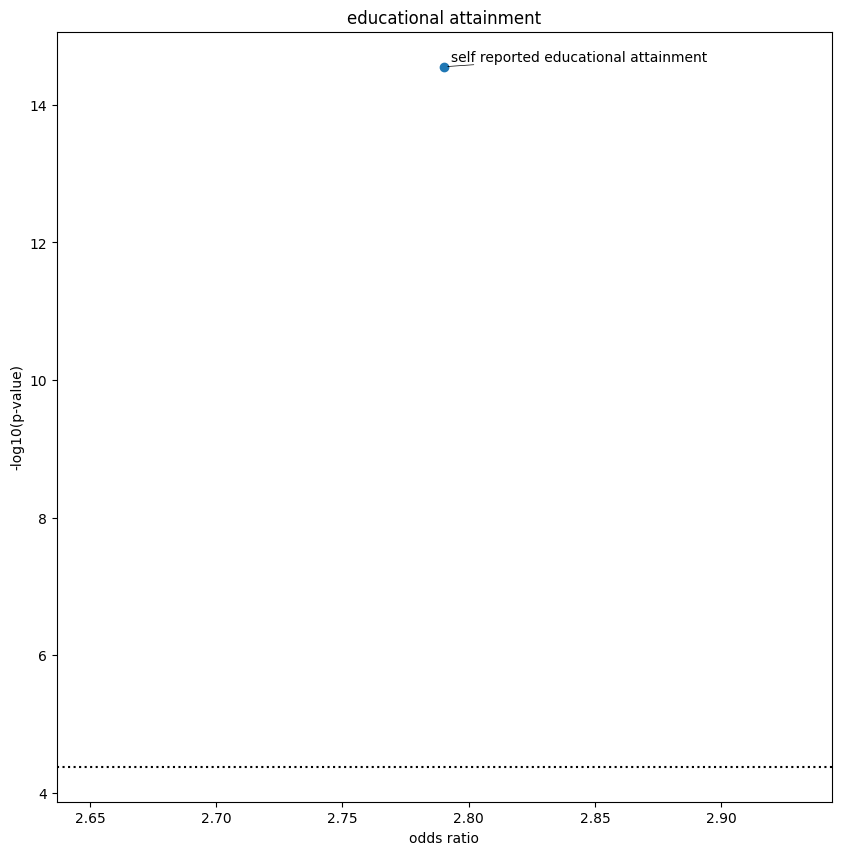

<Figure size 640x480 with 0 Axes>

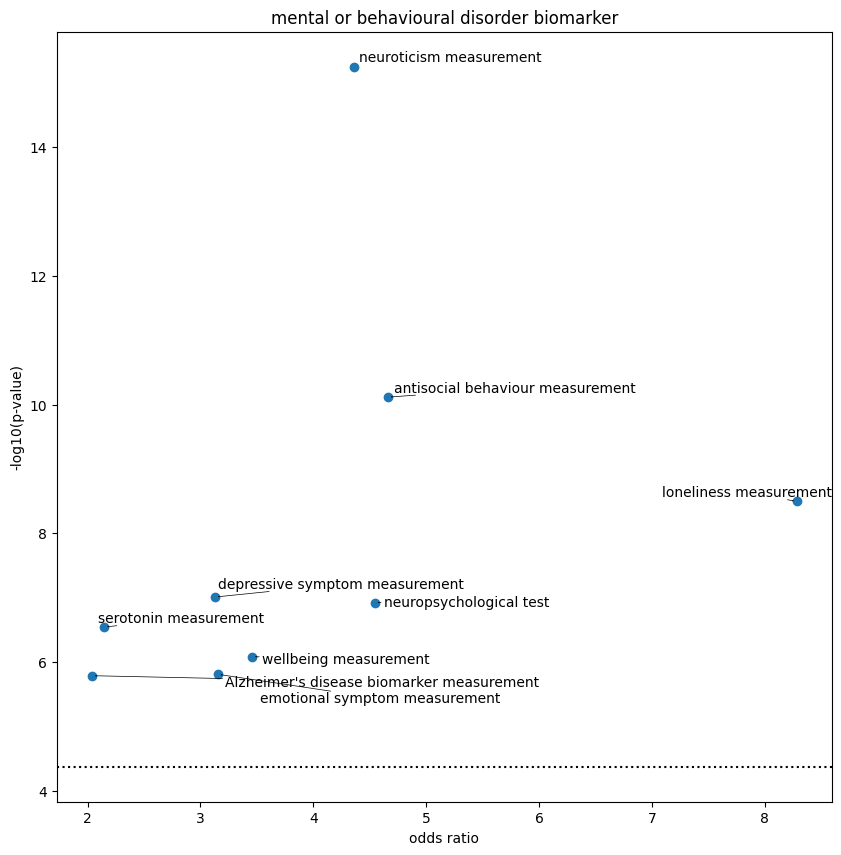

<Figure size 640x480 with 0 Axes>

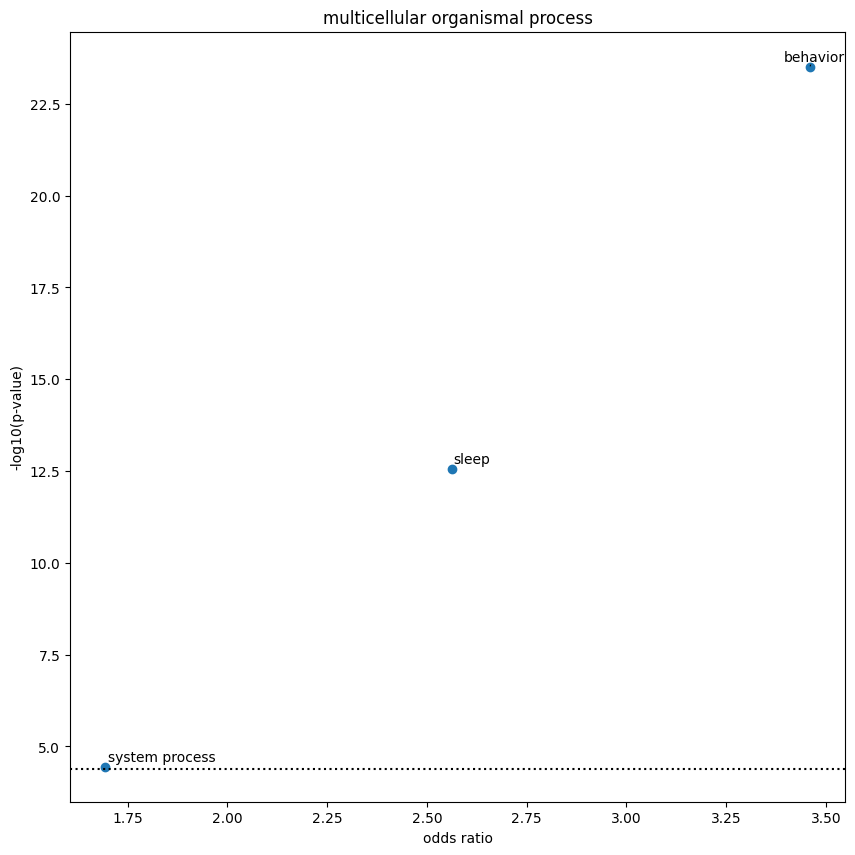

<Figure size 640x480 with 0 Axes>

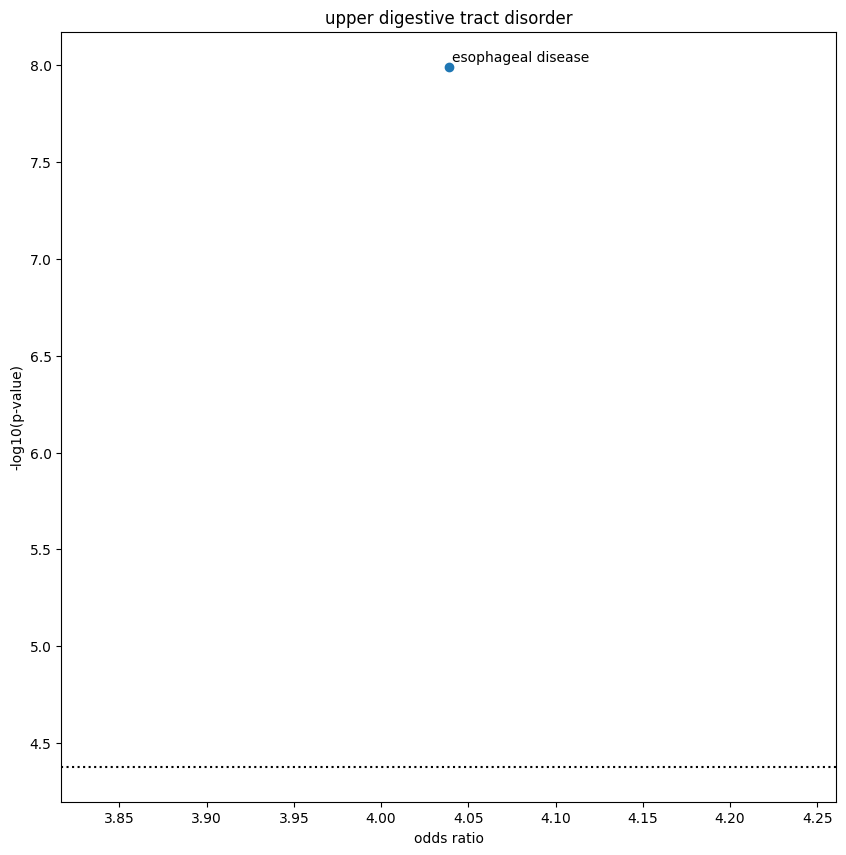

<Figure size 640x480 with 0 Axes>

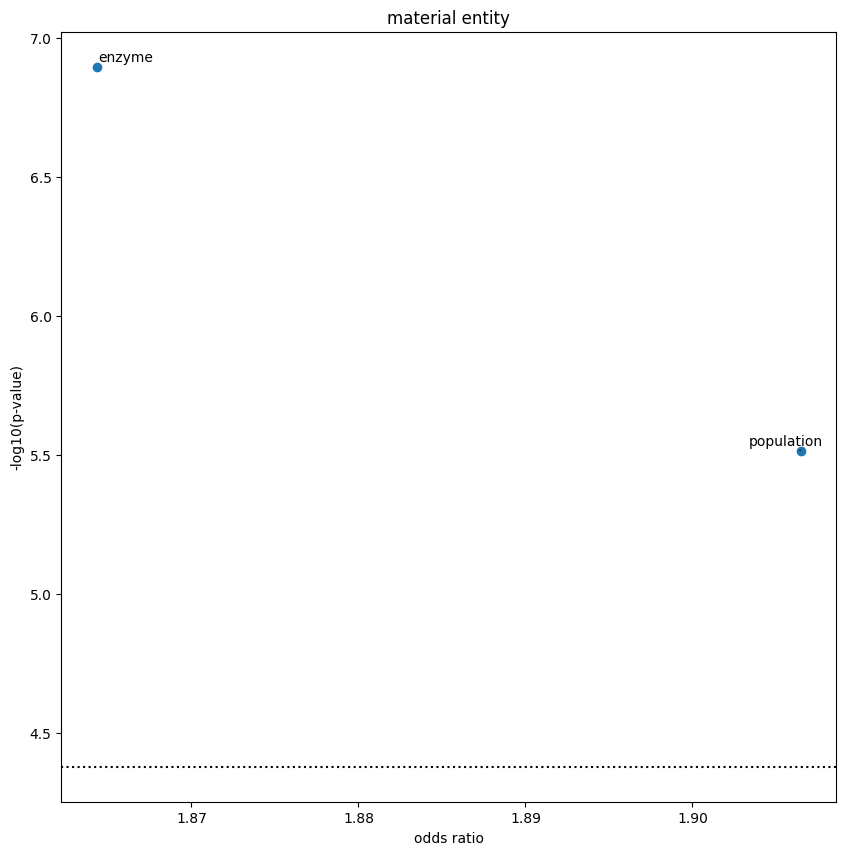

<Figure size 640x480 with 0 Axes>

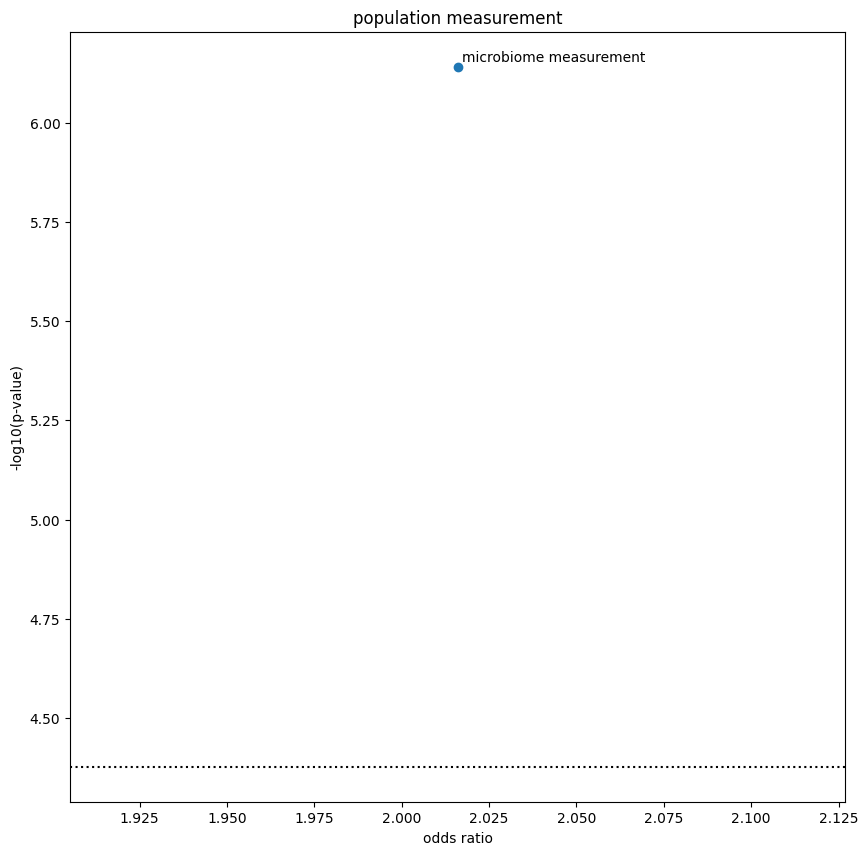

<Figure size 640x480 with 0 Axes>

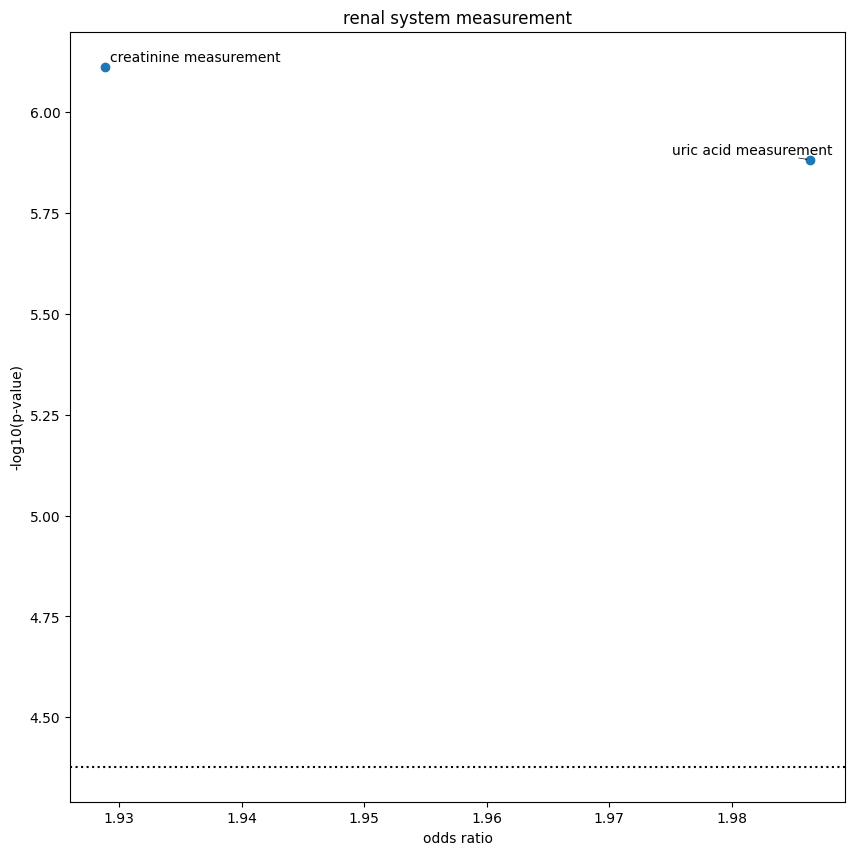

<Figure size 640x480 with 0 Axes>

In [65]:
e=enr_tbl[enr_tbl.parent_trait.isin(set(enr_tbl[enr_tbl['p_intersect']<(0.05/len(enr_tbl))]['parent_trait']))]
e=enr_tbl[enr_tbl['p_intersect']<(0.05/len(enr_tbl))]
for p in set(e.parent_trait):
    t=e[e['parent_trait']==p]
    fig=plt.figure(figsize=(10,10))
    fig=plt.scatter(x=t.odds_ratio,y=-np.log10(t.p_intersect))
    fig=plt.xlabel('odds ratio')
    fig=plt.ylabel('-log10(p-value)')
    fig=plt.title(p)
    fig=plt.axhline(-np.log10(0.05/len(enr_tbl)),color='black',ls=':')
    #fig=plt.axhline(-np.log10(0.05/len(t)),color='black',ls=':')
    texts=[]
    for i in t.index:
        if (t.p_intersect[i]<(0.05/len(enr_tbl))):
            texts.append(plt.annotate(t.trait[i], (t.odds_ratio[i], -np.log10(t.p_intersect[i]))))

    # Adjust text to avoid overlap
    adjust_text(texts, only_move={'points': 'y', 'texts': 'y'}, 
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5))


    plt.show()
    plt.clf()

In [66]:
enr_tbl

,trait,parent_trait,network_genes,odds_ratio,p_intersect
0,congenital anomaly of cardiovascular system,cardiovascular disease,"{NFASC, FOXG1, PTPRD, PTK2B, ASIC2, KCNJ4}",1.519076,2.141933e-01
1,phosphatidylinositol measurement,cardiovascular disease,{ETV1},0.838655,6.990409e-01
2,phosphatidylethanolamine measurement,cardiovascular disease,"{GABRG2, WDR81, CD96}",1.760243,2.507252e-01
3,phosphatidylcholine measurement,cardiovascular disease,"{GRIN2A, XKR5, TMEM132D, GNAO1, ERBB4, ARIH2, ...",2.045438,9.995550e-07
4,lysophosphatidylethanolamine measurement,cardiovascular disease,"{GRIN2A, XKR5, TMEM132D, GNAO1, ERBB4, ARIH2, ...",2.268610,2.928016e-08
...,...,...,...,...,...
1187,chemical entity,material entity,"{XKR5, NRTN, PJA2, PTPRZ1, CPNE4, CAMTA2, EDIL...",1.636982,1.133641e-04
1188,measurement,information entity,"{DOCK9, NRTN, PJA2, FAM8A1, XKR5, ULBP1, PTPRZ...",1.061229,5.089378e-01
1189,test result,information entity,"{DOCK9, CHRNA4, AGBL2, CYFIP2, PSMC3}",0.950978,6.056464e-01
1190,epigenetic factor,information entity,{NHLRC1},0.588532,8.177840e-01


In [67]:
depth=depth+1
enr_tbl['depth']=depth

In [68]:
enr_concat=pd.concat([enr_concat,enr_tbl])

# check for enrichment of GREAT-GRAND-CHILDREN of new parent traits of GWAS catalog

In [154]:
#parent_tbl=enr_tbl[enr_tbl['p_intersect']<0.05/len(enr_tbl)]

In [71]:
parent_tbl=enr_tbl

In [72]:
parent_tbl.trait

0       congenital anomaly of cardiovascular system
1                  phosphatidylinositol measurement
2              phosphatidylethanolamine measurement
3                   phosphatidylcholine measurement
4          lysophosphatidylethanolamine measurement
                           ...                     
1187                                chemical entity
1188                                    measurement
1189                                    test result
1190                              epigenetic factor
1191                               clinical history
Name: trait, Length: 1192, dtype: object

In [73]:
#catalog of genes present in the gwas catalog with annotations for the given traits
parent_tbl=enr_tbl
enr_tbl=pd.DataFrame(columns=['trait','parent_trait','network_genes','odds_ratio','p_intersect'])

for p in parent_tbl.trait:
    #select parent term
    print('analyzing '+p)
    #get all children terms (not all descendents, just first level children)- loop over
    for c in list(map(lambda x: id_to_name[x],list(graph.predecessors(name_to_id[p])))):
        grand_children=return_efo_descendents_name(graph,id_to_name, name_to_id[c])
        # get all grand children- use all terms as subterm
        t=set(cat[cat['EFO term'].isin(grand_children)]['GENE'].dropna())
        odds_ratio, p_intersect, gene_list= calculate_enrichment(t,coloc_dict_cat,c)
        if (len(gene_list)>0):
            enr_tbl = pd.concat([pd.DataFrame([[c, p, gene_list, odds_ratio, p_intersect]], columns=enr_tbl.columns), enr_tbl], ignore_index=True)
    

analyzing congenital anomaly of cardiovascular system
Enrichment of network nodes in genes in the GWAS catalog annotated for congenital heart disease: p=0.21419326434273808
Odds ratio: OD=1.519075552419177
Number of annotated genes in PCNet: 243
Number of annotated genes in network: 6

Enrichment of network nodes in genes in the GWAS catalog annotated for persistent fetal circulation syndrome: p=1.0
Odds ratio: OD=nan
Number of annotated genes in PCNet: 0
Number of annotated genes in network: 0

analyzing phosphatidylinositol measurement
analyzing phosphatidylethanolamine measurement
Enrichment of network nodes in genes in the GWAS catalog annotated for C34:0 phosphatidylethanolamine measurement: p=1.0
Odds ratio: OD=nan
Number of annotated genes in PCNet: 0
Number of annotated genes in network: 0

Enrichment of network nodes in genes in the GWAS catalog annotated for C34:2 phosphatidylethanolamine measurement: p=1.0
Odds ratio: OD=0.0
Number of annotated genes in PCNet: 4
Number of an

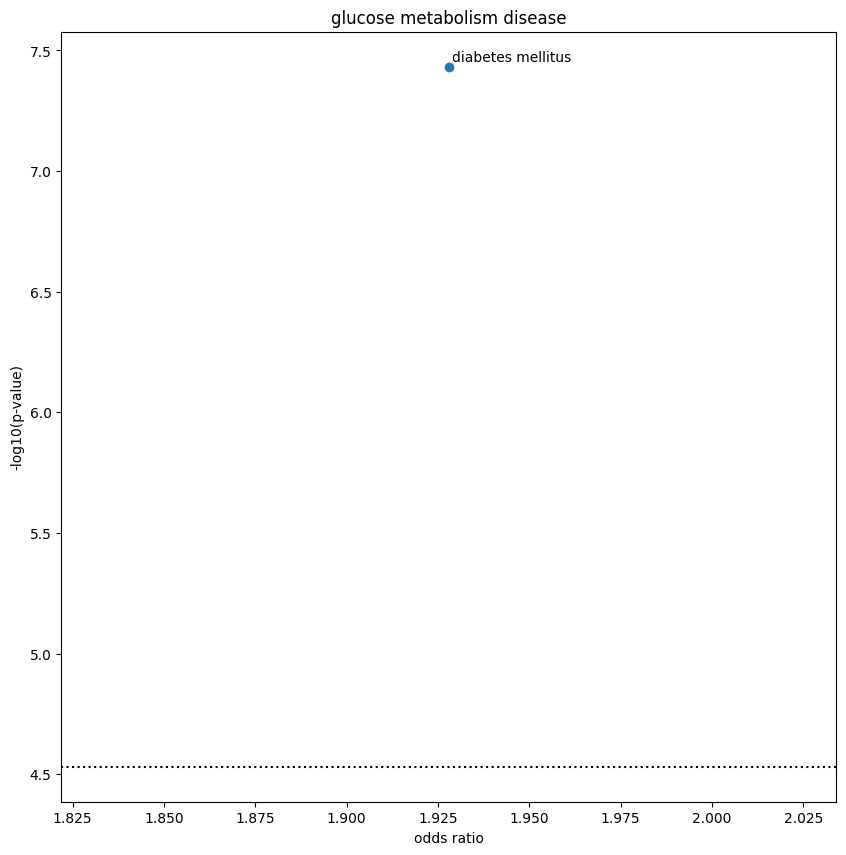

<Figure size 640x480 with 0 Axes>

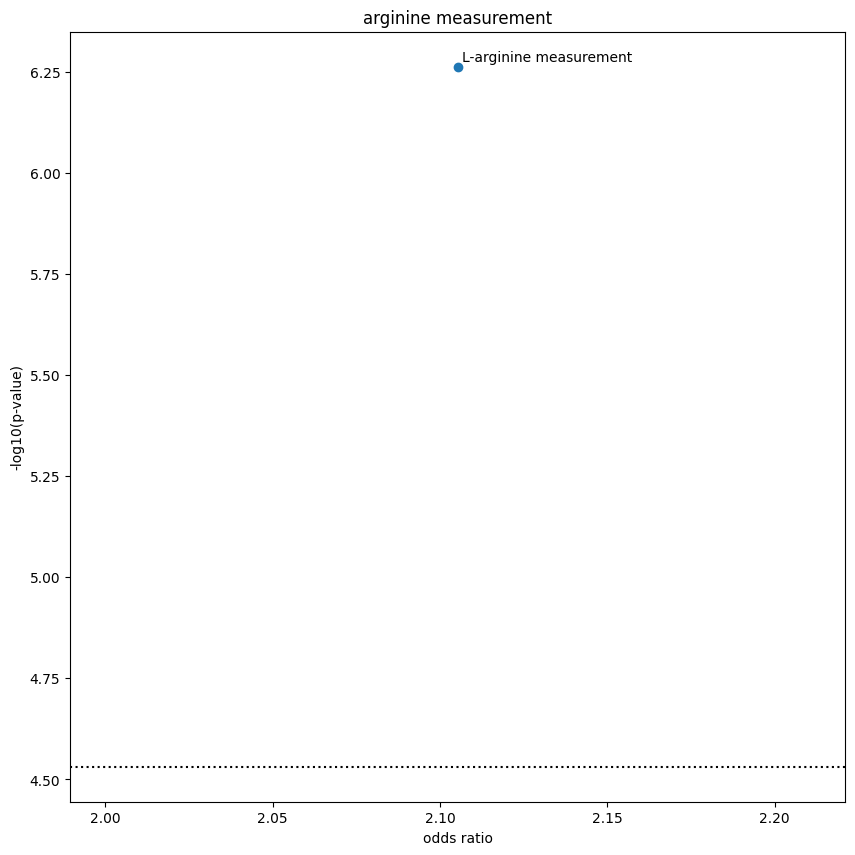

<Figure size 640x480 with 0 Axes>

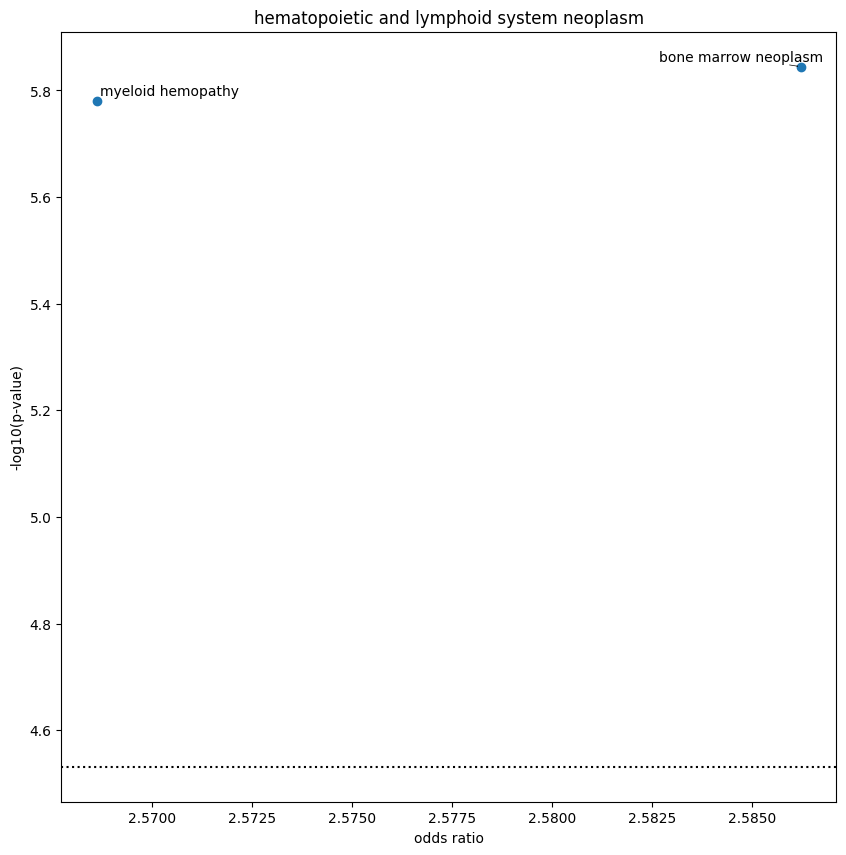

<Figure size 640x480 with 0 Axes>

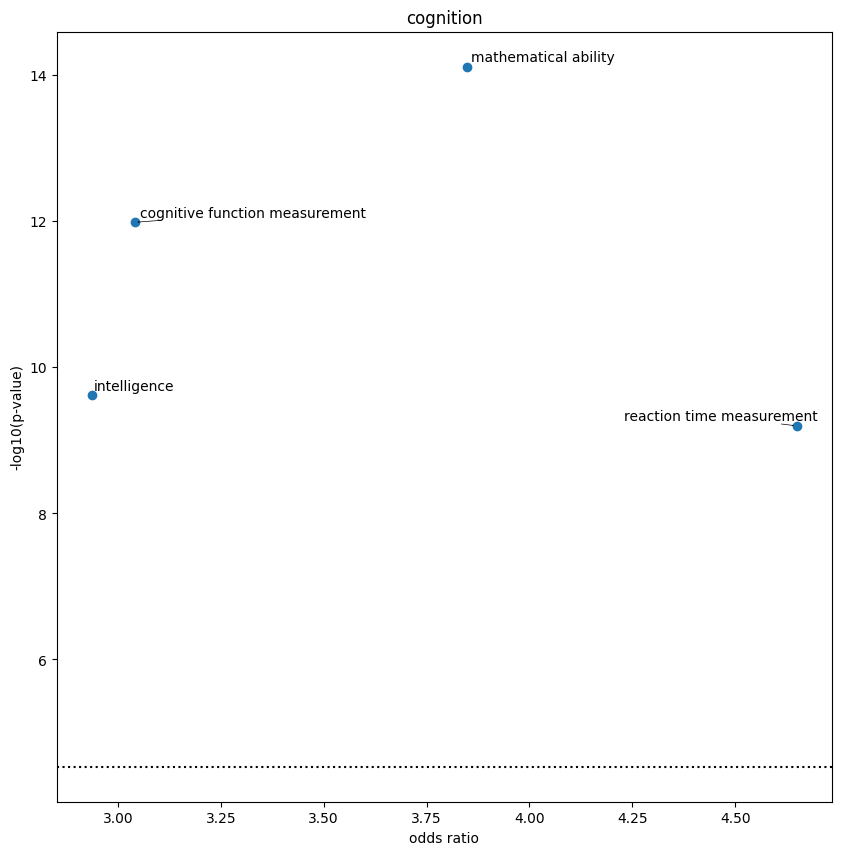

<Figure size 640x480 with 0 Axes>

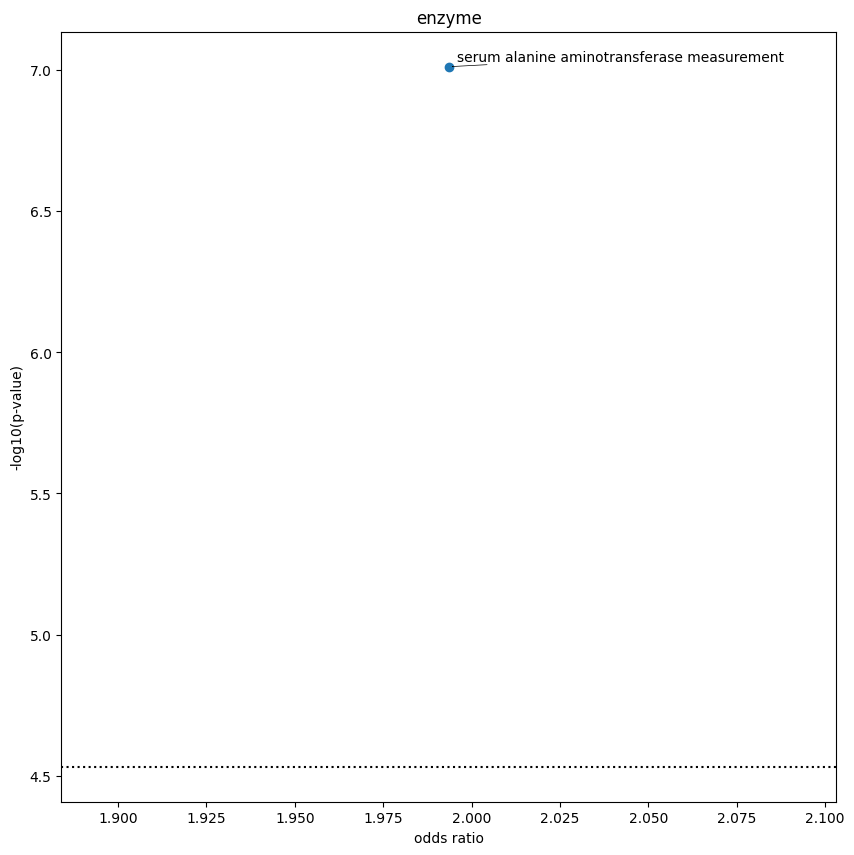

<Figure size 640x480 with 0 Axes>

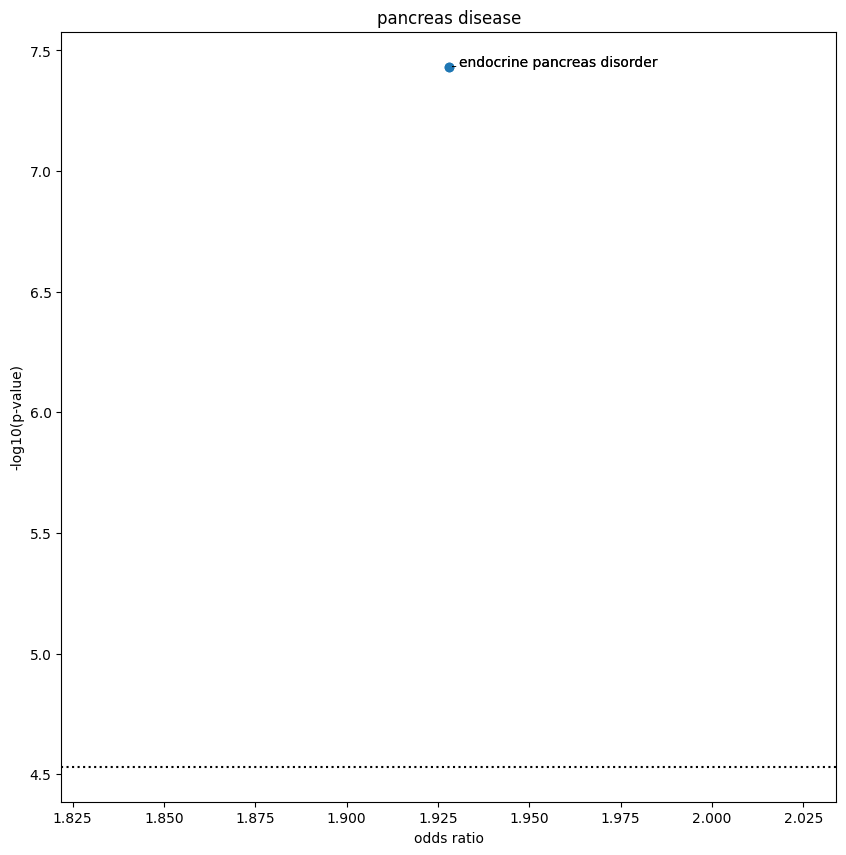

<Figure size 640x480 with 0 Axes>

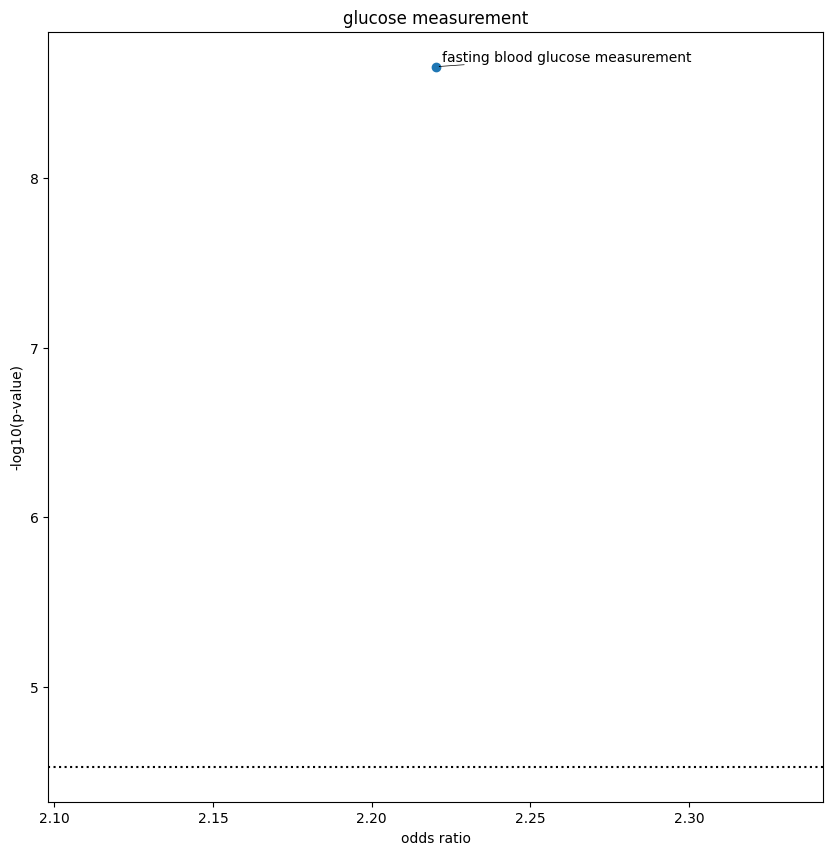

<Figure size 640x480 with 0 Axes>

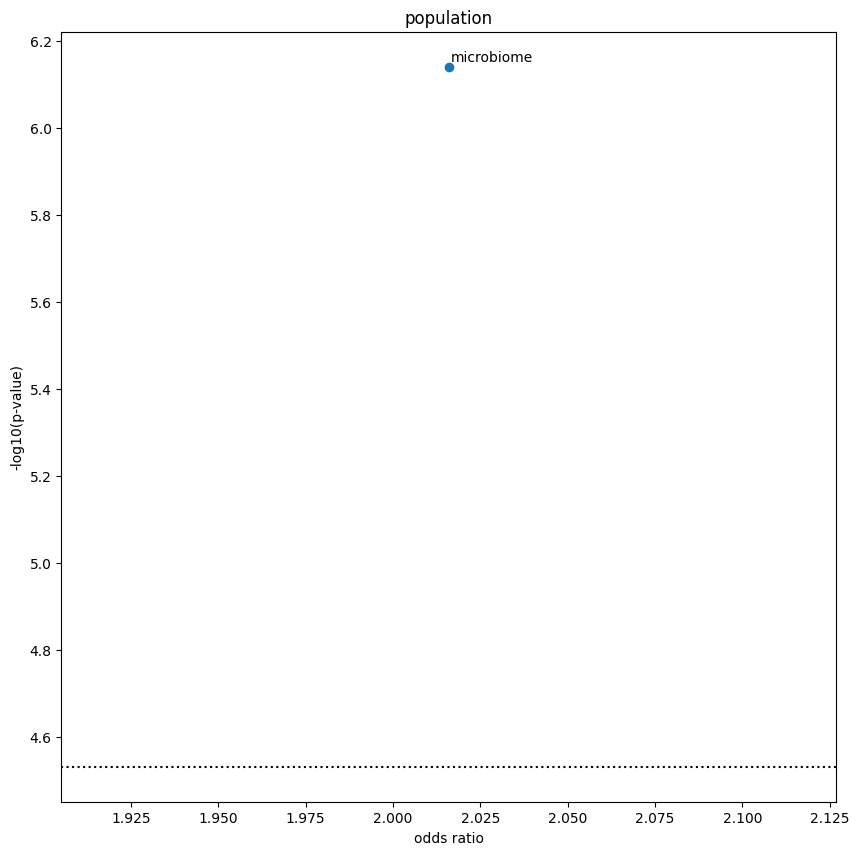

<Figure size 640x480 with 0 Axes>

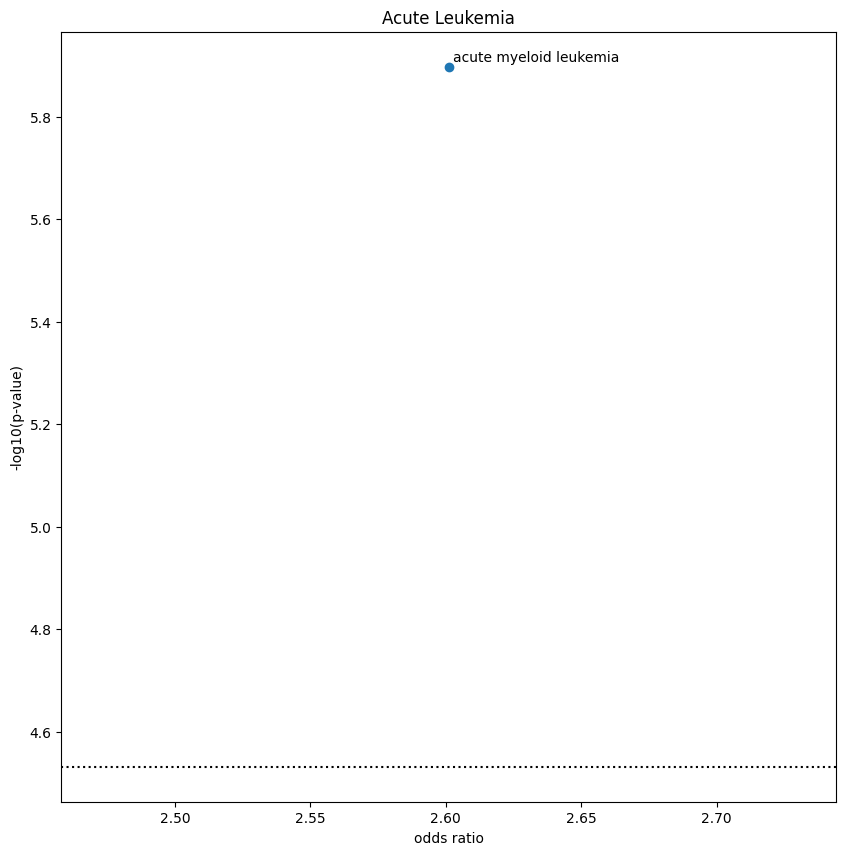

<Figure size 640x480 with 0 Axes>

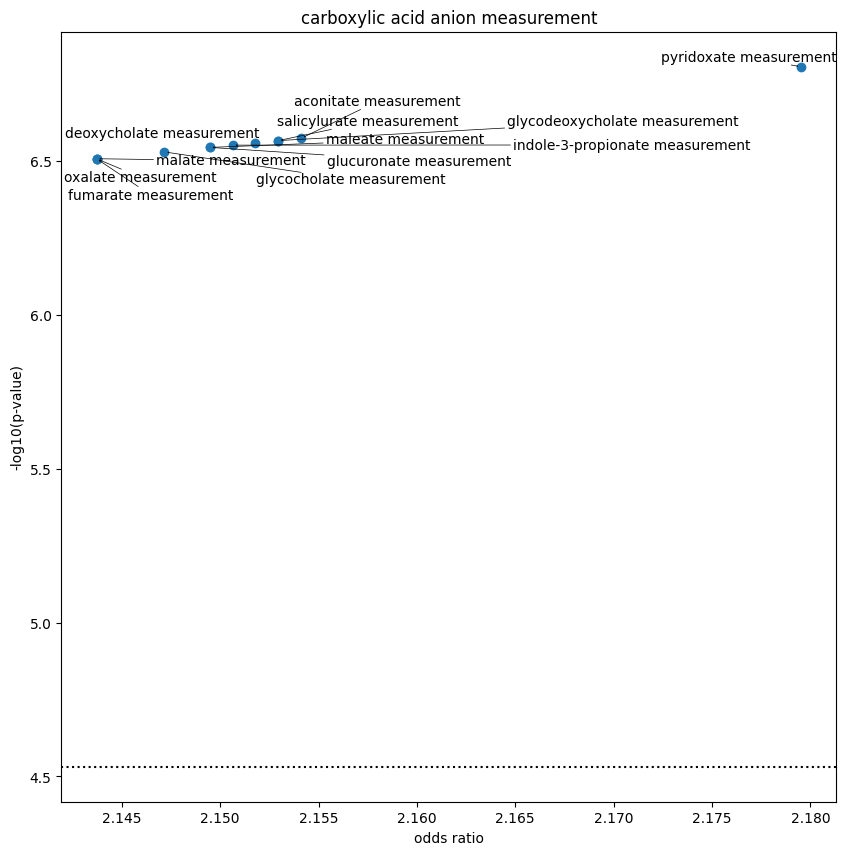

<Figure size 640x480 with 0 Axes>

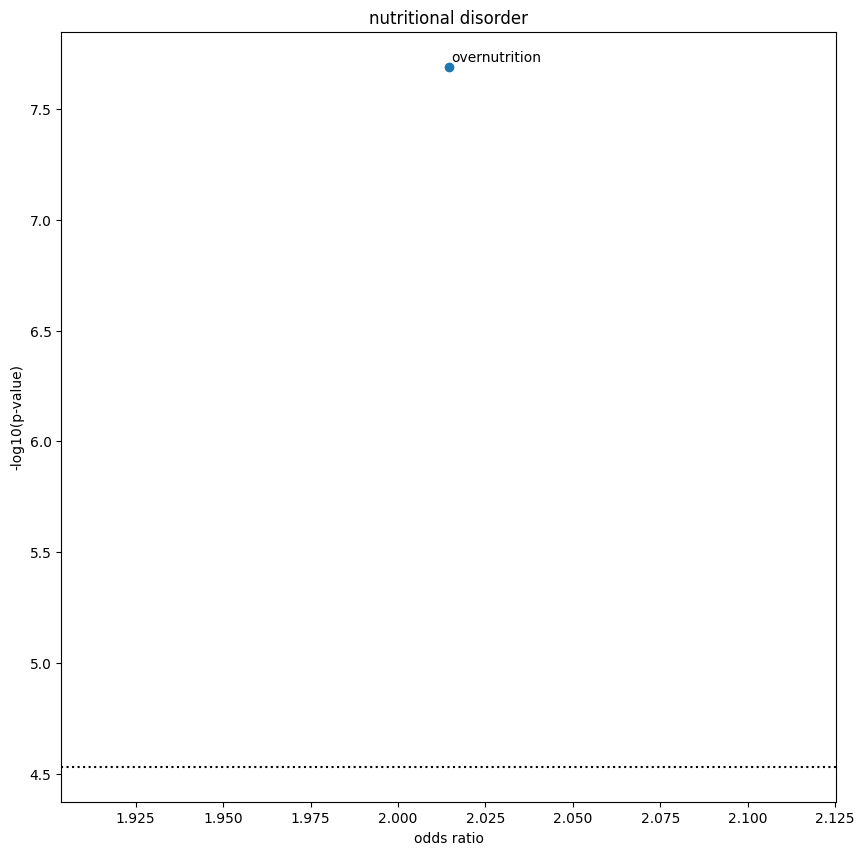

<Figure size 640x480 with 0 Axes>

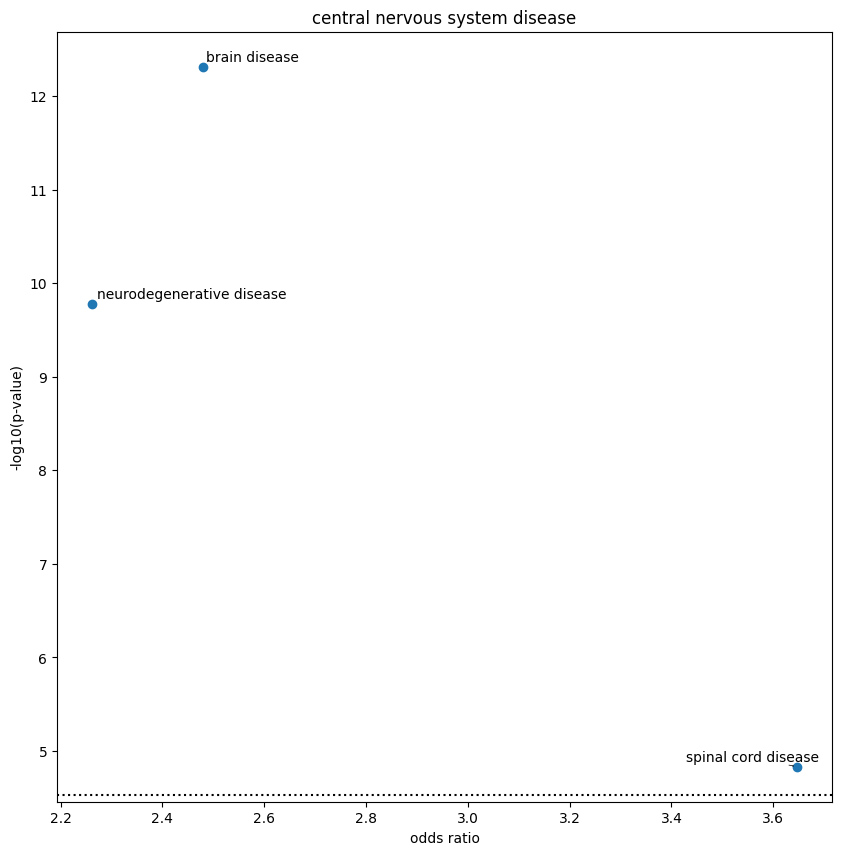

<Figure size 640x480 with 0 Axes>

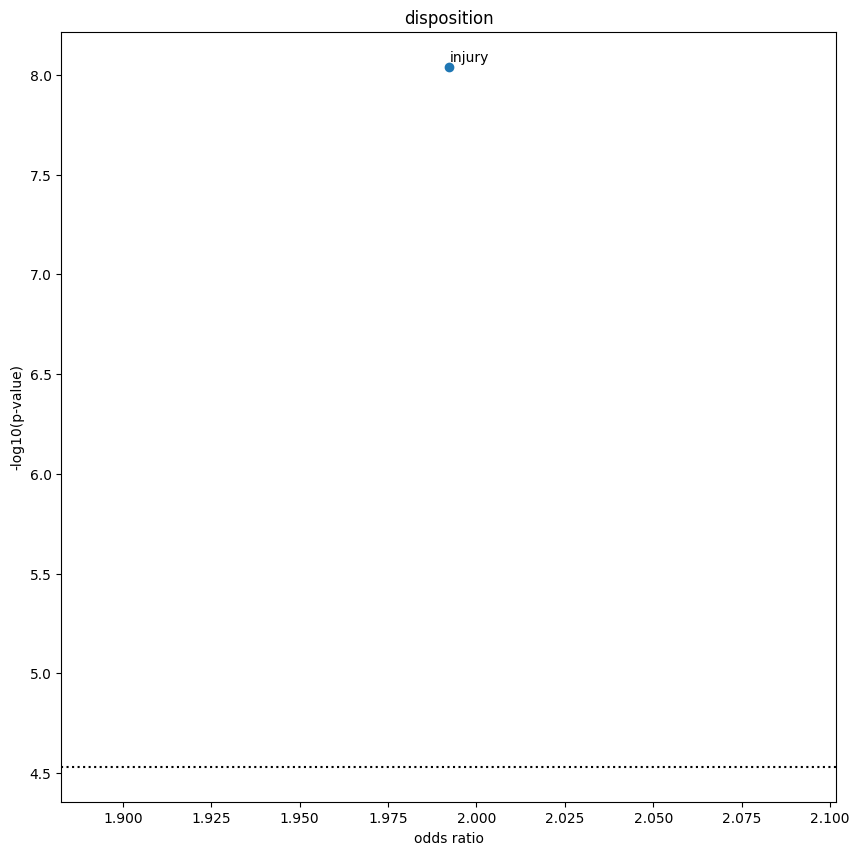

<Figure size 640x480 with 0 Axes>

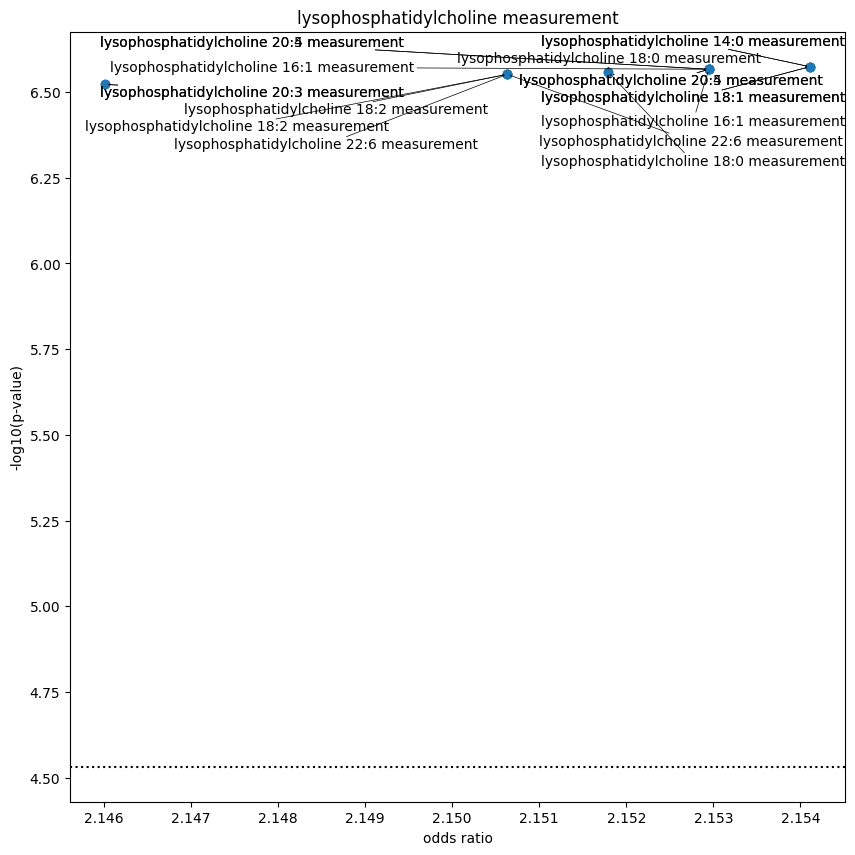

<Figure size 640x480 with 0 Axes>

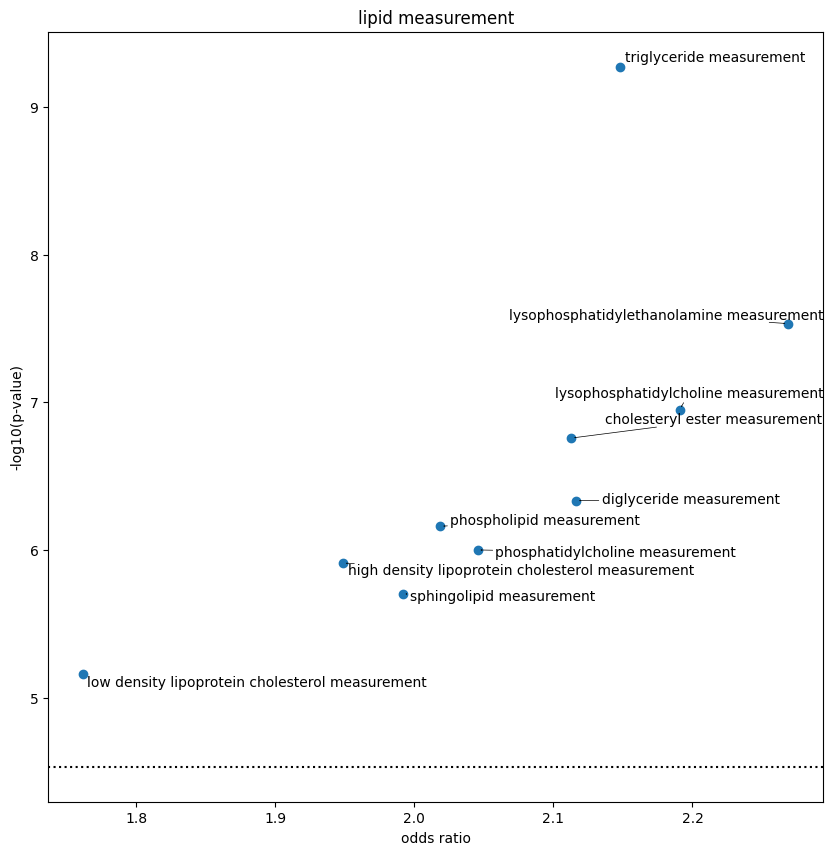

<Figure size 640x480 with 0 Axes>

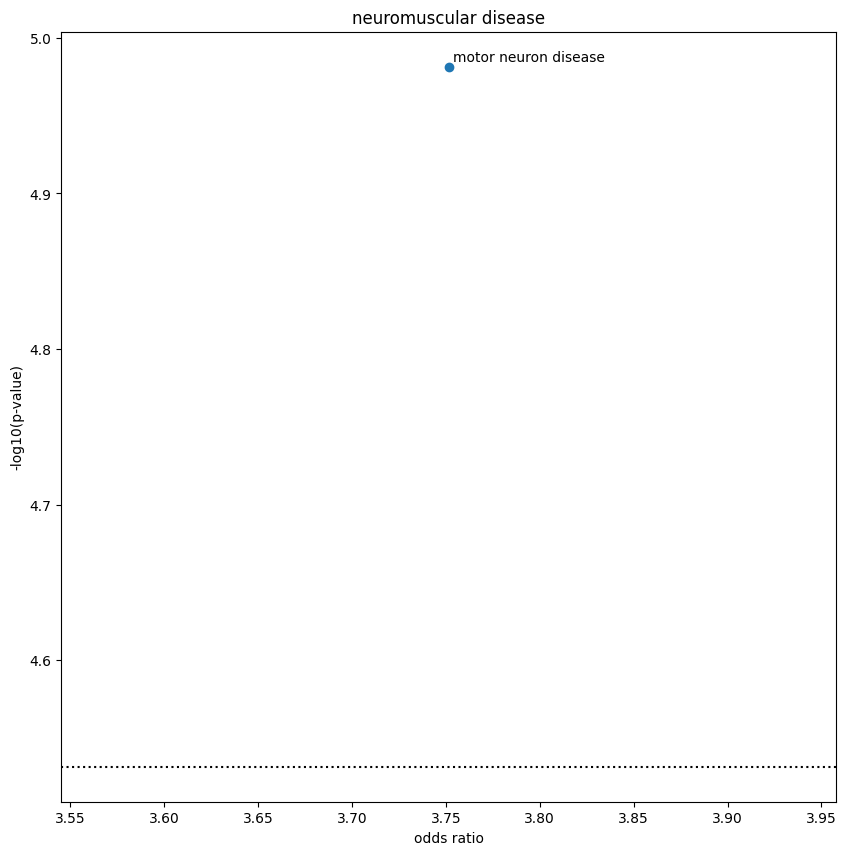

<Figure size 640x480 with 0 Axes>

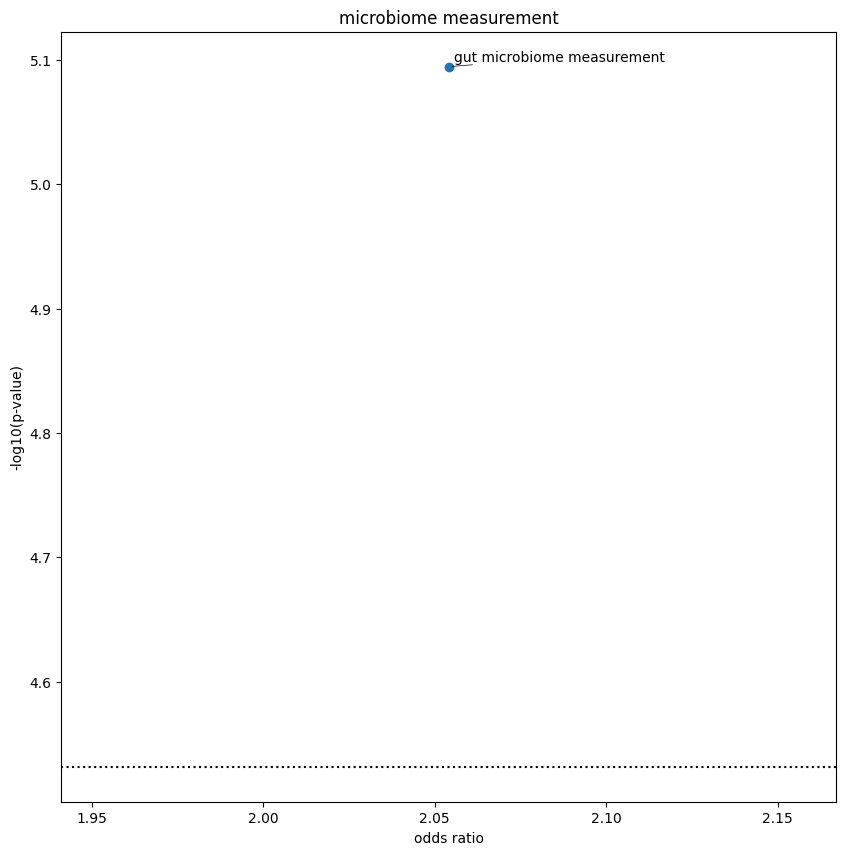

<Figure size 640x480 with 0 Axes>

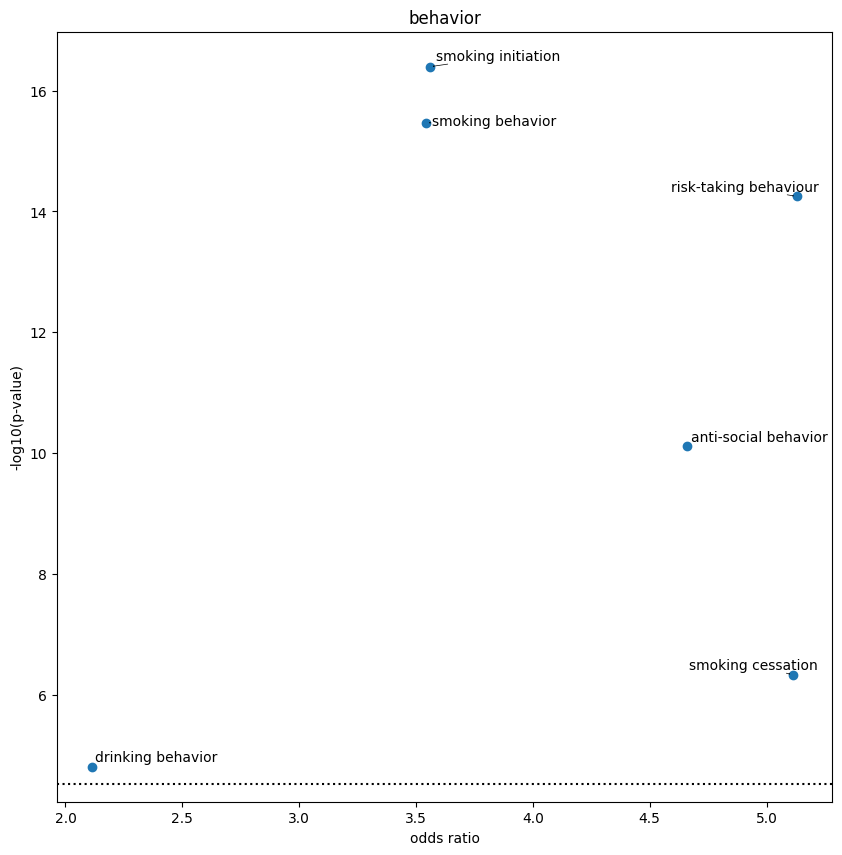

<Figure size 640x480 with 0 Axes>

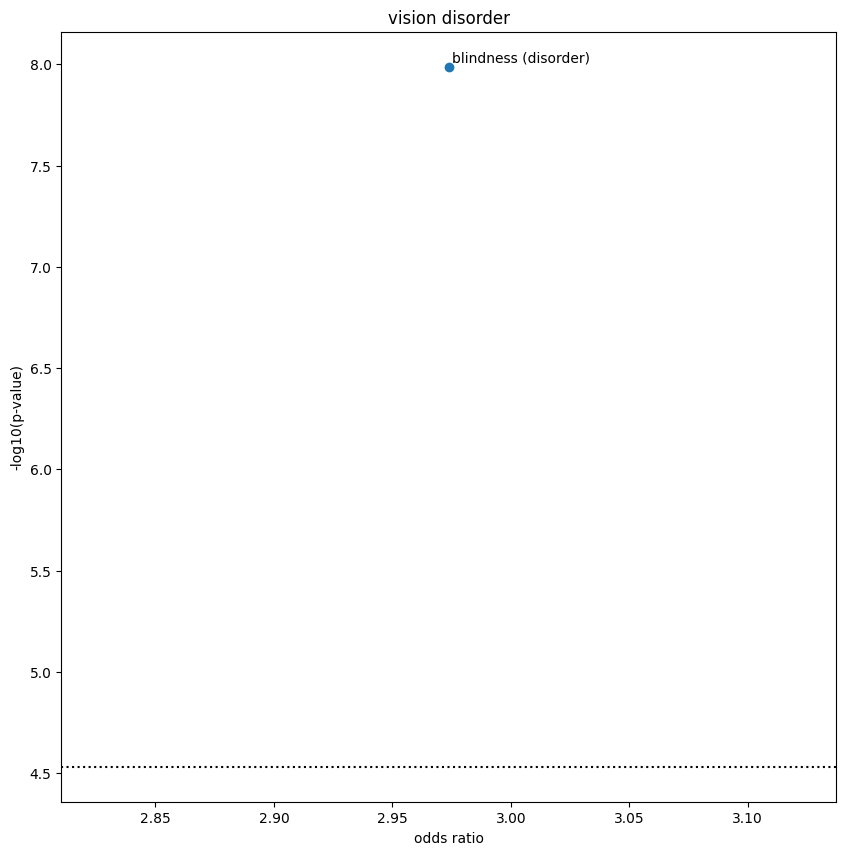

<Figure size 640x480 with 0 Axes>

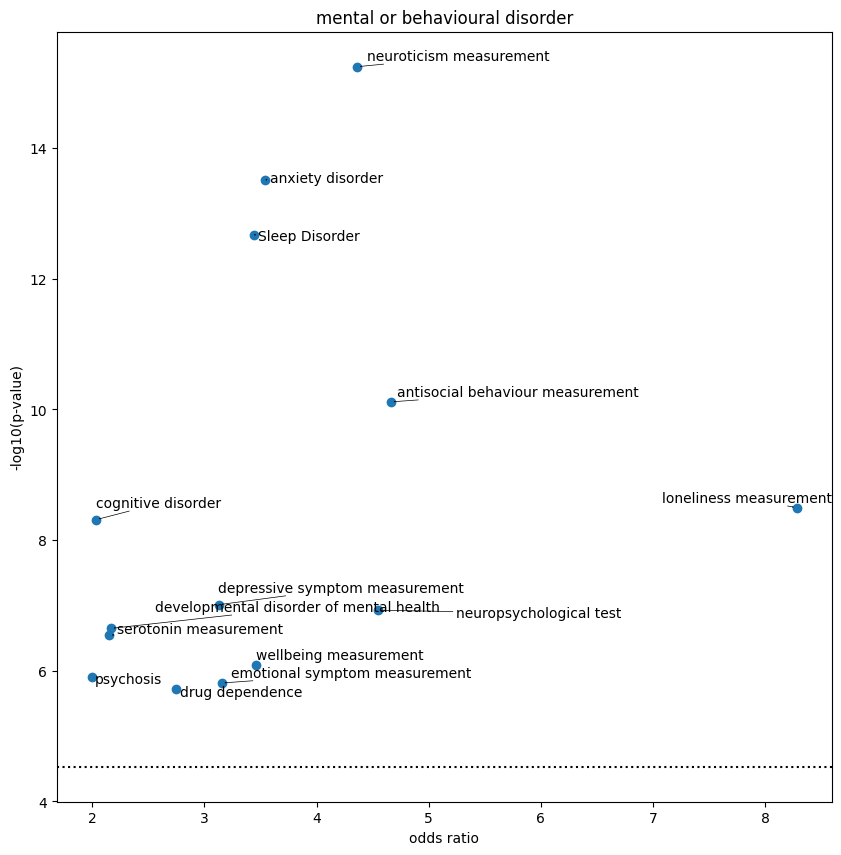

<Figure size 640x480 with 0 Axes>

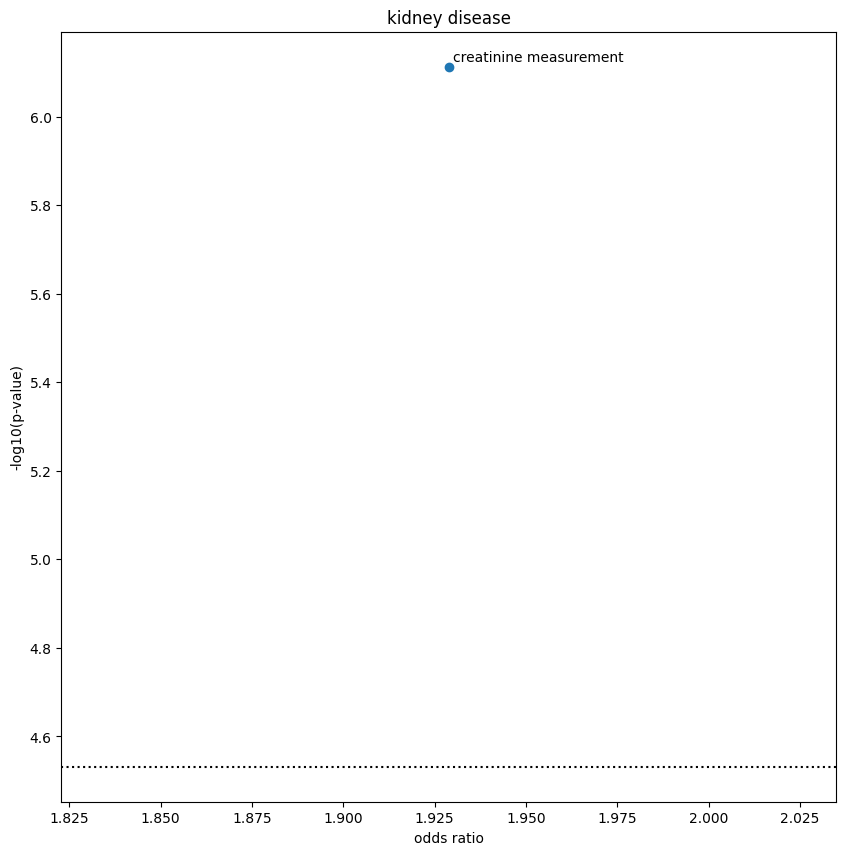

<Figure size 640x480 with 0 Axes>

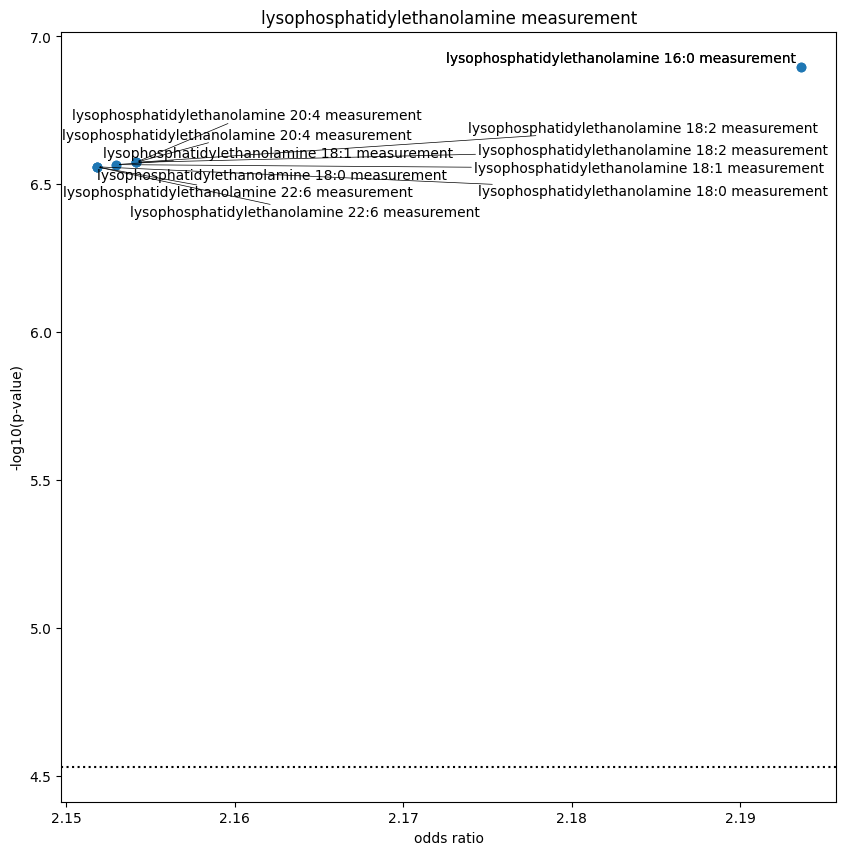

<Figure size 640x480 with 0 Axes>

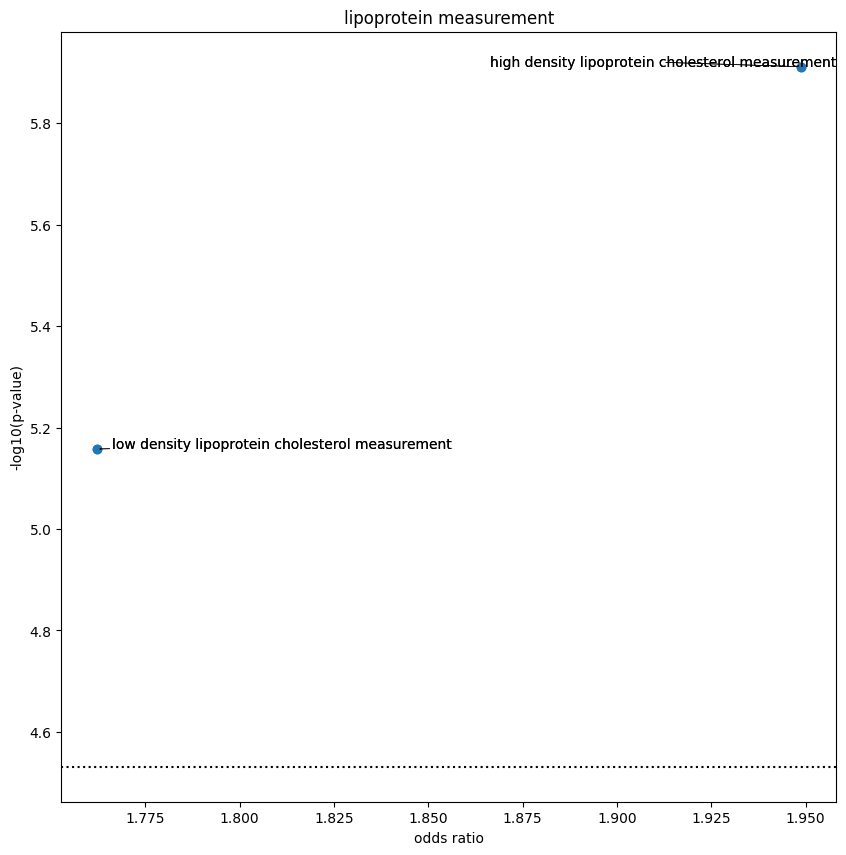

<Figure size 640x480 with 0 Axes>

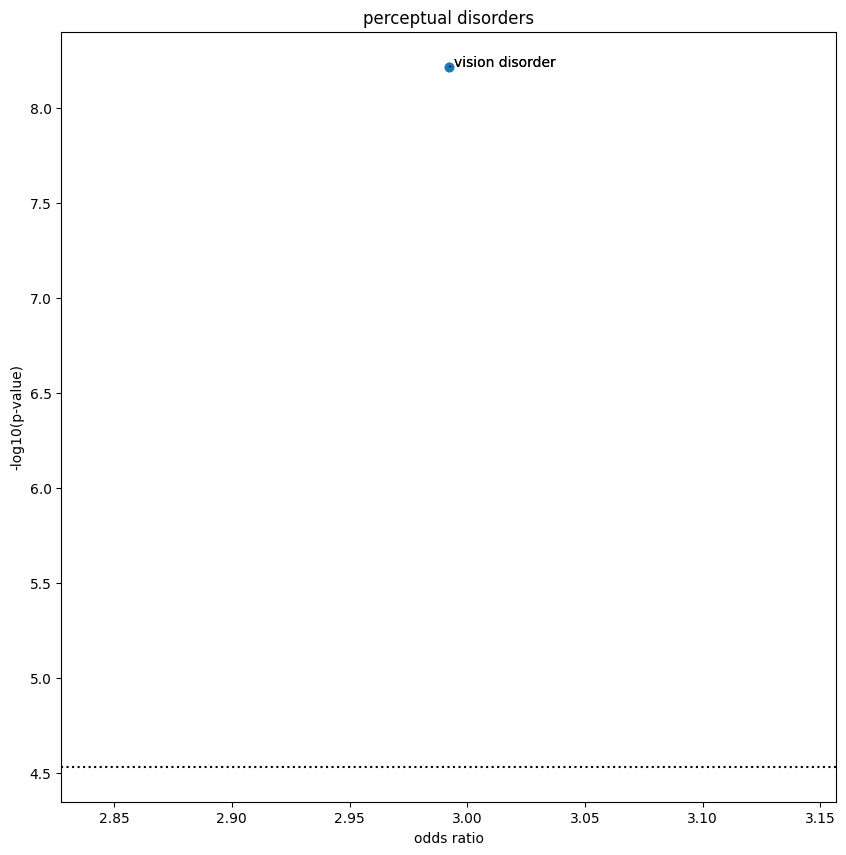

<Figure size 640x480 with 0 Axes>

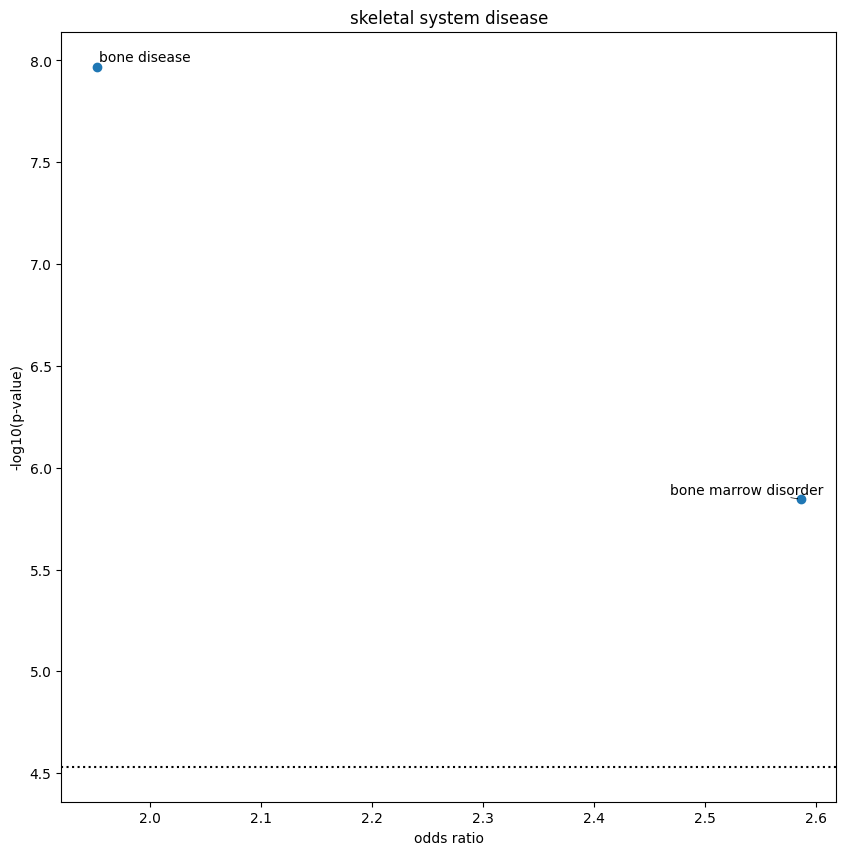

<Figure size 640x480 with 0 Axes>

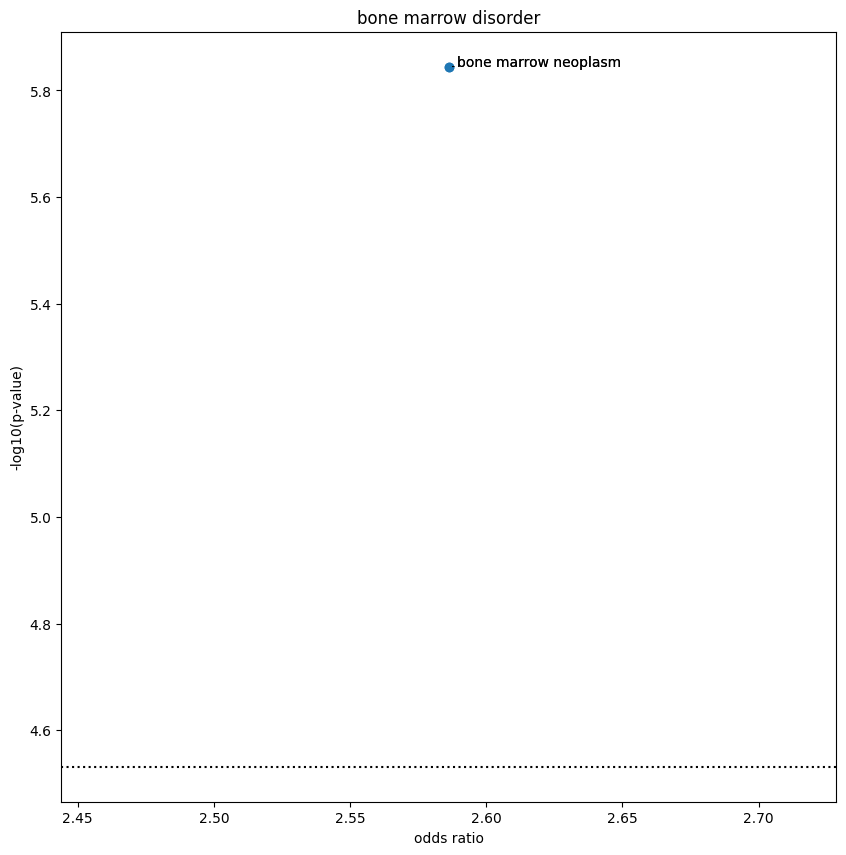

<Figure size 640x480 with 0 Axes>

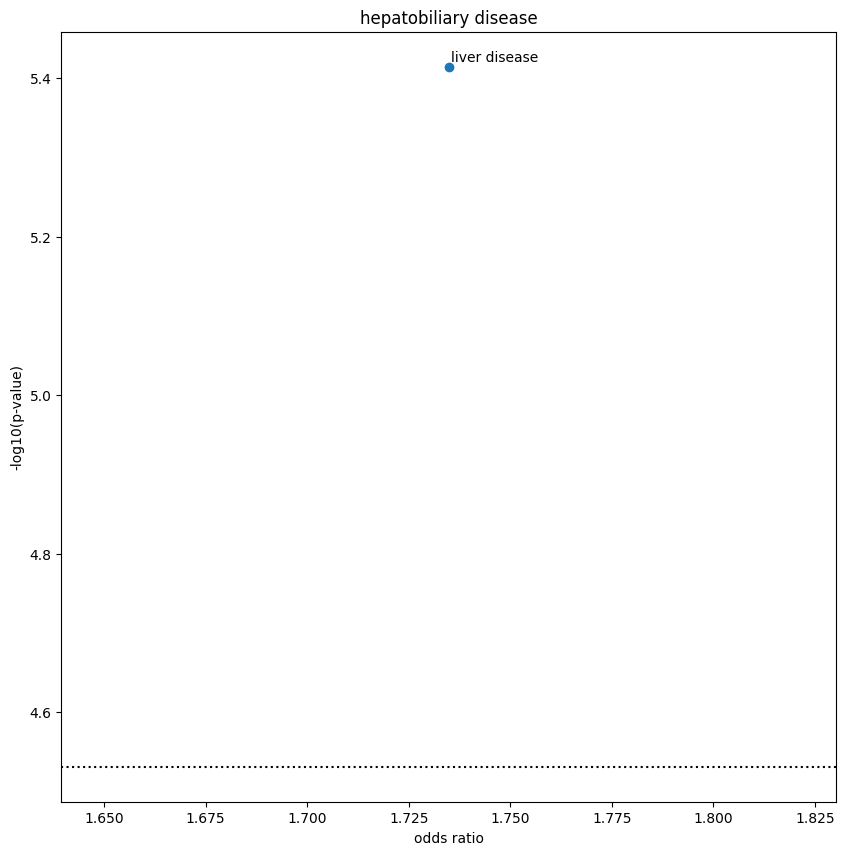

<Figure size 640x480 with 0 Axes>

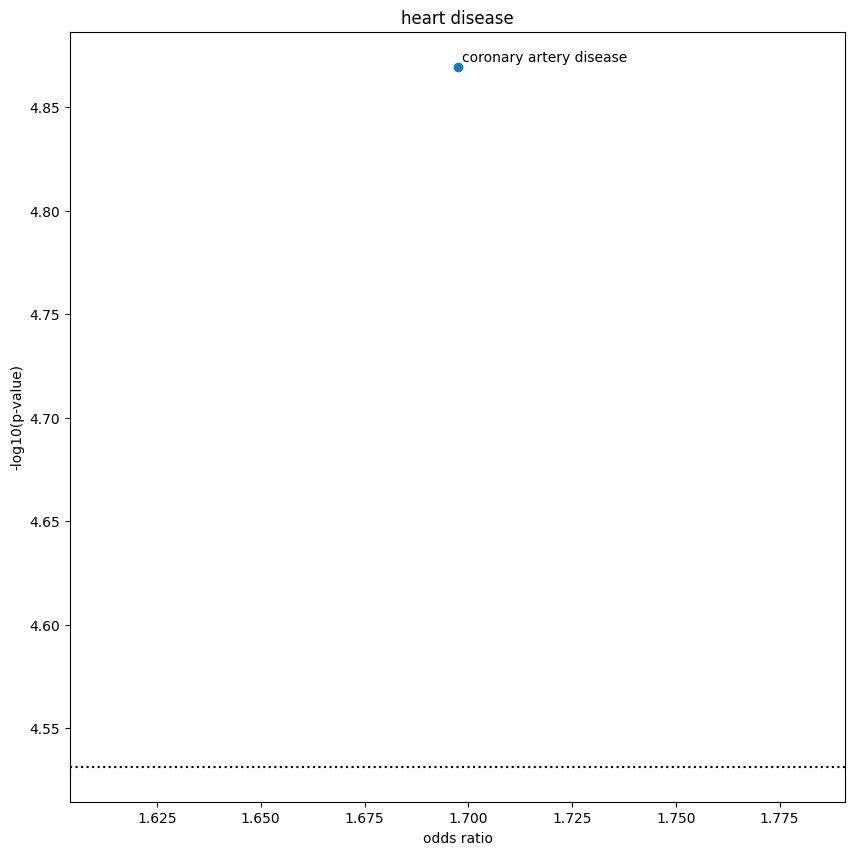

<Figure size 640x480 with 0 Axes>

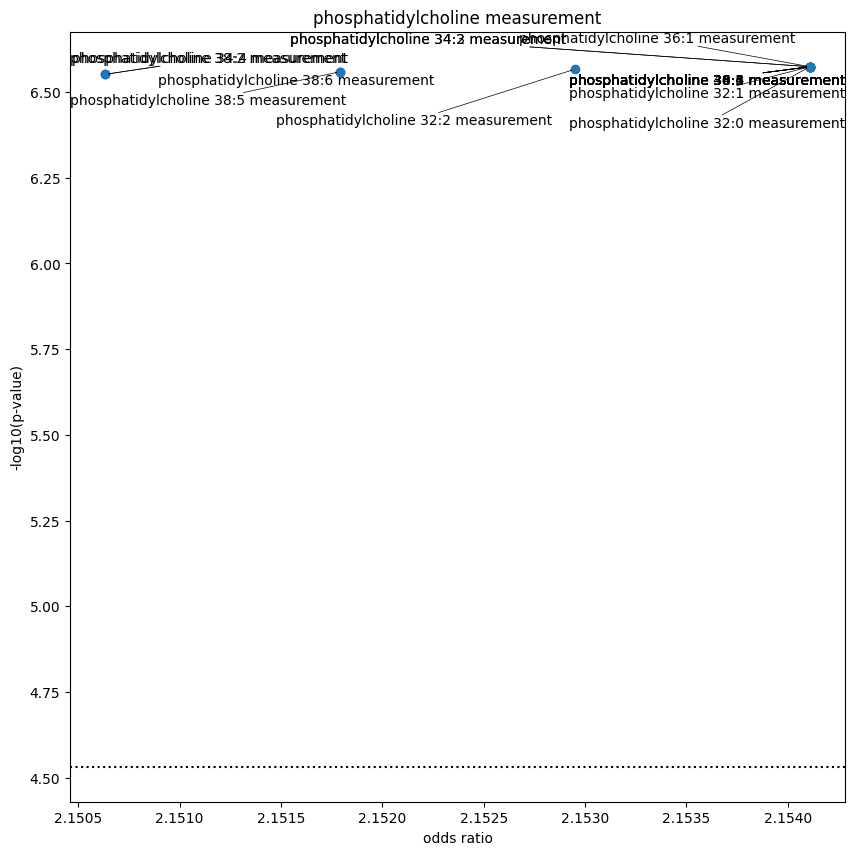

<Figure size 640x480 with 0 Axes>

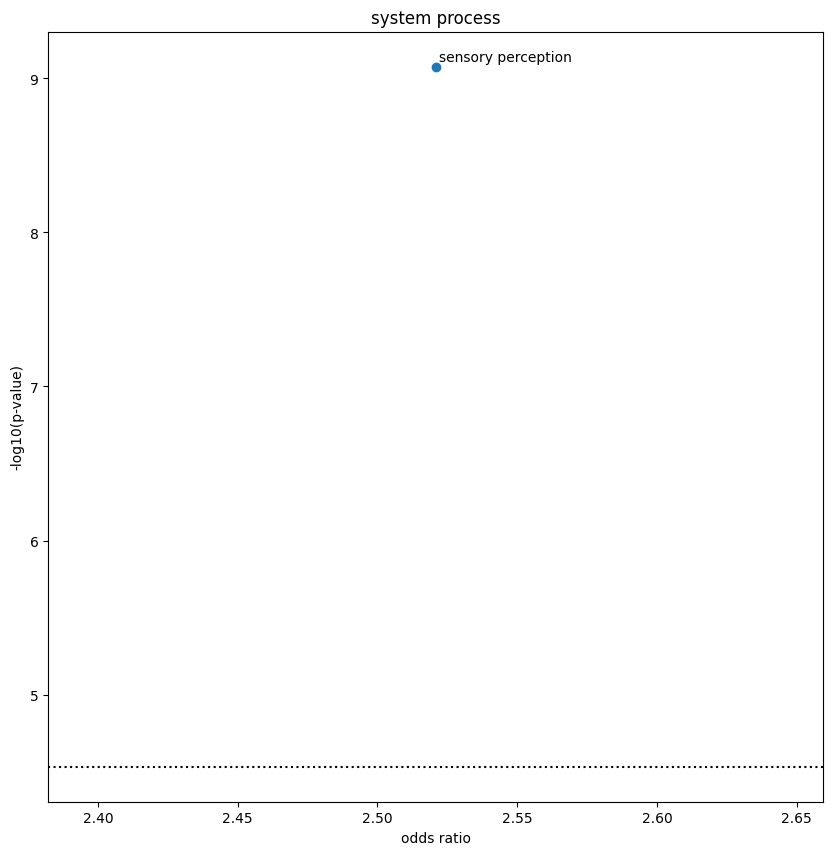

<Figure size 640x480 with 0 Axes>

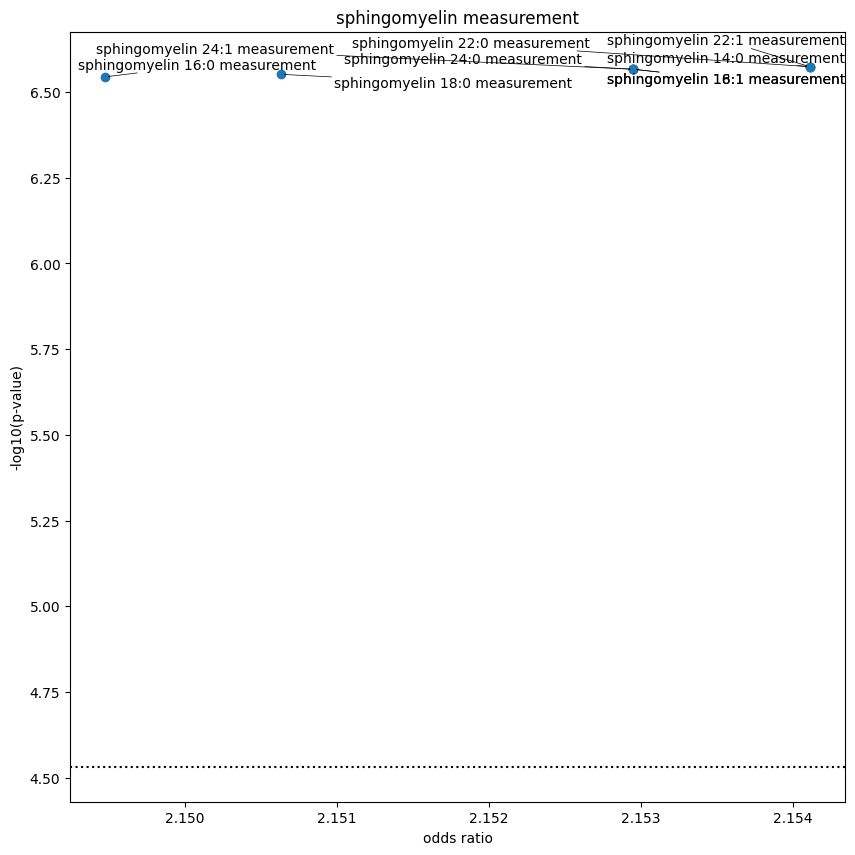

<Figure size 640x480 with 0 Axes>

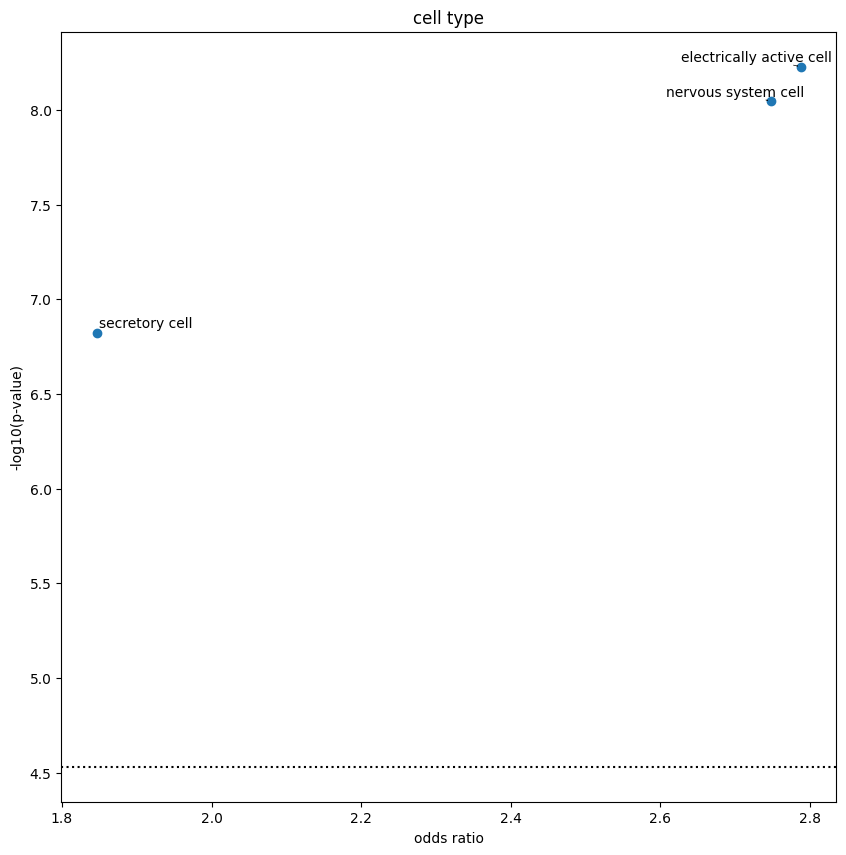

<Figure size 640x480 with 0 Axes>

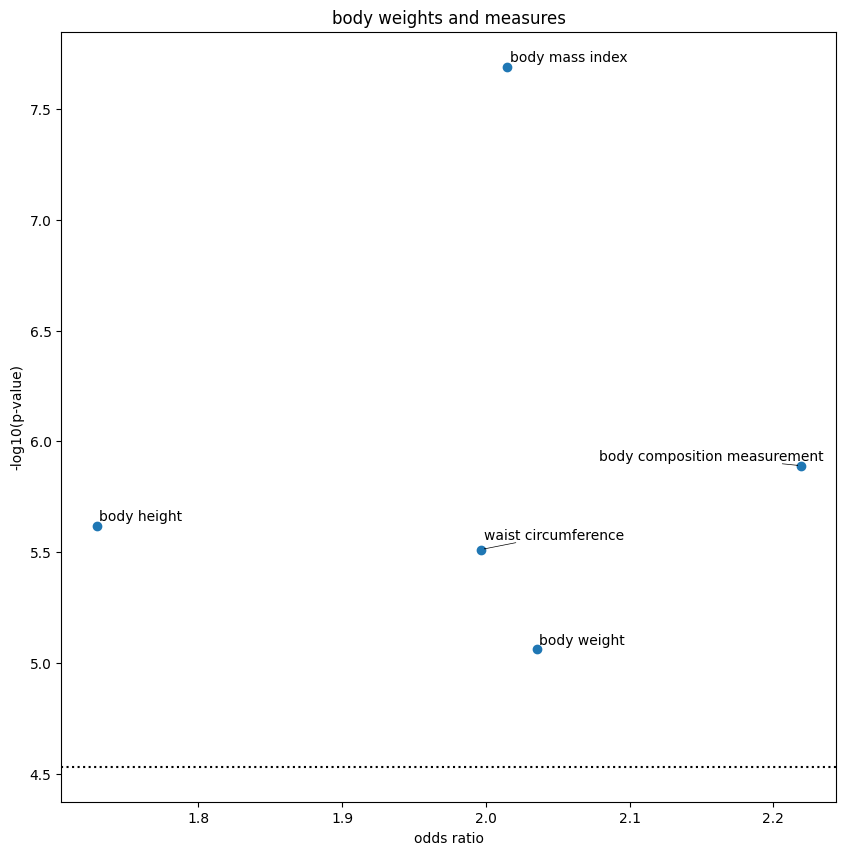

<Figure size 640x480 with 0 Axes>

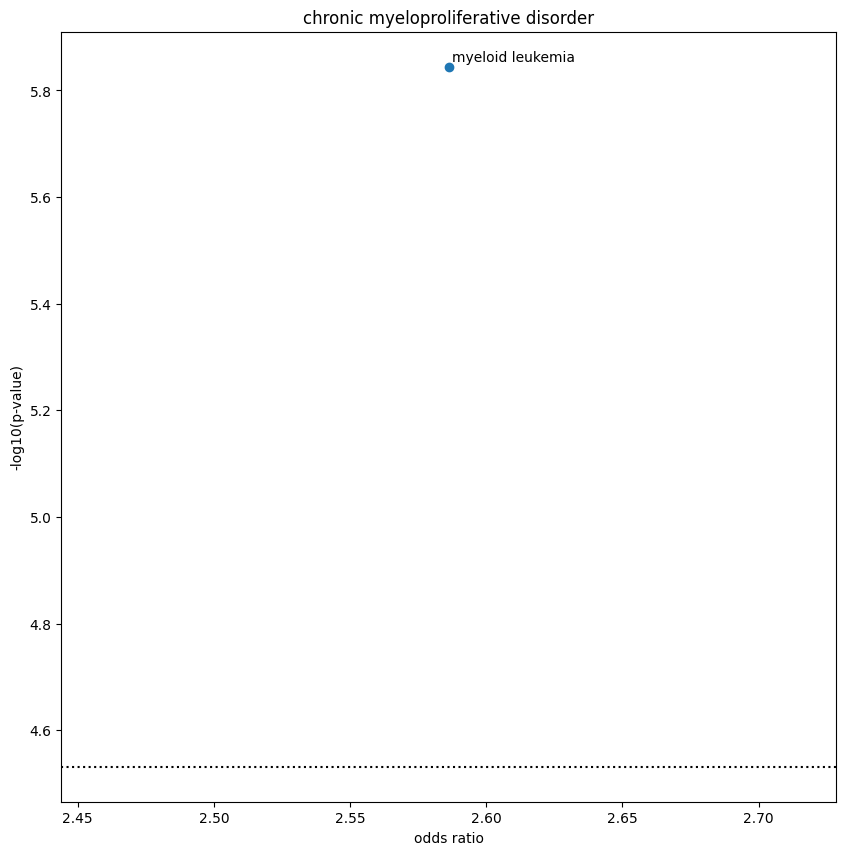

<Figure size 640x480 with 0 Axes>

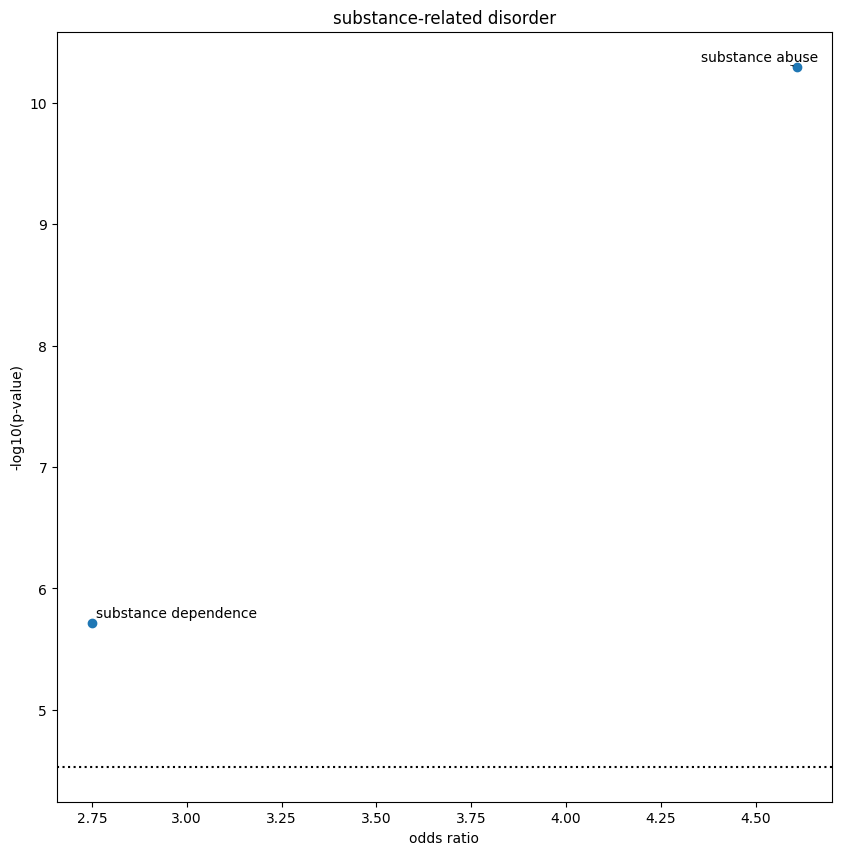

<Figure size 640x480 with 0 Axes>

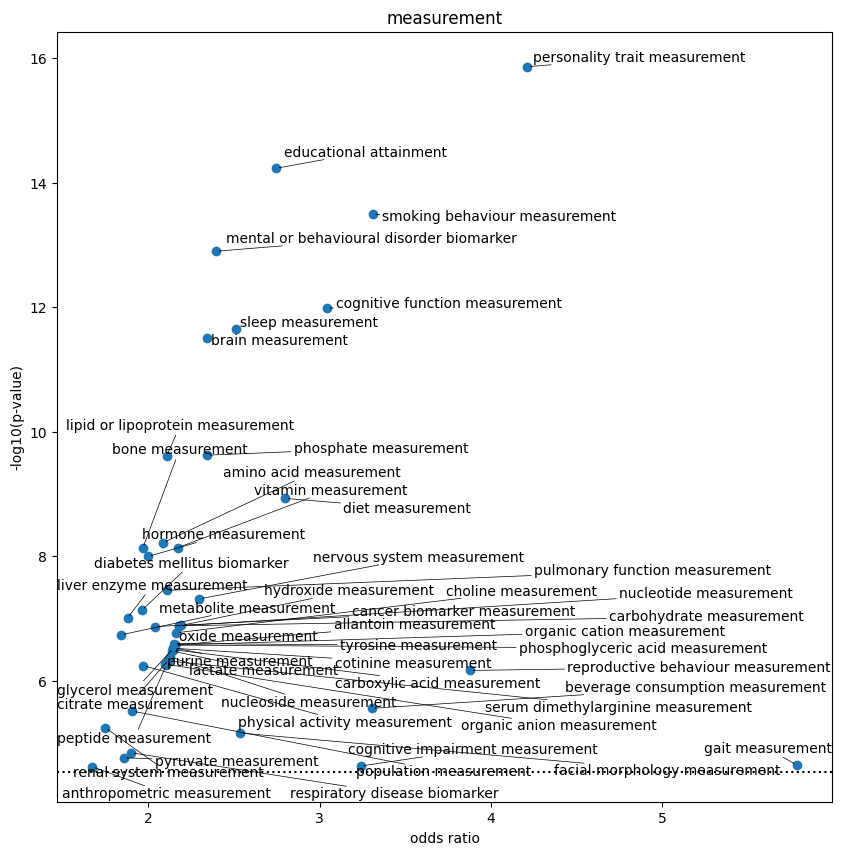

<Figure size 640x480 with 0 Axes>

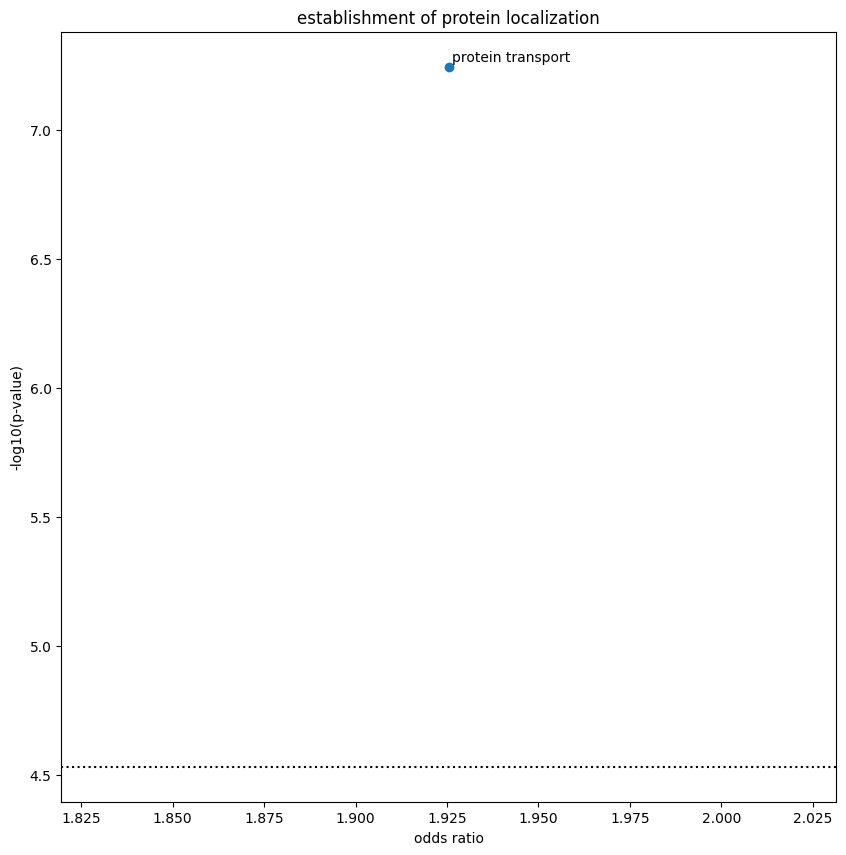

<Figure size 640x480 with 0 Axes>

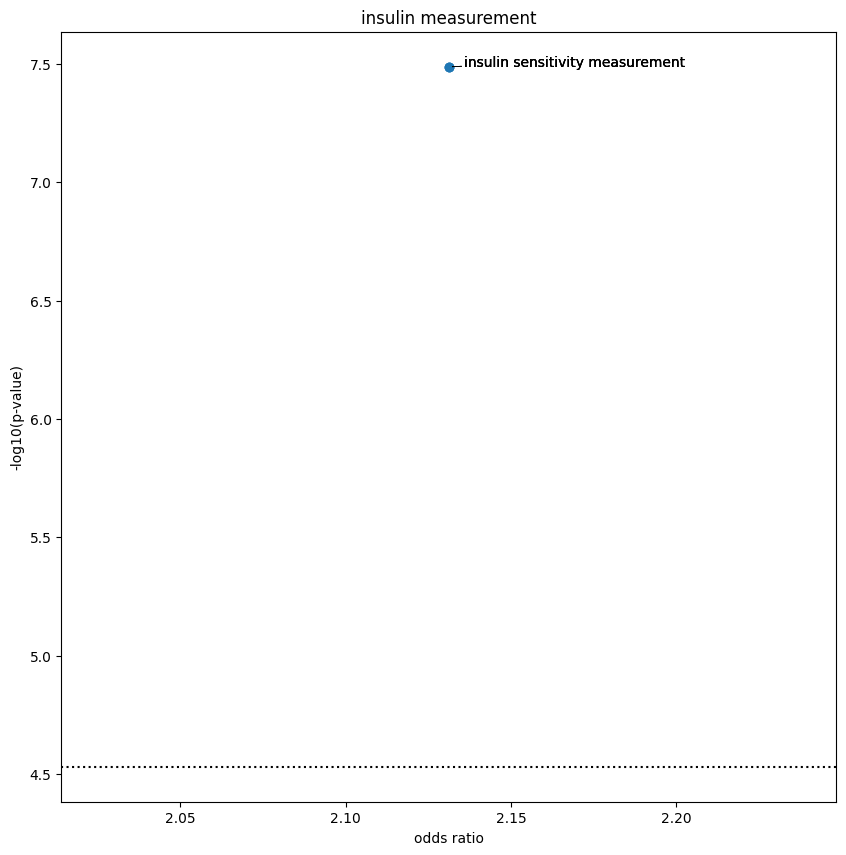

<Figure size 640x480 with 0 Axes>

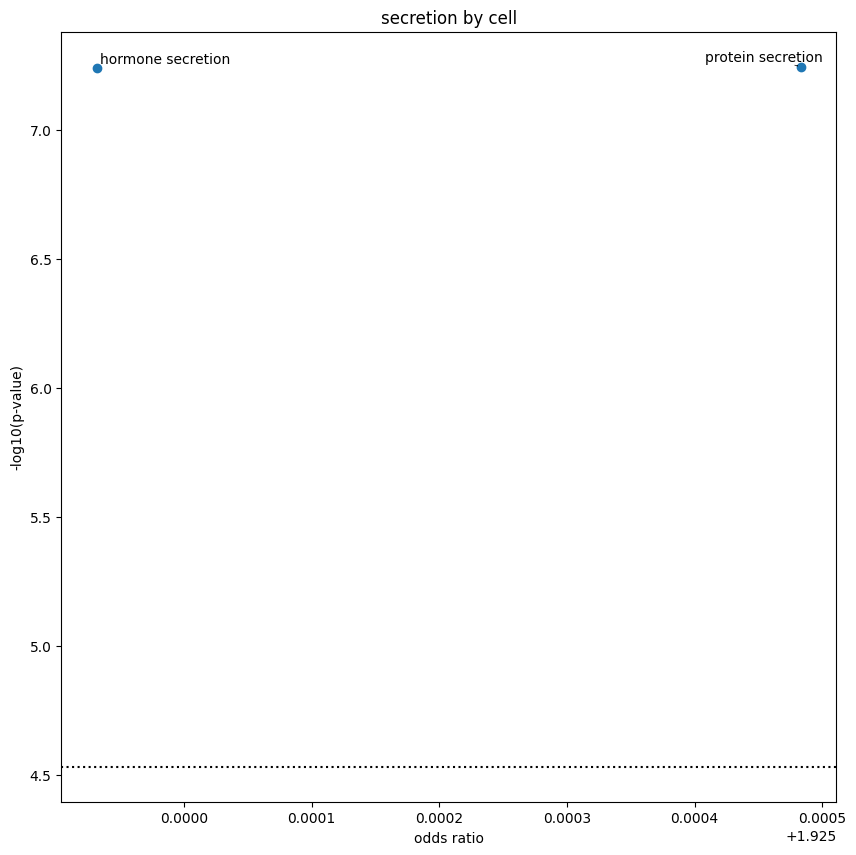

<Figure size 640x480 with 0 Axes>

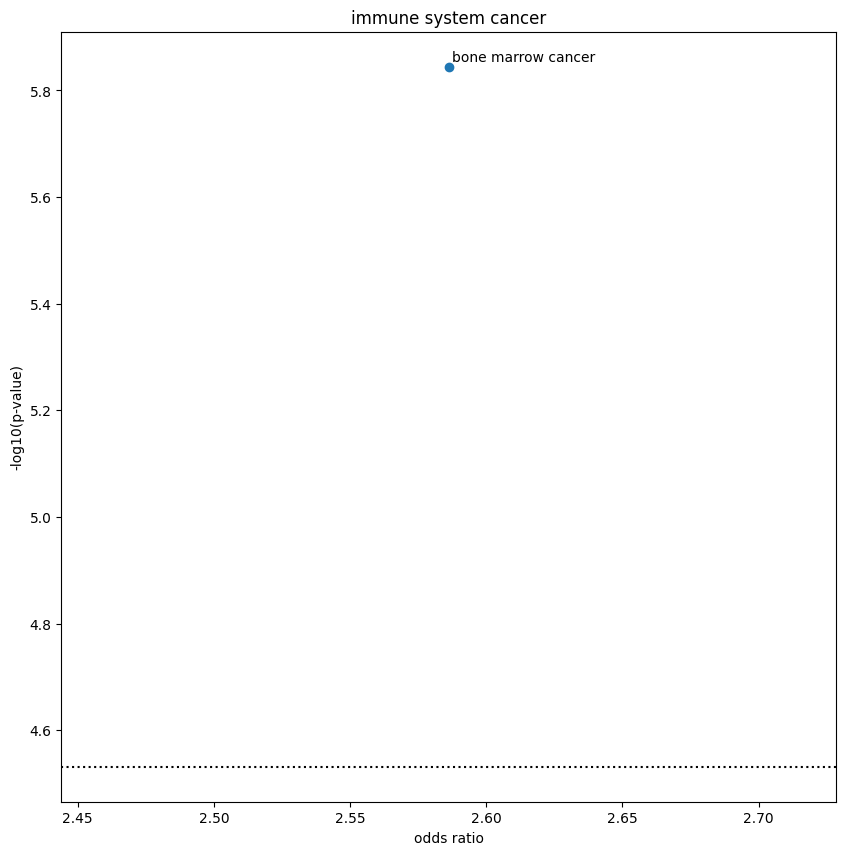

<Figure size 640x480 with 0 Axes>

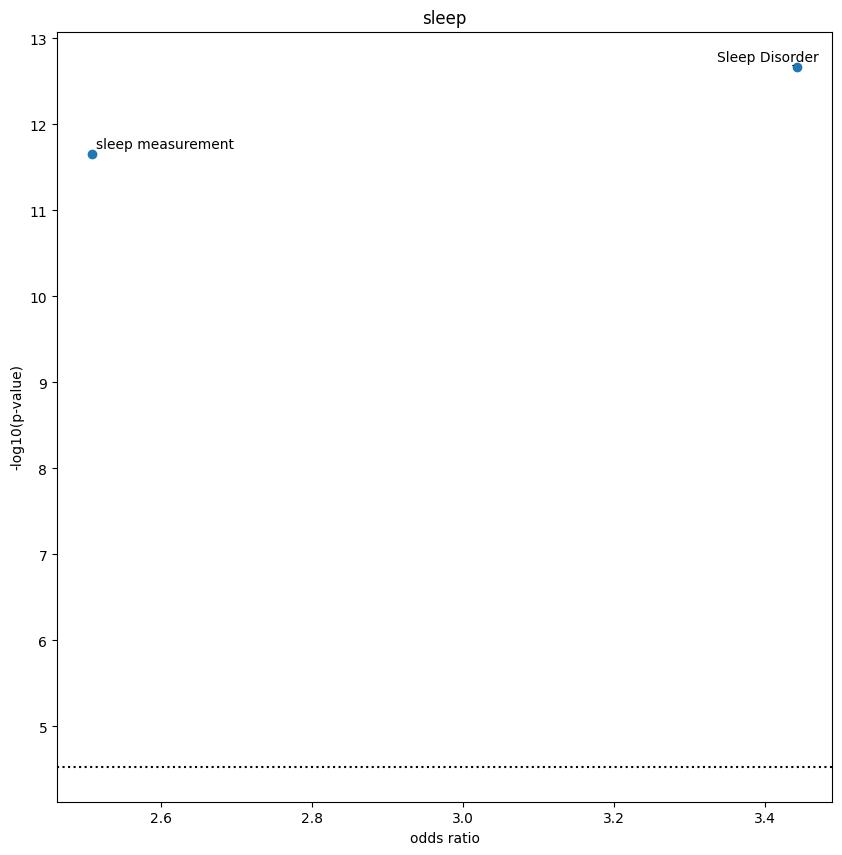

<Figure size 640x480 with 0 Axes>

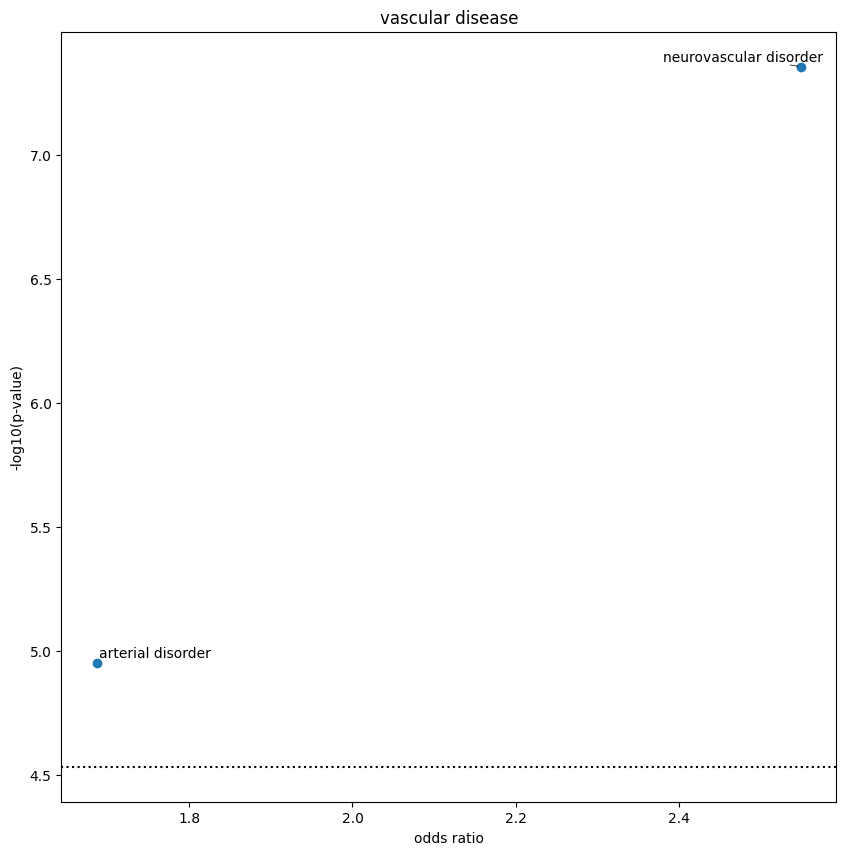

<Figure size 640x480 with 0 Axes>

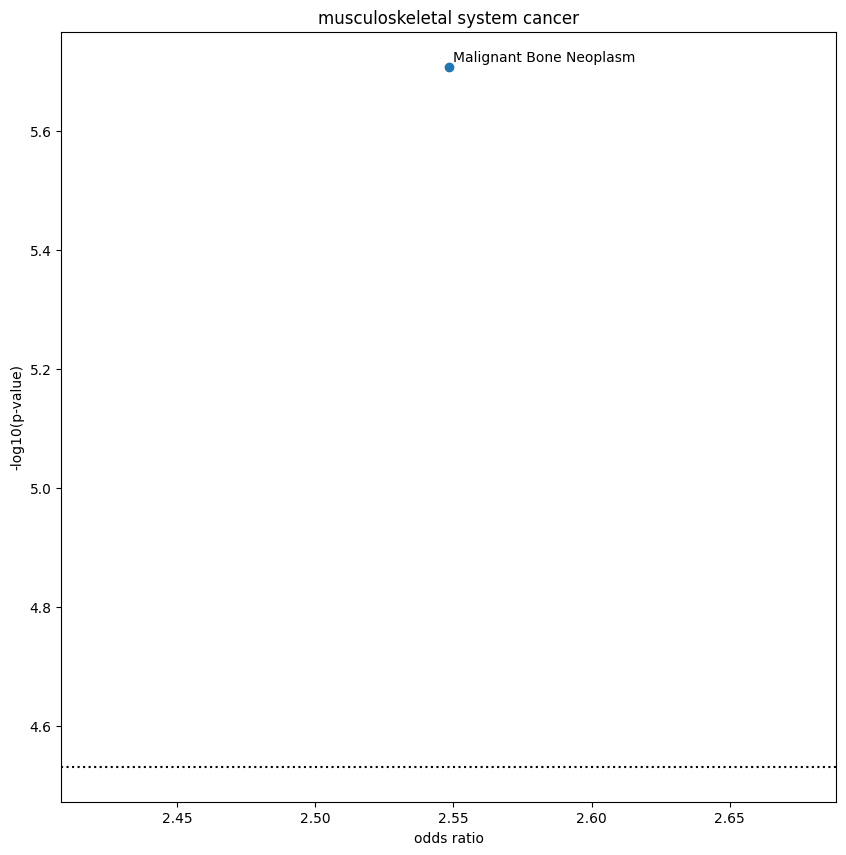

<Figure size 640x480 with 0 Axes>

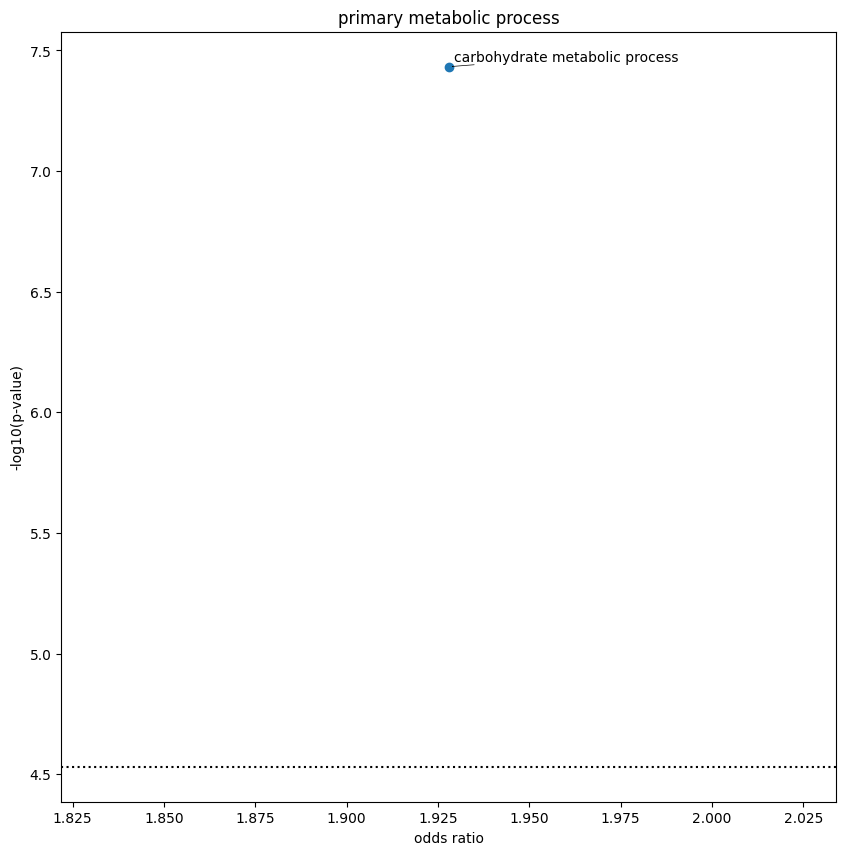

<Figure size 640x480 with 0 Axes>

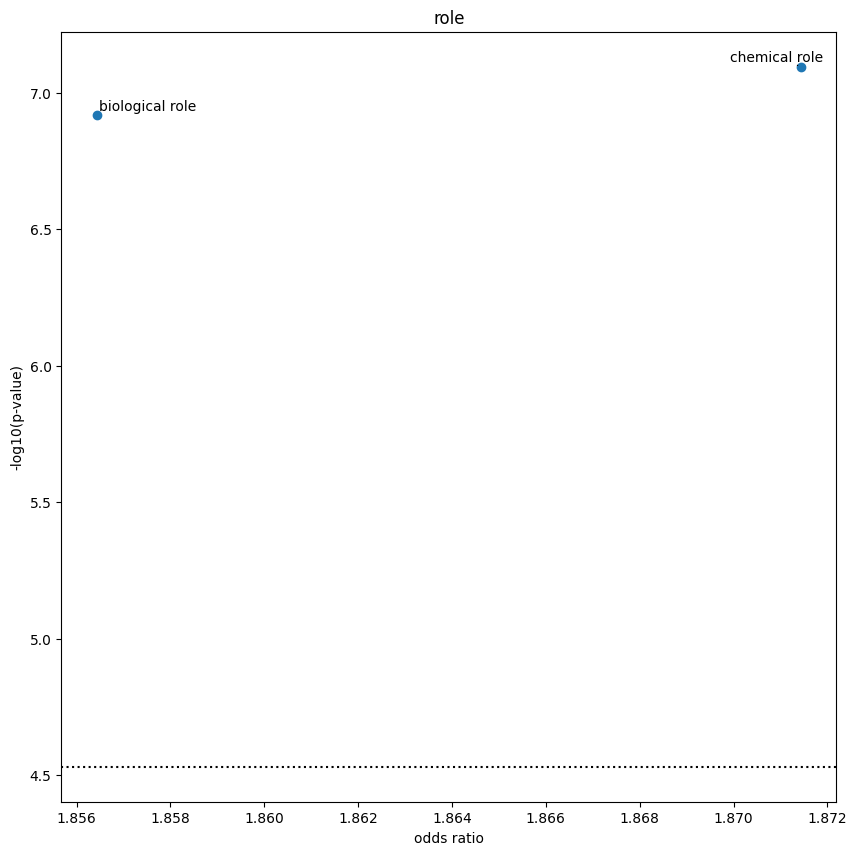

<Figure size 640x480 with 0 Axes>

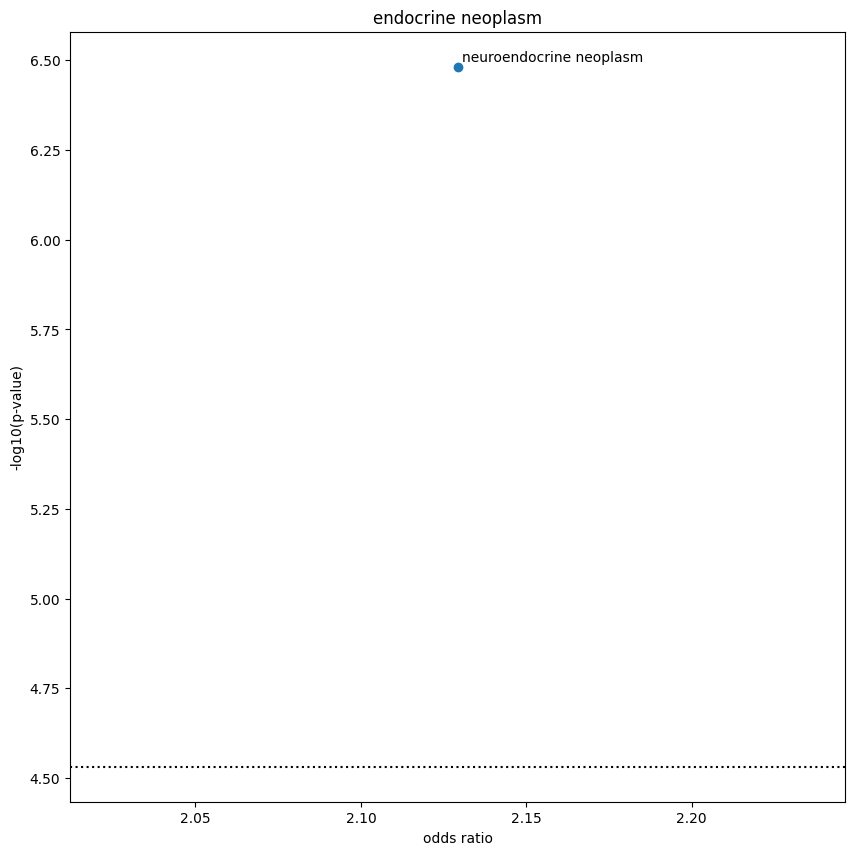

<Figure size 640x480 with 0 Axes>

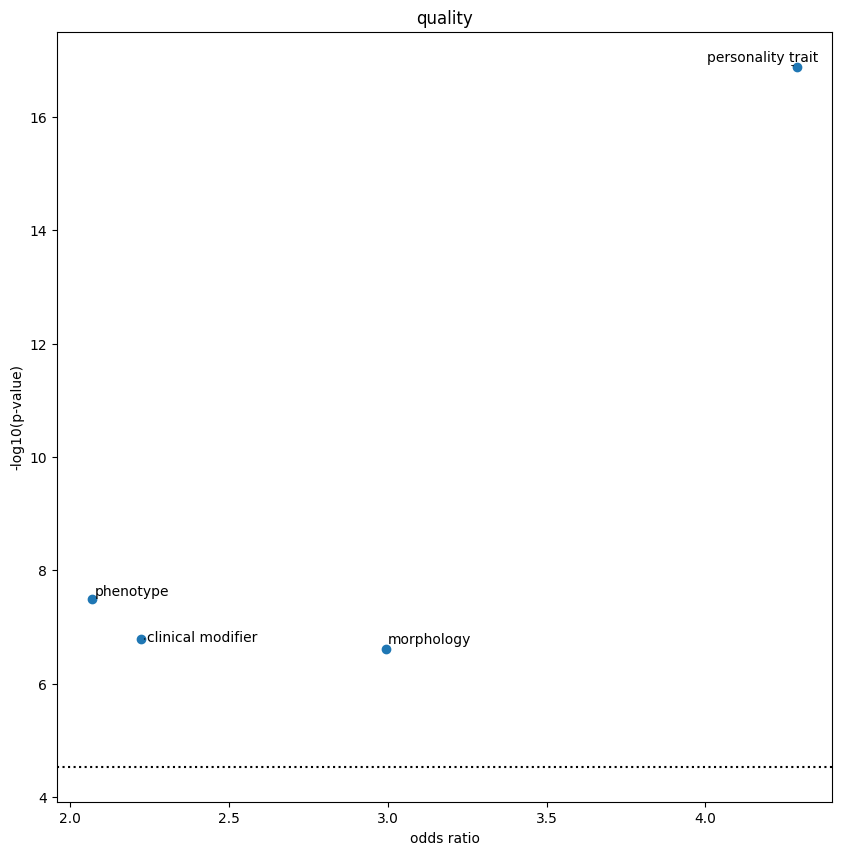

<Figure size 640x480 with 0 Axes>

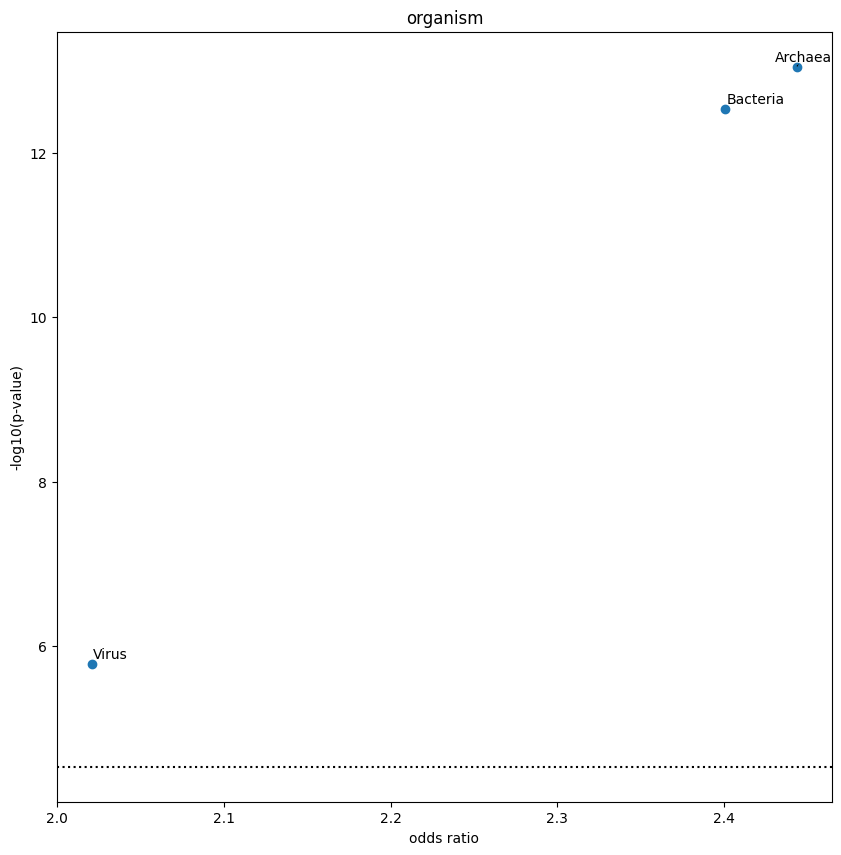

<Figure size 640x480 with 0 Axes>

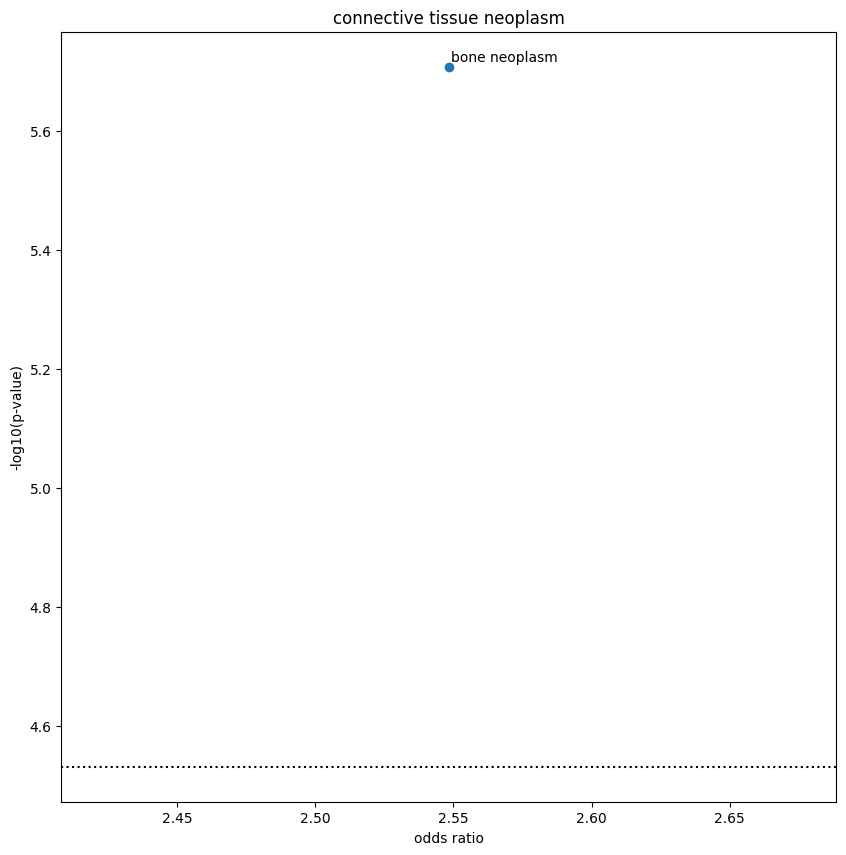

<Figure size 640x480 with 0 Axes>

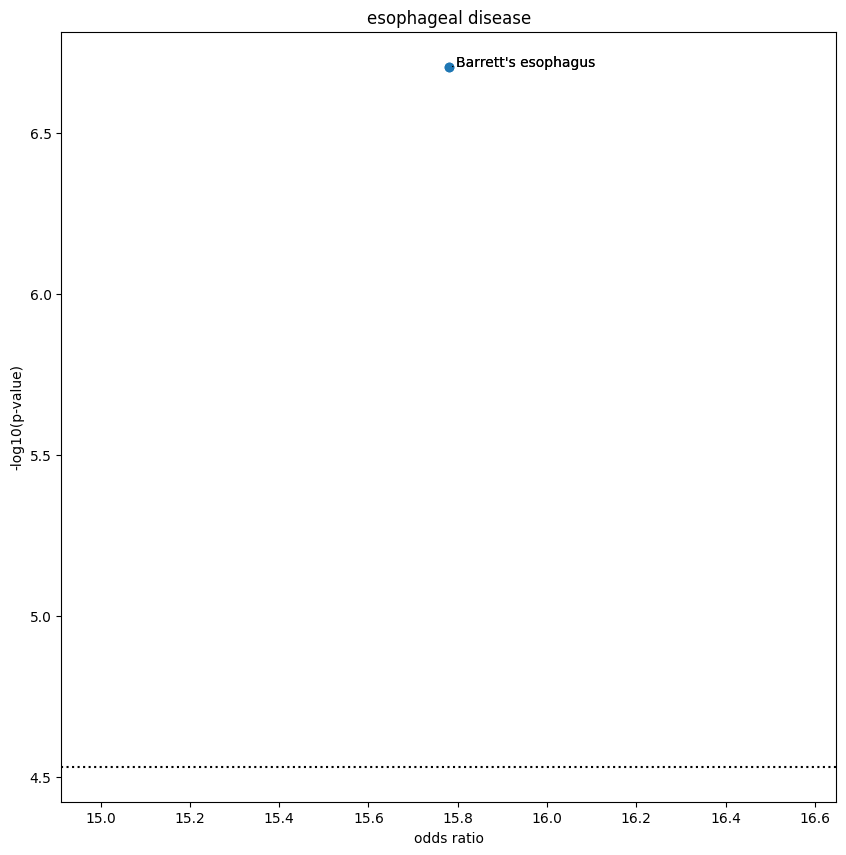

<Figure size 640x480 with 0 Axes>

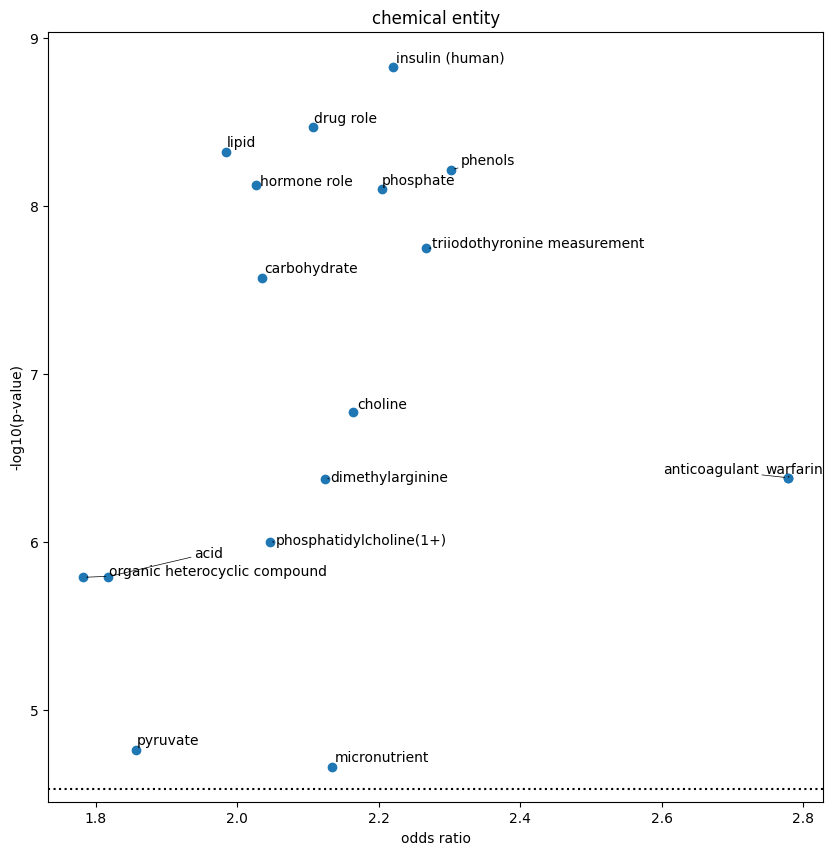

<Figure size 640x480 with 0 Axes>

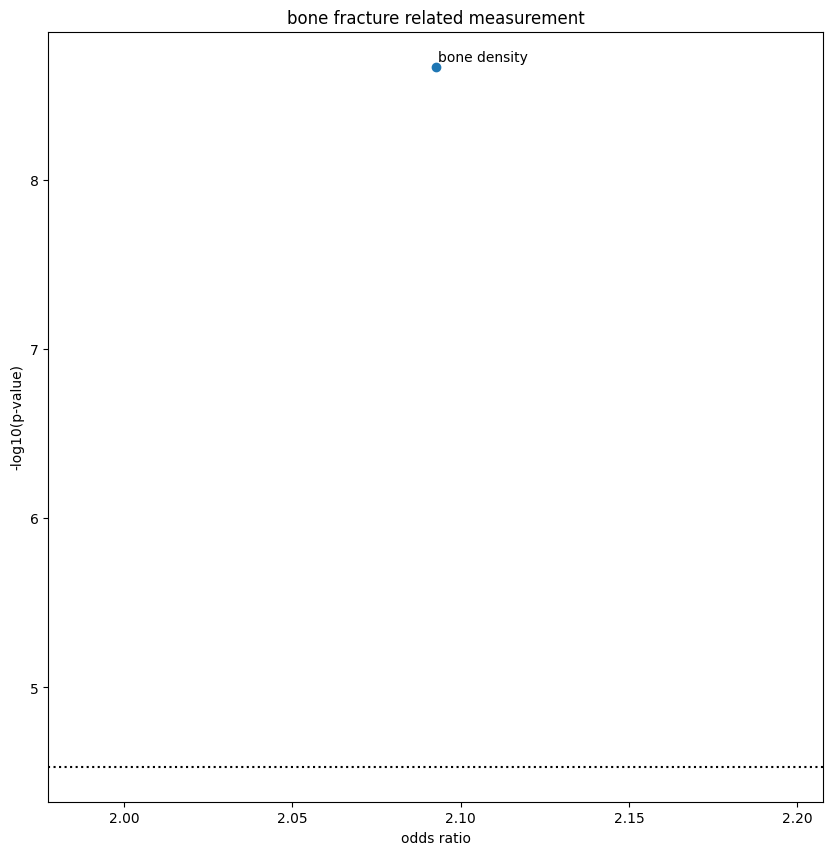

<Figure size 640x480 with 0 Axes>

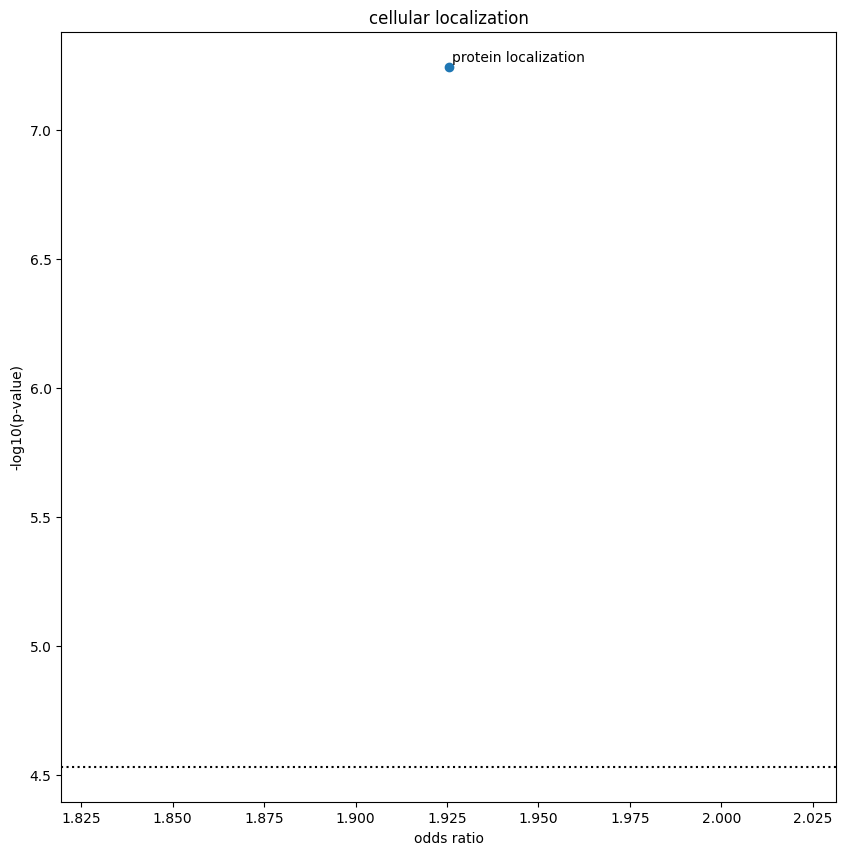

<Figure size 640x480 with 0 Axes>

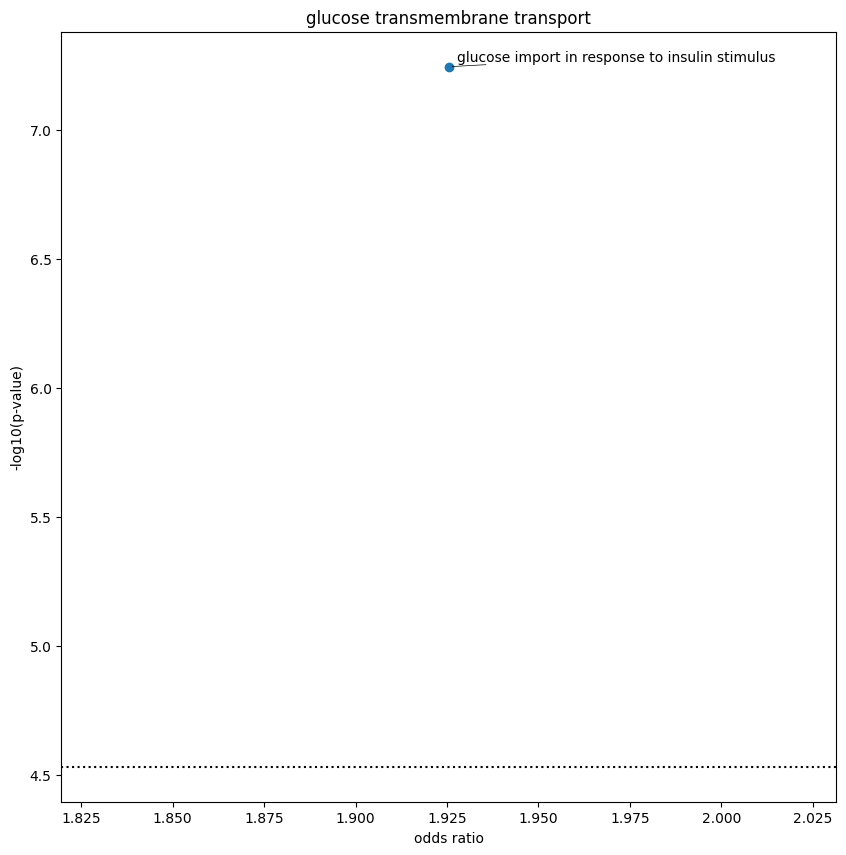

<Figure size 640x480 with 0 Axes>

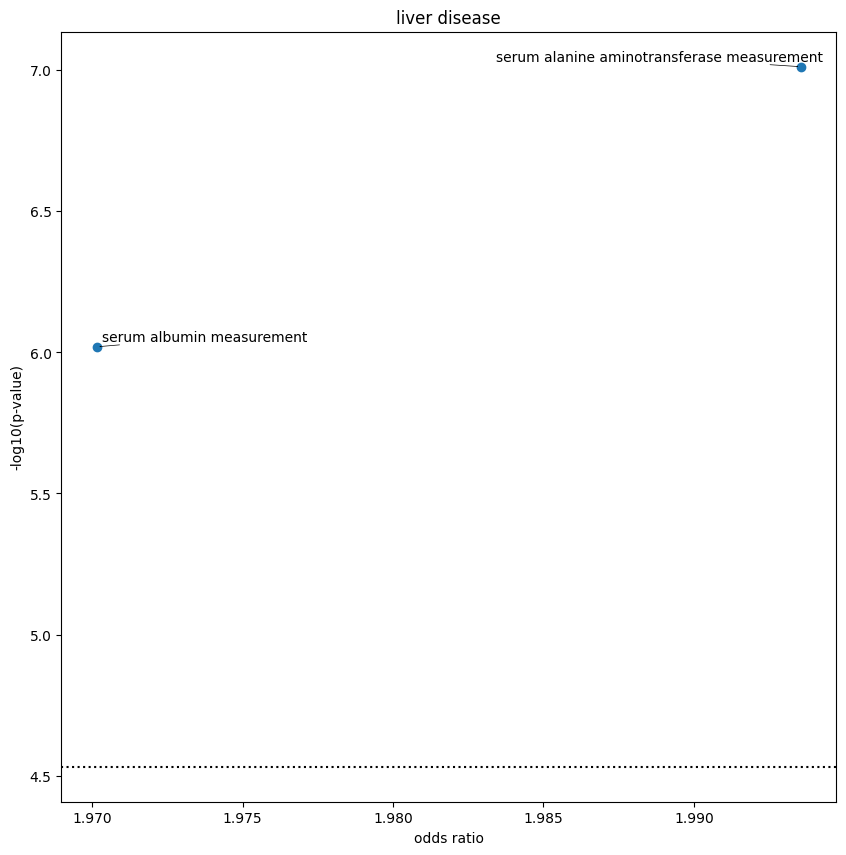

<Figure size 640x480 with 0 Axes>

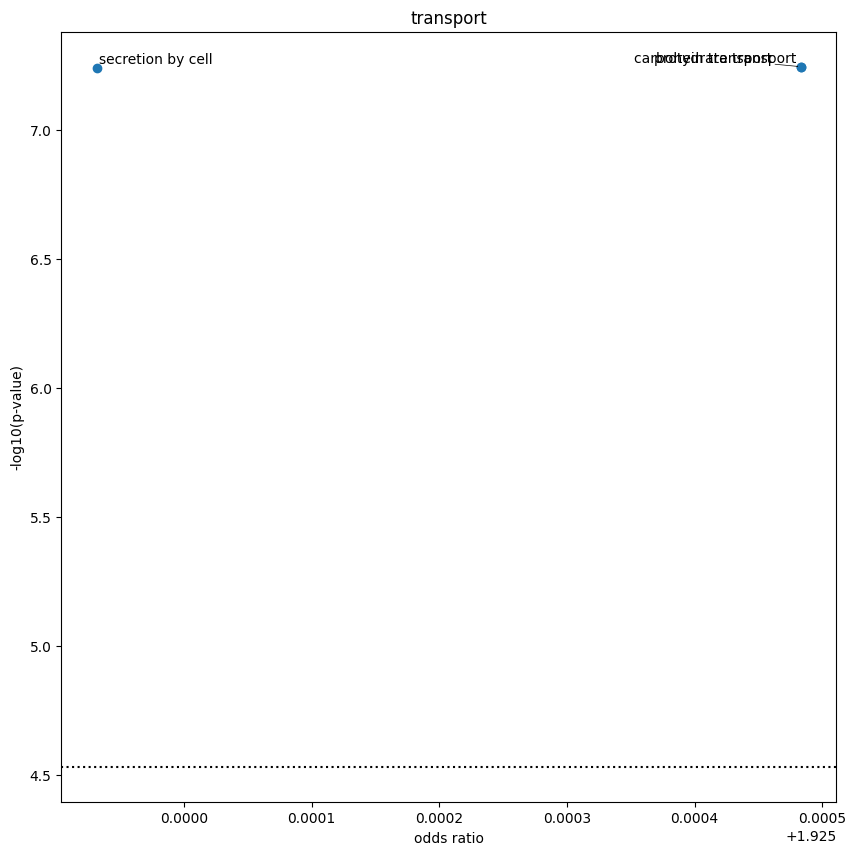

<Figure size 640x480 with 0 Axes>

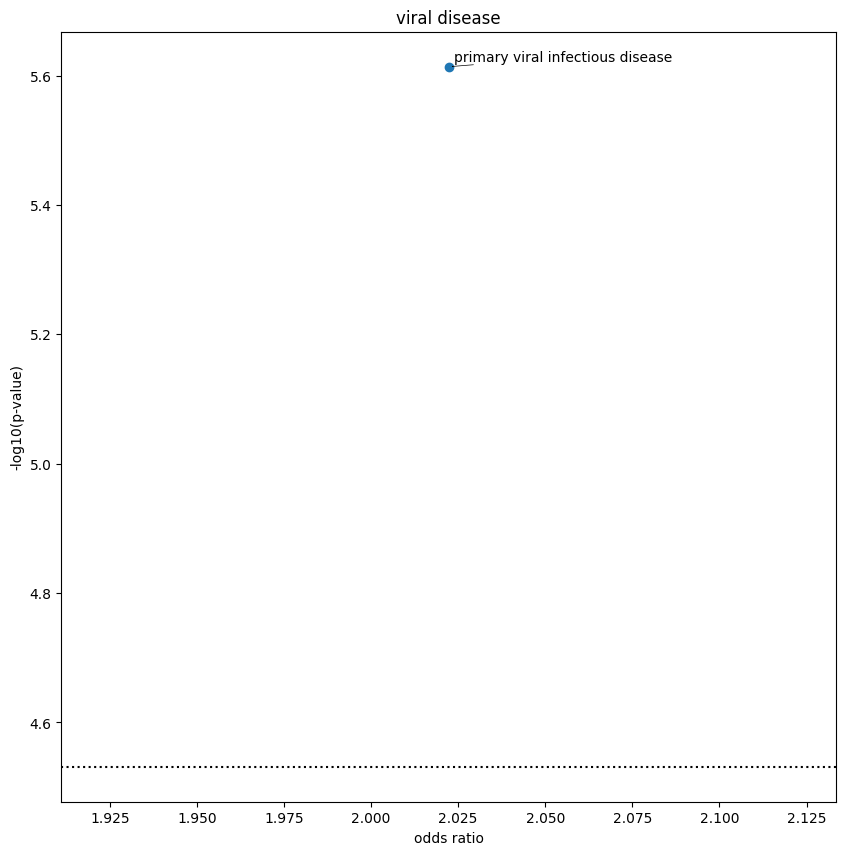

<Figure size 640x480 with 0 Axes>

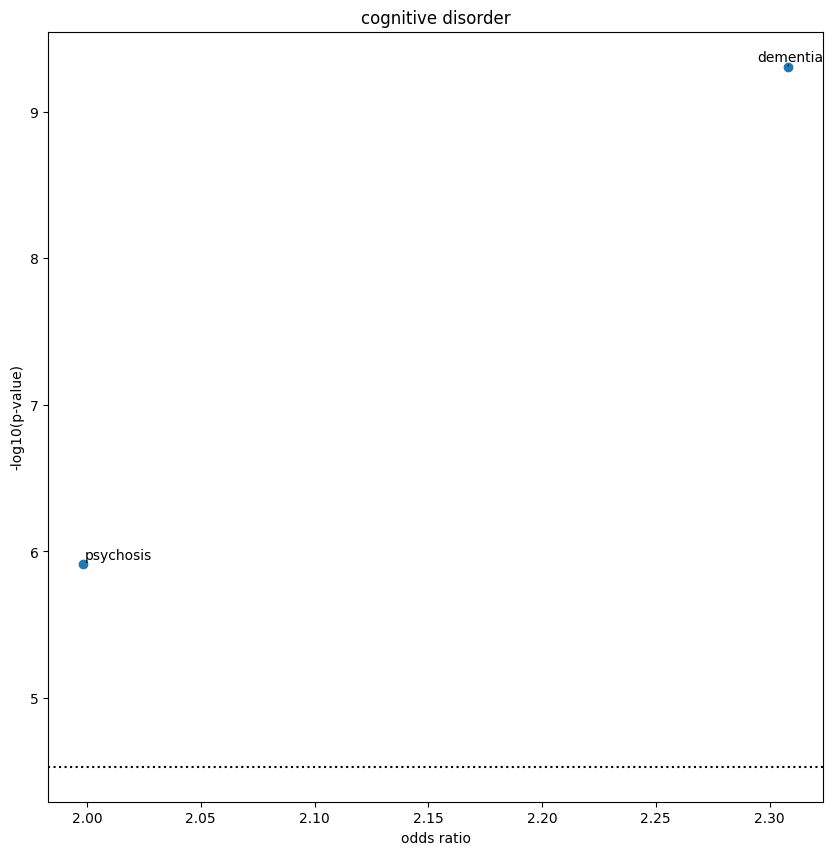

<Figure size 640x480 with 0 Axes>

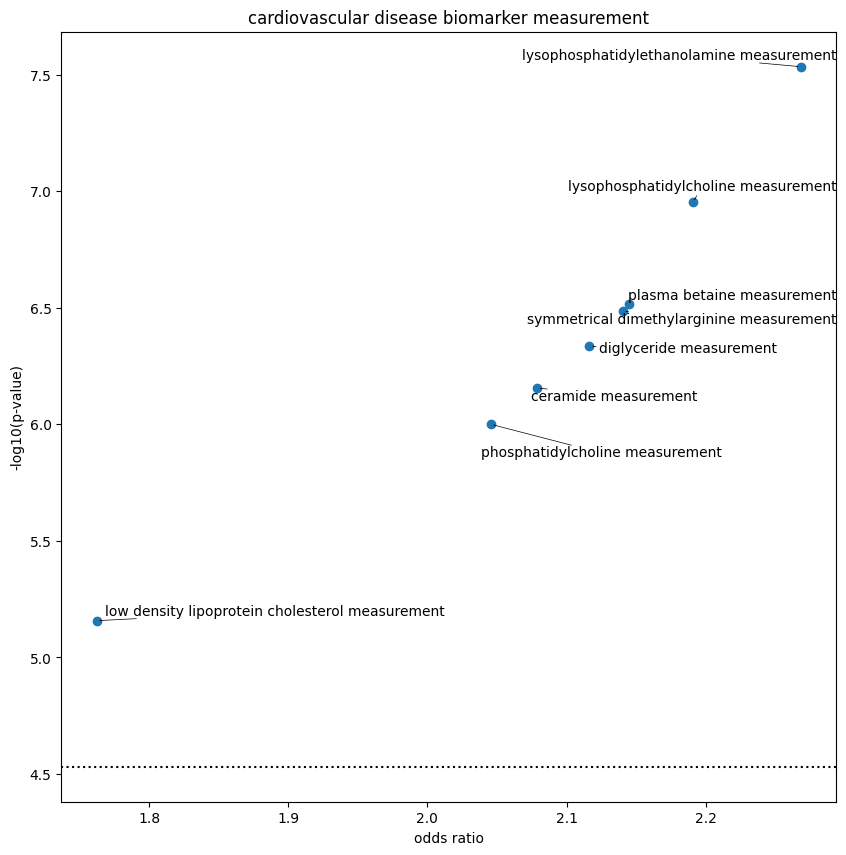

<Figure size 640x480 with 0 Axes>

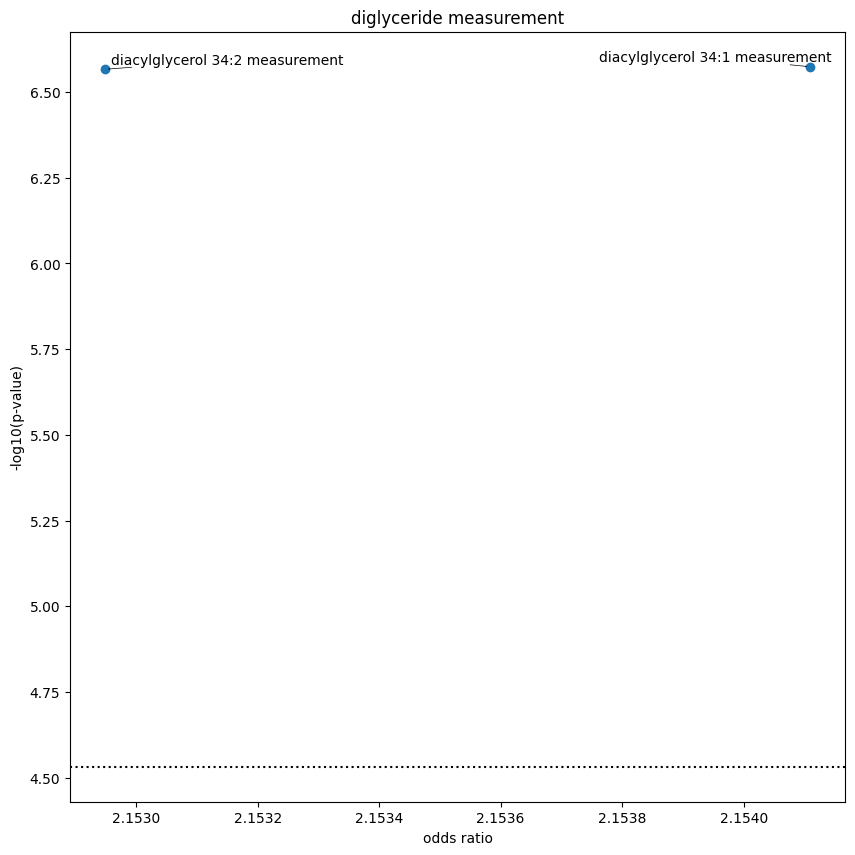

<Figure size 640x480 with 0 Axes>

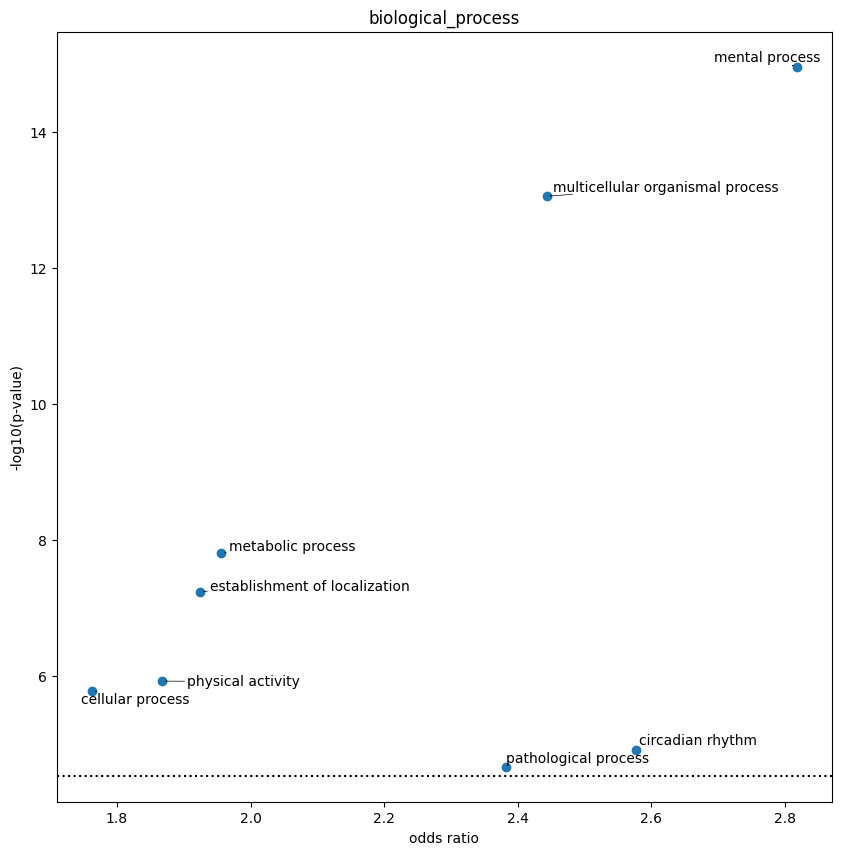

<Figure size 640x480 with 0 Axes>

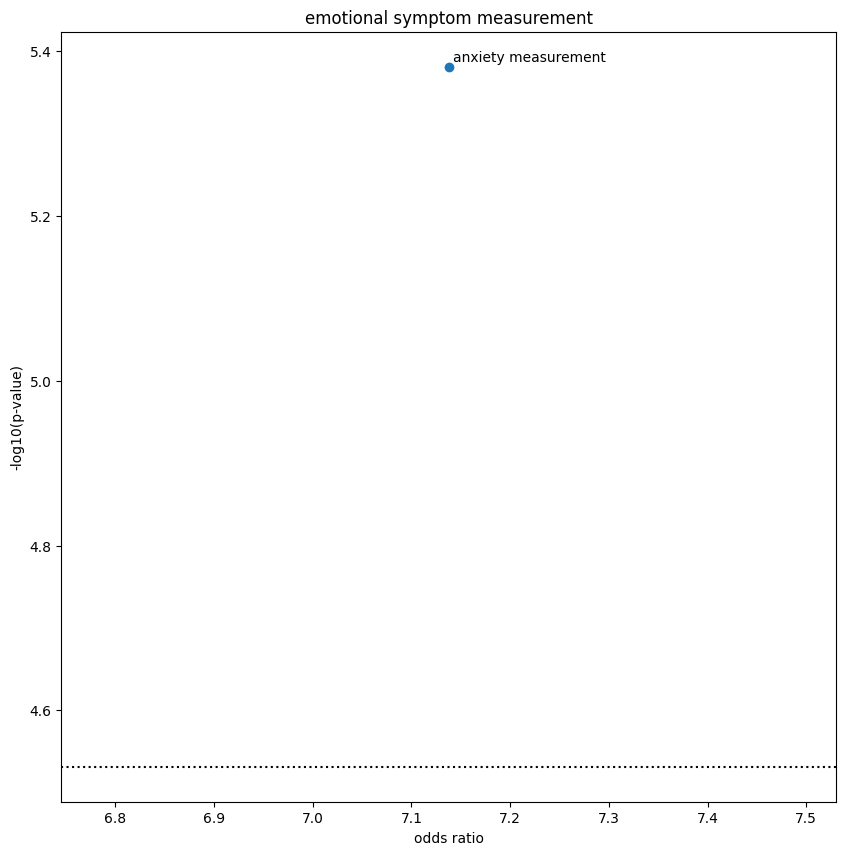

<Figure size 640x480 with 0 Axes>

In [74]:
e=enr_tbl[enr_tbl.parent_trait.isin(set(enr_tbl[enr_tbl['p_intersect']<(0.05/len(enr_tbl))]['parent_trait']))]
e=enr_tbl[enr_tbl['p_intersect']<(0.05/len(enr_tbl))]
for p in set(e.parent_trait):
    t=e[e['parent_trait']==p]
    fig=plt.figure(figsize=(10,10))
    fig=plt.scatter(x=t.odds_ratio,y=-np.log10(t.p_intersect))
    fig=plt.xlabel('odds ratio')
    fig=plt.ylabel('-log10(p-value)')
    fig=plt.title(p)
    fig=plt.axhline(-np.log10(0.05/len(enr_tbl)),color='black',ls=':')
    #fig=plt.axhline(-np.log10(0.05/len(t)),color='black',ls=':')
    texts=[]
    for i in t.index:
        if (t.p_intersect[i]<(0.05/len(enr_tbl))):
            texts.append(plt.annotate(t.trait[i], (t.odds_ratio[i], -np.log10(t.p_intersect[i]))))

    # Adjust text to avoid overlap
    adjust_text(texts, only_move={'points': 'y', 'texts': 'y'}, 
                arrowprops=dict(arrowstyle="->", color='black', lw=0.5))


    plt.show()
    plt.clf()

In [75]:
enr_tbl

,trait,parent_trait,network_genes,odds_ratio,p_intersect
0,family history,clinical history,"{RAPSN, CHRNA2, GABRB1, PCSK2, PSMC3, FOXP1, P...",2.070101,6.123723e-02
1,epigenetic status,epigenetic factor,{NHLRC1},0.588532,8.177840e-01
2,peak expiratory flow,test result,"{DOCK9, CHRNA4, AGBL2, CYFIP2, PSMC3}",0.950978,6.056464e-01
3,bowel opening frequency,measurement,{XKR9},3.982420,2.338790e-01
4,gene expression measurement,measurement,{RNF150},2.596039,3.294880e-01
...,...,...,...,...,...
1695,phosphatidylcholine 34:1 measurement,phosphatidylcholine measurement,"{GRIN2A, XKR5, TMEM132D, GNAO1, ERBB4, ARIH2, ...",2.154109,2.665474e-07
1696,phosphatidylcholine 32:2 measurement,phosphatidylcholine measurement,"{GRIN2A, XKR5, TMEM132D, GNAO1, ERBB4, ARIH2, ...",2.152949,2.711247e-07
1697,phosphatidylcholine 32:1 measurement,phosphatidylcholine measurement,"{GRIN2A, XKR5, TMEM132D, GNAO1, ERBB4, ARIH2, ...",2.154109,2.665474e-07
1698,phosphatidylcholine 32:0 measurement,phosphatidylcholine measurement,"{GRIN2A, XKR5, TMEM132D, GNAO1, ERBB4, ARIH2, ...",2.154109,2.665474e-07


In [76]:
depth=depth+1
enr_tbl['depth']=depth

In [77]:
enr_concat=pd.concat([enr_concat,enr_tbl])

# write enrichment table

In [78]:
enr_concat.to_csv('validation_output/GWAS_enr_'+label_r+'_'+label_h+'_'+interactome_name+'_enr.csv',index=False)

In [79]:
enr_concat

,trait,parent_trait,network_genes,odds_ratio,p_intersect,depth
0,experimental factor,experimental factor,"{DOCK9, XKR5, STXBP1, CPNE4, EDIL3, KIRREL1, T...",1.877877,7.995719e-08,0
1,biological_process,biological_process,"{DOCK9, NRTN, PJA2, ULBP1, XKR5, PTPRZ1, CPNE4...",1.809508,3.662029e-04,0
2,measurement,measurement,"{DOCK9, NRTN, PJA2, FAM8A1, XKR5, ULBP1, PTPRZ...",1.123107,4.480480e-01,0
3,disease,disease,"{DOCK9, NRTN, PJA2, FAM8A1, XKR5, PTPRZ1, CPNE...",1.342777,1.071005e-01,0
0,information entity,experimental factor,"{DOCK9, NRTN, PJA2, FAM8A1, XKR5, ULBP1, PTPRZ...",1.052507,5.193959e-01,1
...,...,...,...,...,...,...
1695,phosphatidylcholine 34:1 measurement,phosphatidylcholine measurement,"{GRIN2A, XKR5, TMEM132D, GNAO1, ERBB4, ARIH2, ...",2.154109,2.665474e-07,3
1696,phosphatidylcholine 32:2 measurement,phosphatidylcholine measurement,"{GRIN2A, XKR5, TMEM132D, GNAO1, ERBB4, ARIH2, ...",2.152949,2.711247e-07,3
1697,phosphatidylcholine 32:1 measurement,phosphatidylcholine measurement,"{GRIN2A, XKR5, TMEM132D, GNAO1, ERBB4, ARIH2, ...",2.154109,2.665474e-07,3
1698,phosphatidylcholine 32:0 measurement,phosphatidylcholine measurement,"{GRIN2A, XKR5, TMEM132D, GNAO1, ERBB4, ARIH2, ...",2.154109,2.665474e-07,3


# list traits of interest (parents) for externalizing related traits

In [ ]:
#list of parent nodes - can only use ones that exist in the EFO
ppsych=['HP:0011446', 'EFO:0006848','EFO:0000677', 'MONDO:0002025'] 
#'Abnormality of mental function','mental or behavioural disorder biomarker', 'mental or behavioural disorder', psychiatric disorder 
pdrug='MONDO:0002494' #'substance-related disorder'
p=ppsych+[pdrug]
# mental or behavioural disorder ('EFO:0000677') child of  brain disease (EFO:0005774) and psychiatric disorder (MONDO:0002025)
   #remove brain disease

In [ ]:
#'NCIT_C180615': Externalizing Disorder Symptoms
# NCIT:C121300: Externalizing Problems Composite Score
print('NCIT:C180615' in nodes)
print('NCIT:C121300' in nodes)

In [ ]:
name_to_id['substance-related disorder']

In [ ]:
id_to_name['EFO:0006848']

## query for 'MONDO:0002494': 'substance-related disorder'

In [ ]:
return_efo_ancestors_name(graph,id_to_name,pdrug)

In [ ]:
psych_term=[]
for i in ppsych:
    psych_term=psych_term+return_efo_descendents_name(graph,id_to_name,i)
psych_ID=[name_to_id[term] for term in psych_term if term in name_to_id]


In [ ]:
SUD_traits=e.intersection(list(nx.ancestors(graph, pdrug))+[pdrug])